In [1]:
%run "..\..\Startup_py3.py"
sys.path.append(r"..\..\..\..\Documents")

import ImageAnalysis3 as ia
%matplotlib notebook

from ImageAnalysis3 import *
print(os.getpid())

import h5py
from ImageAnalysis3.classes import _allowed_kwds
import ast

creating new log file
2022-01-13 18:19:23,352 [INFO] WRITING LOG OUTPUT TO C:\Users\puzheng\.cellpose\run.log
32456


## load codebook

In [2]:
# load codebook
import pandas as pd
codebook_filename = r'\\10.245.74.212\Chromatin_NAS_2\Chromatin_Libraries\CTP-11_brain\Summary_tables\CTP11-mouse-genome-1000_codebook.csv'
codebook_df = pd.read_csv(codebook_filename)
codebook_df.set_index('name')
codebook = np.array(codebook_df[[_name for _name in codebook_df.columns if 'NDB_' in _name]])
print(codebook.shape)
codebook_df

2022-01-13 18:19:27,949 [INFO] Note: NumExpr detected 40 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
2022-01-13 18:19:27,949 [INFO] NumExpr defaulting to 8 threads.
(988, 99)


,name,id,NDB_784,NDB_755,NDB_826,NDB_713,NDB_865,NDB_725,NDB_817,NDB_710,...,NDB_824,NDB_712,NDB_818,NDB_940,NDB_872,NDB_934,NDB_926,NDB_910,chr,chr_order
0,1:3740000-3760000,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,1:6240000-6260000,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
2,1:8740000-8760000,3,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,2
3,1:11240000-11260000,4,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,3
4,1:13740000-13760000,5,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
983,X:161240000-161260000,1057,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,X,52
984,X:163740000-163760000,1058,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,X,53
985,X:166240000-166260000,1059,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,X,54
986,X:168740000-168760000,1060,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,X,55


In [3]:
codebook.shape

(988, 99)

## load spot image

In [4]:
reload(ia.correction_tools.translate)

<module 'ImageAnalysis3.correction_tools.translate' from '..\\..\\..\\..\\Documents\\ImageAnalysis3\\correction_tools\\translate.py'>

In [5]:
reload(ia.classes.preprocess)
from ImageAnalysis3.classes.preprocess import Spots3D, ImageCrop_3d, SpotTuple
reload(ia.spot_tools.scoring)
from ImageAnalysis3.spot_tools.scoring import Normalize_Intensities
from ImageAnalysis3.classes import decode
reload(ia.classes.decode)
from ImageAnalysis3.classes.decode import Merfish_Decoder, DNA_Merfish_Decoder

from scipy.spatial.distance import cdist

In [1205]:
spot_filenames[33:]

['M:\\Pu_Temp\\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\\CandSpots\\Conv_zscan_000_Cell-4_CandSpots.pkl',
 'M:\\Pu_Temp\\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\\CandSpots\\Conv_zscan_000_Cell-5_CandSpots.pkl',
 'M:\\Pu_Temp\\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\\CandSpots\\Conv_zscan_000_Cell-6_CandSpots.pkl',
 'M:\\Pu_Temp\\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\\CandSpots\\Conv_zscan_000_Cell-7_CandSpots.pkl',
 'M:\\Pu_Temp\\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\\CandSpots\\Conv_zscan_000_Cell-8_CandSpots.pkl',
 'M:\\Pu_Temp\\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\\CandSpots\\Conv_zscan_000_Cell-9_CandSpots.pkl',
 'M:\\Pu_Temp\\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\\CandSpots\\Conv_zscan_001_Cell-10_CandSpots.pkl',
 'M:\\Pu_Temp\\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\\CandSpots\\Conv_zscan_001_Cell-11_CandSpots.pkl',
 'M:\\Pu_Temp\\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\\CandSpots\\Conv_zscan_001_Cell

In [ ]:
%matplotlib inline
pixel_sizes = np.array([250,108,108])
keep_ratio_th = 0.2
num_homologs = 2

valid_score_th = -10

spot_file_folder = r'M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots'

spot_filenames = [os.path.join(spot_file_folder, _fl) for _fl in os.listdir(spot_file_folder)]

for spot_filename in spot_filenames[33:]:
    cand_spots_dict = pickle.load(open(spot_filename, 'rb'))
    total_num_spots = np.sum([len(_spots) for _spots in cand_spots_dict.values()])
    print(spot_filename, total_num_spots)
    if total_num_spots < num_homologs * codebook.sum() * keep_ratio_th:
        continue
    
    cand_spots_list = []
    for _i in np.arange(1, codebook.shape[1]+1):
        if _i in cand_spots_dict:
            cand_spots_list.append(Spots3D(cand_spots_dict[_i], bits=_i))
        else:
            cand_spots_list.append([])
            
    # create decoder folder
    decoder_filename = spot_filename.replace('CandSpots', 'Decoder')
    if not os.path.exists(os.path.dirname(decoder_filename)):
        print(os.path.dirname(decoder_filename))
        os.makedirs(os.path.dirname(decoder_filename))

    # create decoder class
    decoder = DNA_Merfish_Decoder(cand_spots_list, codebook_filename, 
                                  pixel_sizes=pixel_sizes, valid_score_th=valid_score_th,
                                  savefile=decoder_filename,
                                  )

    decoder.prepare_spot_tuples(pair_search_radius=250)

    self_scores = decoder.calculate_self_scores(make_plots=False)

    chrs_2_init_centers = decoder.init_homolog_assignment()

    chr_2_assigned_tuple_list, chr_2_zxys_list, chr_2_chr_centers= \
        decoder.finish_homolog_assignment(plot_stats=False, verbose=True)

    figure_zxys_list, figure_labels, figure_label_ids = decoder.summarize_zxys_all_chromosomes()

    # distmap
    distmap_filename = decoder_filename.replace('Decoder.pkl', 'AllDistmap.png')
    _ax = decoder.summarize_to_distmap(decoder, save_filename=distmap_filename) 

    decoder.save(overwrite=True)

M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_000_Cell-4_CandSpots.pkl 227
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_000_Cell-5_CandSpots.pkl 3760
- Loading decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_000_Cell-5_Decoder.pkl
3736 pairs kept given search radius 250 nm.


3736it [00:07, 487.35it/s]


- 3237 spot groups selected. 


..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_000_Cell-5_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_000_Cell-6_CandSpots.pkl 128
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_000_Cell-7_CandSpots.pkl 3398
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_000_Cell-7_Decoder.pkl doesn't exists
3471 pairs kept given search radius 250 nm.


3471it [00:07, 494.02it/s]


- 3002 spot groups selected. 
-- seeding chr:1 with 77 regions with 42 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0238
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 37 spot_groups
- diff in iter-0: 0.9459
- diff in iter-1: 0.0270
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 35 spot_groups
- diff in iter-0: 0.9429
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 36 spot_groups
- diff in iter-0: 0.8611
- diff in iter-1: 0.0556
- diff in iter-2: 0.0278
- diff in iter-3: 0.0000
-- seeding chr:13 with 45 regions with 38 spot_groups
- diff in iter-0: 0.8947
- diff in iter-1: 0.0263
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 20 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 26 spot_groups
- diff in iter-0: 0.9615
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with *109 spot_groups
- diff in iter-0: 0.5596
- diff in iter-1: 0.0367
- diff in it

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_000_Cell-7_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_000_Cell-8_CandSpots.pkl 3554
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_000_Cell-8_Decoder.pkl doesn't exists
2868 pairs kept given search radius 250 nm.


2868it [00:05, 555.06it/s]


- 2345 spot groups selected. 
-- seeding chr:1 with 77 regions with 57 spot_groups
- diff in iter-0: 0.8947
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 30 spot_groups
- diff in iter-0: 0.9667
- diff in iter-1: 0.1000
- diff in iter-2: 0.0667
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with 23 spot_groups
- diff in iter-0: 0.9130
- diff in iter-1: 0.0435
- diff in iter-2: 0.0435
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 28 spot_groups
- diff in iter-0: 0.9643
- diff in iter-1: 0.1071
- diff in iter-2: 0.0357
- diff in iter-3: 0.0000
-- seeding chr:13 with 45 regions with 28 spot_groups
- diff in iter-0: 0.9643
- diff in iter-1: 0.0714
- diff in iter-2: 0.0357
- diff in iter-3: 0.0000
-- seeding chr:14 with 42 regions with 31 spot_groups
- diff in iter-0: 0.9355
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 23 spot_groups
- diff in iter-0: 0.9130
- diff in iter-1: 0.0435
- diff in iter-2: 0.0000
-- seeding chr:16 

- diff in iter-7: 0.0078
- diff in iter-8: 0.0000
- processing chr:7
- diff in iter-0: 0.6348
- diff in iter-1: 0.1304
- diff in iter-2: 0.0783
- diff in iter-3: 0.0435
- diff in iter-4: 0.0261
- diff in iter-5: 0.0348
- diff in iter-6: 0.0174
- diff in iter-7: 0.0000
- processing chr:8
- diff in iter-0: 0.5517
- diff in iter-1: 0.1034
- diff in iter-2: 0.0690
- diff in iter-3: 0.0172
- diff in iter-4: 0.0000
- processing chr:9
- diff in iter-0: 0.6117
- diff in iter-1: 0.0777
- diff in iter-2: 0.0000
- processing chr:X
- diff in iter-0: 0.5878
- diff in iter-1: 0.1069
- diff in iter-2: 0.0534
- diff in iter-3: 0.0305
- diff in iter-4: 0.0229
- diff in iter-5: 0.0153
- diff in iter-6: 0.0153
- diff in iter-7: 0.0153
- diff in iter-8: 0.0153
- diff in iter-9: 0.0153
- diff in iter-10: 0.0153
- diff in iter-11: 0.0153
- diff in iter-12: 0.0153
- diff in iter-13: 0.0153
- diff in iter-14: 0.0153
- diff in iter-15: 0.0153
- diff in iter-16: 0.0153
- diff in iter-17: 0.0153
- diff in iter-1

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_000_Cell-8_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_000_Cell-9_CandSpots.pkl 1727
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_000_Cell-9_Decoder.pkl doesn't exists
1500 pairs kept given search radius 250 nm.


1500it [00:02, 609.51it/s]


- 1235 spot groups selected. 
-- seeding chr:1 with 77 regions with 40 spot_groups
- diff in iter-0: 0.9500
- diff in iter-1: 0.0250
- diff in iter-2: 0.0500
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with *43 spot_groups
- diff in iter-0: 0.9070
- diff in iter-1: 0.0698
- diff in iter-2: 0.0465
- diff in iter-3: 0.0233
- diff in iter-4: 0.0000
-- seeding chr:11 with 48 regions with 20 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with *54 spot_groups
- diff in iter-0: 0.7778
- diff in iter-1: 0.0556
- diff in iter-2: 0.0370
- diff in iter-3: 0.0000
-- seeding chr:13 with 45 regions with *50 spot_groups
- diff in iter-0: 0.8600
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with *45 spot_groups
- diff in iter-0: 0.8667
- diff in iter-1: 0.0222
- diff in iter-2: 0.0667
- diff in iter-3: 0.0222
- diff in iter-4: 0.0000
-- seeding chr:15 with 40 regions with *47 spot_groups
- diff in iter-0: 0.8511
- diff in ite

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_000_Cell-9_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-10_CandSpots.pkl 15466
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-10_Decoder.pkl doesn't exists
19755 pairs kept given search radius 250 nm.


19755it [01:31, 215.15it/s]


- 16827 spot groups selected. 
-- seeding chr:1 with 77 regions with 164 spot_groups
- diff in iter-0: 0.5854
- diff in iter-1: 0.0305
- diff in iter-2: 0.0183
- diff in iter-3: 0.0427
- diff in iter-4: 0.0183
- diff in iter-5: 0.0122
- diff in iter-6: 0.0000
-- seeding chr:10 with 51 regions with 139 spot_groups
- diff in iter-0: 0.6043
- diff in iter-1: 0.0360
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 138 spot_groups
- diff in iter-0: 0.5145
- diff in iter-1: 0.0362
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 117 spot_groups
- diff in iter-0: 0.5214
- diff in iter-1: 0.0171
- diff in iter-2: 0.0171
- diff in iter-3: 0.0171
- diff in iter-4: 0.0085
- diff in iter-5: 0.0171
- diff in iter-6: 0.0342
- diff in iter-7: 0.0085
- diff in iter-8: 0.0000
-- seeding chr:13 with 45 regions with 109 spot_groups
- diff in iter-0: 0.5872
- diff in iter-1: 0.0459
- diff in iter-2: 0.0183
- diff in iter-3: 0.0000
-- seeding chr:14 with 42 regions with 109 sp

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-10_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-11_CandSpots.pkl 21132
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-11_Decoder.pkl doesn't exists
26944 pairs kept given search radius 250 nm.


26944it [02:32, 176.24it/s]


- 23022 spot groups selected. 
-- seeding chr:1 with 77 regions with 253 spot_groups
- diff in iter-0: 0.4822
- diff in iter-1: 0.0237
- diff in iter-2: 0.0119
- diff in iter-3: 0.0119
- diff in iter-4: 0.0000
-- seeding chr:10 with 51 regions with 176 spot_groups
- diff in iter-0: 0.4659
- diff in iter-1: 0.0227
- diff in iter-2: 0.0114
- diff in iter-3: 0.0341
- diff in iter-4: 0.0398
- diff in iter-5: 0.0227
- diff in iter-6: 0.0284
- diff in iter-7: 0.0057
- diff in iter-8: 0.0114
- diff in iter-9: 0.0057
- diff in iter-10: 0.0000
-- seeding chr:11 with 48 regions with 192 spot_groups
- diff in iter-0: 0.4323
- diff in iter-1: 0.0417
- diff in iter-2: 0.0260
- diff in iter-3: 0.0365
- diff in iter-4: 0.0104
- diff in iter-5: 0.0000
-- seeding chr:12 with 43 regions with 131 spot_groups
- diff in iter-0: 0.4885
- diff in iter-1: 0.0687
- diff in iter-2: 0.0305
- diff in iter-3: 0.0153
- diff in iter-4: 0.0305
- diff in iter-5: 0.0000
-- seeding chr:13 with 45 regions with 179 spot_g

- diff in iter-1: 0.0142
- diff in iter-2: 0.0085
- diff in iter-3: 0.0047
- diff in iter-4: 0.0038
- diff in iter-5: 0.0000
- processing chr:9
- diff in iter-0: 0.0921
- diff in iter-1: 0.0184
- diff in iter-2: 0.0175
- diff in iter-3: 0.0126
- diff in iter-4: 0.0107
- diff in iter-5: 0.0068
- diff in iter-6: 0.0068
- diff in iter-7: 0.0048
- diff in iter-8: 0.0058
- diff in iter-9: 0.0029
- diff in iter-10: 0.0019
- processing chr:X
- diff in iter-0: 0.0944
- diff in iter-1: 0.0077
- diff in iter-2: 0.0060
- diff in iter-3: 0.0094
- diff in iter-4: 0.0051
- diff in iter-5: 0.0051
- diff in iter-6: 0.0026
- diff in iter-7: 0.0000
- processing chr:Y
- diff in iter-0: 0.0769
- diff in iter-1: 0.0000


..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-11_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-12_CandSpots.pkl 7438
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-12_Decoder.pkl doesn't exists
7315 pairs kept given search radius 250 nm.


7315it [00:18, 393.91it/s]


- 5998 spot groups selected. 
-- seeding chr:1 with 77 regions with 96 spot_groups
- diff in iter-0: 0.8333
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 65 spot_groups
- diff in iter-0: 0.6769
- diff in iter-1: 0.0462
- diff in iter-2: 0.0308
- diff in iter-3: 0.0154
- diff in iter-4: 0.0000
-- seeding chr:11 with 48 regions with 60 spot_groups
- diff in iter-0: 0.7667
- diff in iter-1: 0.0167
- diff in iter-2: 0.0333
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 66 spot_groups
- diff in iter-0: 0.6364
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with 61 spot_groups
- diff in iter-0: 0.8033
- diff in iter-1: 0.0492
- diff in iter-2: 0.0328
- diff in iter-3: 0.0164
- diff in iter-4: 0.0328
- diff in iter-5: 0.0328
- diff in iter-6: 0.0492
- diff in iter-7: 0.0328
- diff in iter-8: 0.0492
- diff in iter-9: 0.0164
- diff in iter-10: 0.0000
-- seeding chr:14 with 42 regions with 56 spot_groups
- diff in iter-0: 0.7143
- diff in iter-1: 0.0

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-12_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-13_CandSpots.pkl 4820
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-13_Decoder.pkl doesn't exists
4589 pairs kept given search radius 250 nm.


4589it [00:09, 474.07it/s]


- 3747 spot groups selected. 
-- seeding chr:1 with 77 regions with 77 spot_groups
- diff in iter-0: 0.8442
- diff in iter-1: 0.0130
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 56 spot_groups
- diff in iter-0: 0.8214
- diff in iter-1: 0.0714
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 67 spot_groups
- diff in iter-0: 0.7313
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 46 spot_groups
- diff in iter-0: 0.8478
- diff in iter-1: 0.0217
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 52 spot_groups
- diff in iter-0: 0.8269
- diff in iter-1: 0.0769
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 45 spot_groups
- diff in iter-0: 0.8889
- diff in iter-1: 0.0667
- diff in iter-2: 0.0222
- diff in iter-3: 0.0000
-- seeding chr:15 with 40 regions with 38 spot_groups
- diff in iter-0: 0.8947
- diff in iter-1: 0.0526
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with 22 spot_groups
- diff in iter

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-13_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-14_CandSpots.pkl 14046
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-14_Decoder.pkl doesn't exists
13382 pairs kept given search radius 250 nm.


13382it [00:45, 293.99it/s]


- 11051 spot groups selected. 
-- seeding chr:1 with 77 regions with 201 spot_groups
- diff in iter-0: 0.5522
- diff in iter-1: 0.0597
- diff in iter-2: 0.0299
- diff in iter-3: 0.0299
- diff in iter-4: 0.0249
- diff in iter-5: 0.0249
- diff in iter-6: 0.0100
- diff in iter-7: 0.0100
- diff in iter-8: 0.0000
-- seeding chr:10 with 51 regions with 139 spot_groups
- diff in iter-0: 0.5252
- diff in iter-1: 0.0863
- diff in iter-2: 0.0432
- diff in iter-3: 0.0504
- diff in iter-4: 0.0216
- diff in iter-5: 0.0432
- diff in iter-6: 0.0216
- diff in iter-7: 0.0216
- diff in iter-8: 0.0000
-- seeding chr:11 with 48 regions with 127 spot_groups
- diff in iter-0: 0.5433
- diff in iter-1: 0.0315
- diff in iter-2: 0.0157
- diff in iter-3: 0.0157
- diff in iter-4: 0.0315
- diff in iter-5: 0.0236
- diff in iter-6: 0.0394
- diff in iter-7: 0.0394
- diff in iter-8: 0.0236
- diff in iter-9: 0.0157
- diff in iter-10: 0.0000
-- seeding chr:12 with 43 regions with 105 spot_groups
- diff in iter-0: 0.5143

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-14_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-15_CandSpots.pkl 3535
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-15_Decoder.pkl doesn't exists
4530 pairs kept given search radius 250 nm.


4530it [00:10, 450.34it/s]


- 3899 spot groups selected. 
-- seeding chr:1 with 77 regions with 52 spot_groups
- diff in iter-0: 0.9808
- diff in iter-1: 0.0192
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 36 spot_groups
- diff in iter-0: 0.9722
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 24 spot_groups
- diff in iter-0: 0.9167
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 22 spot_groups
- diff in iter-0: 0.9091
- diff in iter-1: 0.0909
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 22 spot_groups
- diff in iter-0: 0.9545
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with *173 spot_groups
- diff in iter-0: 0.4509
- diff in iter-1: 0.0231
- diff in iter-2: 0.0116
- diff in iter-3: 0.0116
- diff in iter-4: 0.0116
- diff in iter-5: 0.0116
- diff in iter-6: 0.0058
- diff in iter-7: 0.0058
- diff in iter-8: 0.0000
-- seeding chr:15 with 40 regions with 23 spot_groups
- diff in iter-0: 0.9130
- diff in iter-1: 0.0000
-- seeding chr:1

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-15_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-16_CandSpots.pkl 5833
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-16_Decoder.pkl doesn't exists
6825 pairs kept given search radius 250 nm.


6825it [00:17, 391.39it/s]


- 5819 spot groups selected. 
-- seeding chr:1 with 77 regions with 103 spot_groups
- diff in iter-0: 0.8252
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 45 spot_groups
- diff in iter-0: 0.8000
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 46 spot_groups
- diff in iter-0: 0.9130
- diff in iter-1: 0.0870
- diff in iter-2: 0.0217
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 53 spot_groups
- diff in iter-0: 0.7736
- diff in iter-1: 0.0755
- diff in iter-2: 0.0377
- diff in iter-3: 0.0000
-- seeding chr:13 with 45 regions with 57 spot_groups
- diff in iter-0: 0.8070
- diff in iter-1: 0.0877
- diff in iter-2: 0.0175
- diff in iter-3: 0.0000
-- seeding chr:14 with 42 regions with 39 spot_groups
- diff in iter-0: 0.8462
- diff in iter-1: 0.0256
- diff in iter-2: 0.0256
- diff in iter-3: 0.0000
-- seeding chr:15 with 40 regions with 42 spot_groups
- diff in iter-0: 0.9048
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with 47 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-16_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-17_CandSpots.pkl 5188
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-17_Decoder.pkl doesn't exists
6113 pairs kept given search radius 250 nm.


6113it [00:15, 401.43it/s]


- 5211 spot groups selected. 
-- seeding chr:1 with 77 regions with 77 spot_groups
- diff in iter-0: 0.8312
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 56 spot_groups
- diff in iter-0: 0.8036
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 39 spot_groups
- diff in iter-0: 0.8205
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 48 spot_groups
- diff in iter-0: 0.8958
- diff in iter-1: 0.0625
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 39 spot_groups
- diff in iter-0: 0.8718
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 41 spot_groups
- diff in iter-0: 0.8537
- diff in iter-1: 0.0244
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 52 spot_groups
- diff in iter-0: 0.8269
- diff in iter-1: 0.0385
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with 23 spot_groups
- diff in iter-0: 0.9130
- diff in iter-1: 0.1304
- diff in iter-2: 0.0000
-- seeding chr:17 with 36 regions with 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-17_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-18_CandSpots.pkl 4579
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-18_Decoder.pkl doesn't exists
6041 pairs kept given search radius 250 nm.


6041it [00:14, 416.65it/s]


- 4984 spot groups selected. 
-- seeding chr:1 with 77 regions with 70 spot_groups
- diff in iter-0: 0.9000
- diff in iter-1: 0.0286
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 42 spot_groups
- diff in iter-0: 0.9286
- diff in iter-1: 0.0952
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 33 spot_groups
- diff in iter-0: 0.9394
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 39 spot_groups
- diff in iter-0: 0.9231
- diff in iter-1: 0.1026
- diff in iter-2: 0.1026
- diff in iter-3: 0.0769
- diff in iter-4: 0.0000
-- seeding chr:13 with 45 regions with 37 spot_groups
- diff in iter-0: 0.9189
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 39 spot_groups
- diff in iter-0: 0.8718
- diff in iter-1: 0.1026
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 24 spot_groups
- diff in iter-0: 0.9583
- diff in iter-1: 0.0417
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with 32 spot_groups
- diff in iter

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-18_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-19_CandSpots.pkl 3052
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-19_Decoder.pkl doesn't exists
3467 pairs kept given search radius 250 nm.


3467it [00:06, 505.25it/s]


- 2854 spot groups selected. 
-- seeding chr:1 with 77 regions with 49 spot_groups
- diff in iter-0: 0.9184
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with *141 spot_groups
- diff in iter-0: 0.6099
- diff in iter-1: 0.0142
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 30 spot_groups
- diff in iter-0: 0.9333
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 41 spot_groups
- diff in iter-0: 0.9268
- diff in iter-1: 0.0244
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with *120 spot_groups
- diff in iter-0: 0.6333
- diff in iter-1: 0.0500
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 25 spot_groups
- diff in iter-0: 0.9200
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 21 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with *98 spot_groups
- diff in iter-0: 0.6837
- diff in iter-1: 0.0612
- diff in iter-2: 0.0510
- diff in iter-3: 0.0102
- diff in

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-19_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-1_CandSpots.pkl 1357
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-1_Decoder.pkl doesn't exists
1645 pairs kept given search radius 250 nm.


1645it [00:02, 558.57it/s]


- 1386 spot groups selected. 
-- seeding chr:1 with 77 regions with *115 spot_groups
- diff in iter-0: 0.8000
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with *72 spot_groups
- diff in iter-0: 0.7639
- diff in iter-1: 0.0556
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with *48 spot_groups
- diff in iter-0: 0.9167
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with *49 spot_groups
- diff in iter-0: 0.8571
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with *60 spot_groups
- diff in iter-0: 0.9000
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with *47 spot_groups
- diff in iter-0: 0.9574
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with *36 spot_groups
- diff in iter-0: 0.8333
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with *57 spot_groups
- diff in iter-0: 0.8070
- diff in iter-1: 0.0000
-- seeding chr:17 with 36 regions with *47 spot_groups
- diff in iter-0: 0.8298
- diff in iter-1: 0.0000


..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-1_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-20_CandSpots.pkl 4803
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-20_Decoder.pkl doesn't exists
5519 pairs kept given search radius 250 nm.


5519it [00:13, 421.65it/s]


- 4727 spot groups selected. 
-- seeding chr:1 with 77 regions with 48 spot_groups
- diff in iter-0: 0.9583
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 45 spot_groups
- diff in iter-0: 0.9778
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 28 spot_groups
- diff in iter-0: 0.9286
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 33 spot_groups
- diff in iter-0: 0.9394
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with 40 spot_groups
- diff in iter-0: 0.9500
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 35 spot_groups
- diff in iter-0: 0.9714
- diff in iter-1: 0.0286
- diff in iter-2: 0.0286
- diff in iter-3: 0.0000
-- seeding chr:15 with 40 regions with 27 spot_groups
- diff in iter-0: 0.8889
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with 28 spot_groups
- diff in iter-0: 0.8929
- diff in iter-1: 0.0000
-- seeding chr:17 with 36 regions with 29 spot_groups
- diff in iter-0: 0.9310
- diff in 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-20_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-21_CandSpots.pkl 2926
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-21_Decoder.pkl doesn't exists
3158 pairs kept given search radius 250 nm.


3158it [00:06, 519.32it/s]


- 2645 spot groups selected. 
-- seeding chr:1 with 77 regions with 47 spot_groups
- diff in iter-0: 0.9787
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 25 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0400
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 30 spot_groups
- diff in iter-0: 0.9667
- diff in iter-1: 0.0667
- diff in iter-2: 0.0667
- diff in iter-3: 0.0667
- diff in iter-4: 0.0000
-- seeding chr:12 with 43 regions with 36 spot_groups
- diff in iter-0: 0.9167
- diff in iter-1: 0.0278
- diff in iter-2: 0.0833
- diff in iter-3: 0.0278
- diff in iter-4: 0.0000
-- seeding chr:13 with 45 regions with 24 spot_groups
- diff in iter-0: 0.9583
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 27 spot_groups
- diff in iter-0: 0.9259
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with *102 spot_groups
- diff in iter-0: 0.5980
- diff in iter-1: 0.0196
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with 24

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-21_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-22_CandSpots.pkl 7187
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-22_Decoder.pkl doesn't exists
9159 pairs kept given search radius 250 nm.


9159it [00:27, 335.58it/s]


- 7940 spot groups selected. 
-- seeding chr:1 with 77 regions with 82 spot_groups
- diff in iter-0: 0.8537
- diff in iter-1: 0.0244
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 56 spot_groups
- diff in iter-0: 0.8571
- diff in iter-1: 0.0893
- diff in iter-2: 0.0357
- diff in iter-3: 0.0179
- diff in iter-4: 0.0179
- diff in iter-5: 0.0000
-- seeding chr:11 with 48 regions with 60 spot_groups
- diff in iter-0: 0.9333
- diff in iter-1: 0.0333
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 49 spot_groups
- diff in iter-0: 0.8776
- diff in iter-1: 0.0408
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 52 spot_groups
- diff in iter-0: 0.8077
- diff in iter-1: 0.0577
- diff in iter-2: 0.0577
- diff in iter-3: 0.0769
- diff in iter-4: 0.0385
- diff in iter-5: 0.0000
-- seeding chr:14 with 42 regions with 54 spot_groups
- diff in iter-0: 0.8148
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 49 spot_groups
- diff in iter-0: 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-22_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-23_CandSpots.pkl 8473
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-23_Decoder.pkl doesn't exists
11279 pairs kept given search radius 250 nm.


11279it [00:36, 312.01it/s]


- 9508 spot groups selected. 
-- seeding chr:1 with 77 regions with 111 spot_groups
- diff in iter-0: 0.8559
- diff in iter-1: 0.0721
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 71 spot_groups
- diff in iter-0: 0.8169
- diff in iter-1: 0.0845
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 71 spot_groups
- diff in iter-0: 0.7606
- diff in iter-1: 0.0282
- diff in iter-2: 0.0423
- diff in iter-3: 0.0141
- diff in iter-4: 0.0000
-- seeding chr:12 with 43 regions with 57 spot_groups
- diff in iter-0: 0.7018
- diff in iter-1: 0.0351
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 68 spot_groups
- diff in iter-0: 0.7059
- diff in iter-1: 0.0294
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 70 spot_groups
- diff in iter-0: 0.7000
- diff in iter-1: 0.0286
- diff in iter-2: 0.0143
- diff in iter-3: 0.0000
-- seeding chr:15 with 40 regions with 60 spot_groups
- diff in iter-0: 0.7333
- diff in iter-1: 0.0167
- diff in iter-2:

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-23_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-24_CandSpots.pkl 7226
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-24_Decoder.pkl doesn't exists
8149 pairs kept given search radius 250 nm.


8149it [00:21, 377.15it/s]


- 6631 spot groups selected. 
-- seeding chr:1 with 77 regions with 113 spot_groups
- diff in iter-0: 0.8142
- diff in iter-1: 0.0354
- diff in iter-2: 0.0088
- diff in iter-3: 0.0265
- diff in iter-4: 0.0177
- diff in iter-5: 0.0000
-- seeding chr:10 with 51 regions with 69 spot_groups
- diff in iter-0: 0.8116
- diff in iter-1: 0.0145
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 70 spot_groups
- diff in iter-0: 0.7857
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 70 spot_groups
- diff in iter-0: 0.7429
- diff in iter-1: 0.0571
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 79 spot_groups
- diff in iter-0: 0.7215
- diff in iter-1: 0.0127
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 73 spot_groups
- diff in iter-0: 0.7123
- diff in iter-1: 0.0274
- diff in iter-2: 0.0411
- diff in iter-3: 0.0137
- diff in iter-4: 0.0000
-- seeding chr:15 with 40 regions with 47 spot_groups
- diff in iter-0: 0.8085
- diff in iter-1:

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-24_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-25_CandSpots.pkl 34372
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-25_Decoder.pkl doesn't exists
45158 pairs kept given search radius 250 nm.


45158it [06:39, 113.15it/s]


- 38896 spot groups selected. 
-- seeding chr:1 with 77 regions with 421 spot_groups
- diff in iter-0: 0.2827
- diff in iter-1: 0.0261
- diff in iter-2: 0.0166
- diff in iter-3: 0.0166
- diff in iter-4: 0.0261
- diff in iter-5: 0.0119
- diff in iter-6: 0.0119
- diff in iter-7: 0.0190
- diff in iter-8: 0.0095
- diff in iter-9: 0.0143
- diff in iter-10: 0.0048
- diff in iter-11: 0.0000
-- seeding chr:10 with 51 regions with 226 spot_groups
- diff in iter-0: 0.3363
- diff in iter-1: 0.0354
- diff in iter-2: 0.0310
- diff in iter-3: 0.0310
- diff in iter-4: 0.0177
- diff in iter-5: 0.0088
- diff in iter-6: 0.0044
- diff in iter-7: 0.0000
-- seeding chr:11 with 48 regions with 286 spot_groups
- diff in iter-0: 0.2902
- diff in iter-1: 0.0385
- diff in iter-2: 0.0385
- diff in iter-3: 0.0210
- diff in iter-4: 0.0070
- diff in iter-5: 0.0070
- diff in iter-6: 0.0035
- diff in iter-7: 0.0035
- diff in iter-8: 0.0000
-- seeding chr:12 with 43 regions with 222 spot_groups
- diff in iter-0: 0.328

- diff in iter-2: 0.0033
- diff in iter-3: 0.0024
- diff in iter-4: 0.0009
- processing chr:7
- diff in iter-0: 0.0506
- diff in iter-1: 0.0046
- diff in iter-2: 0.0021
- diff in iter-3: 0.0010
- processing chr:8
- diff in iter-0: 0.0500
- diff in iter-1: 0.0105
- diff in iter-2: 0.0065
- diff in iter-3: 0.0045
- diff in iter-4: 0.0020
- processing chr:9
- diff in iter-0: 0.0523
- diff in iter-1: 0.0103
- diff in iter-2: 0.0044
- diff in iter-3: 0.0033
- diff in iter-4: 0.0027
- diff in iter-5: 0.0022
- diff in iter-6: 0.0016
- processing chr:X
- diff in iter-0: 0.0563
- diff in iter-1: 0.0075
- diff in iter-2: 0.0075
- diff in iter-3: 0.0050
- diff in iter-4: 0.0055
- diff in iter-5: 0.0075
- diff in iter-6: 0.0035
- diff in iter-7: 0.0020
- diff in iter-8: 0.0010
- processing chr:Y
- diff in iter-0: 0.0435
- diff in iter-1: 0.0217
- diff in iter-2: 0.0000


..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])
..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:532: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(6,5),dpi=100)


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-25_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-26_CandSpots.pkl 374
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-27_CandSpots.pkl 7381
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-27_Decoder.pkl doesn't exists
9476 pairs kept given search radius 250 nm.


9476it [00:27, 339.11it/s]


- 7927 spot groups selected. 
-- seeding chr:1 with 77 regions with 128 spot_groups
- diff in iter-0: 0.7109
- diff in iter-1: 0.0703
- diff in iter-2: 0.0625
- diff in iter-3: 0.0469
- diff in iter-4: 0.0234
- diff in iter-5: 0.0078
- diff in iter-6: 0.0000
-- seeding chr:10 with 51 regions with 69 spot_groups
- diff in iter-0: 0.7246
- diff in iter-1: 0.0290
- diff in iter-2: 0.0435
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with 72 spot_groups
- diff in iter-0: 0.7361
- diff in iter-1: 0.1111
- diff in iter-2: 0.0278
- diff in iter-3: 0.0278
- diff in iter-4: 0.0000
-- seeding chr:12 with 43 regions with 65 spot_groups
- diff in iter-0: 0.7538
- diff in iter-1: 0.0308
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 61 spot_groups
- diff in iter-0: 0.7541
- diff in iter-1: 0.0328
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 69 spot_groups
- diff in iter-0: 0.6957
- diff in iter-1: 0.1159
- diff in iter-2: 0.0435
- diff in iter-3: 0.0

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-27_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-28_CandSpots.pkl 8596
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-28_Decoder.pkl doesn't exists
10989 pairs kept given search radius 250 nm.


10989it [00:35, 307.38it/s]


- 9405 spot groups selected. 
-- seeding chr:1 with 77 regions with 102 spot_groups
- diff in iter-0: 0.8039
- diff in iter-1: 0.0588
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 73 spot_groups
- diff in iter-0: 0.7534
- diff in iter-1: 0.0411
- diff in iter-2: 0.0137
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with 52 spot_groups
- diff in iter-0: 0.8654
- diff in iter-1: 0.0385
- diff in iter-2: 0.0385
- diff in iter-3: 0.0577
- diff in iter-4: 0.0577
- diff in iter-5: 0.0000
-- seeding chr:12 with 43 regions with 78 spot_groups
- diff in iter-0: 0.7436
- diff in iter-1: 0.0256
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 76 spot_groups
- diff in iter-0: 0.6842
- diff in iter-1: 0.0263
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 52 spot_groups
- diff in iter-0: 0.8846
- diff in iter-1: 0.0385
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 60 spot_groups
- diff in iter-0: 0.7500
- diff in iter-1:

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-28_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-29_CandSpots.pkl 4514
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-29_Decoder.pkl doesn't exists
5294 pairs kept given search radius 250 nm.


5294it [00:12, 418.63it/s]


- 4523 spot groups selected. 
-- seeding chr:1 with 77 regions with 48 spot_groups
- diff in iter-0: 0.9583
- diff in iter-1: 0.0208
- diff in iter-2: 0.0417
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with 37 spot_groups
- diff in iter-0: 0.9189
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 36 spot_groups
- diff in iter-0: 0.8889
- diff in iter-1: 0.0278
- diff in iter-2: 0.0556
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 35 spot_groups
- diff in iter-0: 0.9143
- diff in iter-1: 0.1143
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 29 spot_groups
- diff in iter-0: 0.9655
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 49 spot_groups
- diff in iter-0: 0.8367
- diff in iter-1: 0.0612
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 35 spot_groups
- diff in iter-0: 0.8857
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with 32 spot_groups
- diff in iter-0: 0.9375
- diff in iter

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-29_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-2_CandSpots.pkl 7572
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-2_Decoder.pkl doesn't exists
8972 pairs kept given search radius 250 nm.


8972it [00:26, 342.85it/s]


- 7693 spot groups selected. 
-- seeding chr:1 with 77 regions with 94 spot_groups
- diff in iter-0: 0.8404
- diff in iter-1: 0.0106
- diff in iter-2: 0.0213
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with 58 spot_groups
- diff in iter-0: 0.7931
- diff in iter-1: 0.0172
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 51 spot_groups
- diff in iter-0: 0.9020
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 60 spot_groups
- diff in iter-0: 0.6833
- diff in iter-1: 0.0167
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 79 spot_groups
- diff in iter-0: 0.7342
- diff in iter-1: 0.0127
- diff in iter-2: 0.0253
- diff in iter-3: 0.0000
-- seeding chr:14 with 42 regions with 59 spot_groups
- diff in iter-0: 0.7627
- diff in iter-1: 0.0169
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 51 spot_groups
- diff in iter-0: 0.9412
- diff in iter-1: 0.0392
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with 50 s

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-2_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-30_CandSpots.pkl 8481
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-30_Decoder.pkl doesn't exists
12000 pairs kept given search radius 250 nm.


12000it [00:42, 285.04it/s]


- 10403 spot groups selected. 
-- seeding chr:1 with 77 regions with 91 spot_groups
- diff in iter-0: 0.8791
- diff in iter-1: 0.0110
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 58 spot_groups
- diff in iter-0: 0.8966
- diff in iter-1: 0.0517
- diff in iter-2: 0.0172
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with 52 spot_groups
- diff in iter-0: 0.8462
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 67 spot_groups
- diff in iter-0: 0.7313
- diff in iter-1: 0.0149
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 65 spot_groups
- diff in iter-0: 0.8462
- diff in iter-1: 0.0154
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 50 spot_groups
- diff in iter-0: 0.7800
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 56 spot_groups
- diff in iter-0: 0.6607
- diff in iter-1: 0.0536
- diff in iter-2: 0.0357
- diff in iter-3: 0.0000
-- seeding chr:16 with 38 regions with 31 spot_groups
- diff in ite

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-30_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-31_CandSpots.pkl 5795
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-31_Decoder.pkl doesn't exists
7335 pairs kept given search radius 250 nm.


7335it [00:19, 381.06it/s]


- 6073 spot groups selected. 
-- seeding chr:1 with 77 regions with 88 spot_groups
- diff in iter-0: 0.8182
- diff in iter-1: 0.0341
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 71 spot_groups
- diff in iter-0: 0.8592
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 62 spot_groups
- diff in iter-0: 0.8387
- diff in iter-1: 0.0161
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 49 spot_groups
- diff in iter-0: 0.8367
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with 47 spot_groups
- diff in iter-0: 0.8085
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 42 spot_groups
- diff in iter-0: 0.9286
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 38 spot_groups
- diff in iter-0: 0.9737
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with 39 spot_groups
- diff in iter-0: 0.9231
- diff in iter-1: 0.0000
-- seeding chr:17 with 36 regions with 45 spot_groups
- diff in iter-0: 0.8667
- diff in 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-31_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-32_CandSpots.pkl 6612
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-32_Decoder.pkl doesn't exists
8740 pairs kept given search radius 250 nm.


8740it [00:25, 342.93it/s]


- 7412 spot groups selected. 
-- seeding chr:1 with 77 regions with 91 spot_groups
- diff in iter-0: 0.8242
- diff in iter-1: 0.0330
- diff in iter-2: 0.0220
- diff in iter-3: 0.0110
- diff in iter-4: 0.0000
-- seeding chr:10 with 51 regions with 48 spot_groups
- diff in iter-0: 0.8958
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 48 spot_groups
- diff in iter-0: 0.9792
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 40 spot_groups
- diff in iter-0: 0.8750
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with 53 spot_groups
- diff in iter-0: 0.8302
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 38 spot_groups
- diff in iter-0: 0.8158
- diff in iter-1: 0.0789
- diff in iter-2: 0.0526
- diff in iter-3: 0.0789
- diff in iter-4: 0.0000
-- seeding chr:15 with 40 regions with 37 spot_groups
- diff in iter-0: 0.8919
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with 42 spot_groups
- diff in iter-0: 0.9286
- diff in iter

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-32_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-33_CandSpots.pkl 6772
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-33_Decoder.pkl doesn't exists
8418 pairs kept given search radius 250 nm.


8418it [00:23, 358.27it/s]


- 7111 spot groups selected. 
-- seeding chr:1 with 77 regions with 83 spot_groups
- diff in iter-0: 0.8675
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 60 spot_groups
- diff in iter-0: 0.8167
- diff in iter-1: 0.0333
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 55 spot_groups
- diff in iter-0: 0.8545
- diff in iter-1: 0.0364
- diff in iter-2: 0.0182
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 58 spot_groups
- diff in iter-0: 0.8448
- diff in iter-1: 0.0862
- diff in iter-2: 0.0345
- diff in iter-3: 0.0000
-- seeding chr:13 with 45 regions with 58 spot_groups
- diff in iter-0: 0.8448
- diff in iter-1: 0.1207
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 59 spot_groups
- diff in iter-0: 0.7797
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 36 spot_groups
- diff in iter-0: 0.8889
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with 58 spot_groups
- diff in iter-0: 0.7931
- diff in iter

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-33_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-35_CandSpots.pkl 2190
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-35_Decoder.pkl doesn't exists
2815 pairs kept given search radius 250 nm.


2815it [00:05, 519.56it/s]


- 2388 spot groups selected. 
-- seeding chr:1 with 77 regions with 39 spot_groups
- diff in iter-0: 0.9744
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 20 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0500
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 23 spot_groups
- diff in iter-0: 0.9565
- diff in iter-1: 0.0435
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 34 spot_groups
- diff in iter-0: 0.8824
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with 27 spot_groups
- diff in iter-0: 0.8519
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 24 spot_groups
- diff in iter-0: 0.9583
- diff in iter-1: 0.0833
- diff in iter-2: 0.0417
- diff in iter-3: 0.0833
- diff in iter-4: 0.0417
- diff in iter-5: 0.0417
- diff in iter-6: 0.0417
- diff in iter-7: 0.0417
- diff in iter-8: 0.0417
- diff in iter-9: 0.0417
- diff in iter-10: 0.0417
- diff in iter-11: 0.0417
- diff in iter-12: 0.0417
- diff in iter-13: 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-35_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-36_CandSpots.pkl 1224
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-36_Decoder.pkl doesn't exists
1535 pairs kept given search radius 250 nm.


1535it [00:02, 603.62it/s]


- 1248 spot groups selected. 
-- seeding chr:1 with 77 regions with *71 spot_groups
- diff in iter-0: 0.8873
- diff in iter-1: 0.0563
- diff in iter-2: 0.0282
- diff in iter-3: 0.0141
- diff in iter-4: 0.0141
- diff in iter-5: 0.0000
-- seeding chr:10 with 51 regions with *54 spot_groups
- diff in iter-0: 0.8889
- diff in iter-1: 0.0185
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with *78 spot_groups
- diff in iter-0: 0.7821
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with *57 spot_groups
- diff in iter-0: 0.8070
- diff in iter-1: 0.0351
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with *49 spot_groups
- diff in iter-0: 0.8980
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with *51 spot_groups
- diff in iter-0: 0.8627
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with *61 spot_groups
- diff in iter-0: 0.8197
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with *52 spot_groups
- diff in iter-0: 0.7500
- diff

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-36_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-37_CandSpots.pkl 5400
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-37_Decoder.pkl doesn't exists
5991 pairs kept given search radius 250 nm.


5991it [00:13, 431.41it/s]


- 4829 spot groups selected. 
-- seeding chr:1 with 77 regions with 87 spot_groups
- diff in iter-0: 0.9195
- diff in iter-1: 0.0345
- diff in iter-2: 0.0230
- diff in iter-3: 0.0230
- diff in iter-4: 0.0230
- diff in iter-5: 0.0575
- diff in iter-6: 0.0115
- diff in iter-7: 0.0115
- diff in iter-8: 0.0230
- diff in iter-9: 0.0000
-- seeding chr:10 with 51 regions with 60 spot_groups
- diff in iter-0: 0.8333
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 47 spot_groups
- diff in iter-0: 0.9362
- diff in iter-1: 0.0426
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 40 spot_groups
- diff in iter-0: 0.8250
- diff in iter-1: 0.0500
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 64 spot_groups
- diff in iter-0: 0.8281
- diff in iter-1: 0.0312
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 46 spot_groups
- diff in iter-0: 0.7609
- diff in iter-1: 0.0217
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 37 spot_

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-37_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-38_CandSpots.pkl 33994
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-38_Decoder.pkl doesn't exists
42841 pairs kept given search radius 250 nm.


42841it [05:57, 119.79it/s]


- 36509 spot groups selected. 
-- seeding chr:1 with 77 regions with 466 spot_groups
- diff in iter-0: 0.2833
- diff in iter-1: 0.0172
- diff in iter-2: 0.0107
- diff in iter-3: 0.0107
- diff in iter-4: 0.0107
- diff in iter-5: 0.0064
- diff in iter-6: 0.0064
- diff in iter-7: 0.0086
- diff in iter-8: 0.0043
- diff in iter-9: 0.0043
- diff in iter-10: 0.0000
-- seeding chr:10 with 51 regions with 269 spot_groups
- diff in iter-0: 0.3123
- diff in iter-1: 0.0260
- diff in iter-2: 0.0149
- diff in iter-3: 0.0037
- diff in iter-4: 0.0000
-- seeding chr:11 with 48 regions with 247 spot_groups
- diff in iter-0: 0.3198
- diff in iter-1: 0.0243
- diff in iter-2: 0.0121
- diff in iter-3: 0.0121
- diff in iter-4: 0.0081
- diff in iter-5: 0.0040
- diff in iter-6: 0.0000
-- seeding chr:12 with 43 regions with 231 spot_groups
- diff in iter-0: 0.3290
- diff in iter-1: 0.0346
- diff in iter-2: 0.0260
- diff in iter-3: 0.0173
- diff in iter-4: 0.0000
-- seeding chr:13 with 45 regions with 239 spot_g

- diff in iter-3: 0.0038
- diff in iter-4: 0.0044
- diff in iter-5: 0.0027
- diff in iter-6: 0.0044
- diff in iter-7: 0.0055
- diff in iter-8: 0.0049
- diff in iter-9: 0.0055
- diff in iter-10: 0.0049
- diff in iter-11: 0.0060
- diff in iter-12: 0.0038
- diff in iter-13: 0.0033
- diff in iter-14: 0.0000
- processing chr:Y
- diff in iter-0: 0.0465
- diff in iter-1: 0.0000


..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-38_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-39_CandSpots.pkl 4680
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-39_Decoder.pkl doesn't exists
5641 pairs kept given search radius 250 nm.


5641it [00:12, 438.72it/s]


- 4609 spot groups selected. 
-- seeding chr:1 with 77 regions with 65 spot_groups
- diff in iter-0: 0.9385
- diff in iter-1: 0.0154
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 66 spot_groups
- diff in iter-0: 0.8485
- diff in iter-1: 0.0455
- diff in iter-2: 0.0152
- diff in iter-3: 0.0152
- diff in iter-4: 0.0303
- diff in iter-5: 0.0000
-- seeding chr:11 with 48 regions with 32 spot_groups
- diff in iter-0: 0.8750
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 52 spot_groups
- diff in iter-0: 0.9038
- diff in iter-1: 0.0192
- diff in iter-2: 0.0192
- diff in iter-3: 0.0000
-- seeding chr:13 with 45 regions with 41 spot_groups
- diff in iter-0: 0.9512
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 40 spot_groups
- diff in iter-0: 0.8250
- diff in iter-1: 0.0250
- diff in iter-2: 0.0250
- diff in iter-3: 0.0000
-- seeding chr:15 with 40 regions with 34 spot_groups
- diff in iter-0: 0.9118
- diff in iter-1: 0.0882
- diff in iter-2: 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-39_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-3_CandSpots.pkl 10263
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-3_Decoder.pkl doesn't exists
12283 pairs kept given search radius 250 nm.


12283it [00:42, 288.59it/s]


- 10614 spot groups selected. 
-- seeding chr:1 with 77 regions with 135 spot_groups
- diff in iter-0: 0.7185
- diff in iter-1: 0.0593
- diff in iter-2: 0.0444
- diff in iter-3: 0.0296
- diff in iter-4: 0.0074
- diff in iter-5: 0.0148
- diff in iter-6: 0.0074
- diff in iter-7: 0.0000
-- seeding chr:10 with 51 regions with 78 spot_groups
- diff in iter-0: 0.7436
- diff in iter-1: 0.0641
- diff in iter-2: 0.0385
- diff in iter-3: 0.0769
- diff in iter-4: 0.0385
- diff in iter-5: 0.0128
- diff in iter-6: 0.0000
-- seeding chr:11 with 48 regions with 90 spot_groups
- diff in iter-0: 0.7222
- diff in iter-1: 0.0222
- diff in iter-2: 0.0111
- diff in iter-3: 0.0111
- diff in iter-4: 0.0000
-- seeding chr:12 with 43 regions with 75 spot_groups
- diff in iter-0: 0.7200
- diff in iter-1: 0.0667
- diff in iter-2: 0.0533
- diff in iter-3: 0.0667
- diff in iter-4: 0.0267
- diff in iter-5: 0.0000
-- seeding chr:13 with 45 regions with 78 spot_groups
- diff in iter-0: 0.6923
- diff in iter-1: 0.0513

- diff in iter-16: 0.0052
- diff in iter-17: 0.0017


..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-3_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-40_CandSpots.pkl 8851
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-40_Decoder.pkl doesn't exists
11638 pairs kept given search radius 250 nm.


11638it [00:39, 296.89it/s]


- 9905 spot groups selected. 
-- seeding chr:1 with 77 regions with 107 spot_groups
- diff in iter-0: 0.8411
- diff in iter-1: 0.0374
- diff in iter-2: 0.0374
- diff in iter-3: 0.0093
- diff in iter-4: 0.0093
- diff in iter-5: 0.0000
-- seeding chr:10 with 51 regions with 59 spot_groups
- diff in iter-0: 0.8644
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 74 spot_groups
- diff in iter-0: 0.7568
- diff in iter-1: 0.0270
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 60 spot_groups
- diff in iter-0: 0.8333
- diff in iter-1: 0.0333
- diff in iter-2: 0.0167
- diff in iter-3: 0.0000
-- seeding chr:13 with 45 regions with 77 spot_groups
- diff in iter-0: 0.7662
- diff in iter-1: 0.0649
- diff in iter-2: 0.0390
- diff in iter-3: 0.0130
- diff in iter-4: 0.0130
- diff in iter-5: 0.0000
-- seeding chr:14 with 42 regions with 51 spot_groups
- diff in iter-0: 0.7451
- diff in iter-1: 0.0196
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 60 spot

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-40_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-41_CandSpots.pkl 8475
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-41_Decoder.pkl doesn't exists
11498 pairs kept given search radius 250 nm.


11498it [00:38, 298.87it/s]


- 9850 spot groups selected. 
-- seeding chr:1 with 77 regions with 101 spot_groups
- diff in iter-0: 0.7228
- diff in iter-1: 0.0198
- diff in iter-2: 0.0198
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with 73 spot_groups
- diff in iter-0: 0.7397
- diff in iter-1: 0.0548
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 72 spot_groups
- diff in iter-0: 0.7917
- diff in iter-1: 0.0139
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 62 spot_groups
- diff in iter-0: 0.7903
- diff in iter-1: 0.0323
- diff in iter-2: 0.0161
- diff in iter-3: 0.0000
-- seeding chr:13 with 45 regions with 74 spot_groups
- diff in iter-0: 0.7297
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 49 spot_groups
- diff in iter-0: 0.8776
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 45 spot_groups
- diff in iter-0: 0.8444
- diff in iter-1: 0.0222
- diff in iter-2: 0.0222
- diff in iter-3: 0.0000
-- seeding chr:16 with 38 regions with 45 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-41_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-42_CandSpots.pkl 3426
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-42_Decoder.pkl doesn't exists
2952 pairs kept given search radius 250 nm.


2952it [00:05, 570.77it/s]


- 2288 spot groups selected. 
-- seeding chr:1 with 77 regions with 77 spot_groups
- diff in iter-0: 0.8571
- diff in iter-1: 0.0649
- diff in iter-2: 0.0260
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with 38 spot_groups
- diff in iter-0: 0.8947
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 39 spot_groups
- diff in iter-0: 0.9487
- diff in iter-1: 0.0513
- diff in iter-2: 0.0256
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 26 spot_groups
- diff in iter-0: 0.8846
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with 33 spot_groups
- diff in iter-0: 0.8182
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 36 spot_groups
- diff in iter-0: 0.8889
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 28 spot_groups
- diff in iter-0: 0.8571
- diff in iter-1: 0.0714
- diff in iter-2: 0.0357
- diff in iter-3: 0.0357
- diff in iter-4: 0.0357
- diff in iter-5: 0.0000
-- seeding chr:16 with 38 regions with 21 s

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-42_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-43_CandSpots.pkl 1993
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-43_Decoder.pkl doesn't exists
2096 pairs kept given search radius 250 nm.


2096it [00:03, 538.68it/s]


- 1845 spot groups selected. 
-- seeding chr:1 with 77 regions with 29 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 20 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with *79 spot_groups
- diff in iter-0: 0.7975
- diff in iter-1: 0.0506
- diff in iter-2: 0.0506
- diff in iter-3: 0.0506
- diff in iter-4: 0.0127
- diff in iter-5: 0.0000
-- seeding chr:12 with 43 regions with *83 spot_groups
- diff in iter-0: 0.7349
- diff in iter-1: 0.0241
- diff in iter-2: 0.0120
- diff in iter-3: 0.0000
-- seeding chr:13 with 45 regions with *86 spot_groups
- diff in iter-0: 0.6860
- diff in iter-1: 0.0233
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with *90 spot_groups
- diff in iter-0: 0.7000
- diff in iter-1: 0.0333
- diff in iter-2: 0.0111
- diff in iter-3: 0.0000
-- seeding chr:15 with 40 regions with *91 spot_groups
- diff in iter-0: 0.6703
- diff in iter-1: 0.0659
- diff in ite

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-43_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-44_CandSpots.pkl 706
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-45_CandSpots.pkl 1083
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-46_CandSpots.pkl 2740
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-46_Decoder.pkl doesn't exists
2866 pairs kept given search radius 250 nm.


2866it [00:05, 522.90it/s]


- 2433 spot groups selected. 
-- seeding chr:1 with 77 regions with 40 spot_groups
- diff in iter-0: 0.9750
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 27 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 26 spot_groups
- diff in iter-0: 0.9231
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with *101 spot_groups
- diff in iter-0: 0.6931
- diff in iter-1: 0.0396
- diff in iter-2: 0.0099
- diff in iter-3: 0.0099
- diff in iter-4: 0.0000
-- seeding chr:13 with 45 regions with *100 spot_groups
- diff in iter-0: 0.6900
- diff in iter-1: 0.0700
- diff in iter-2: 0.0200
- diff in iter-3: 0.0000
-- seeding chr:14 with 42 regions with *104 spot_groups
- diff in iter-0: 0.6538
- diff in iter-1: 0.0577
- diff in iter-2: 0.0288
- diff in iter-3: 0.0000
-- seeding chr:15 with 40 regions with 24 spot_groups
- diff in iter-0: 0.9583
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with *90 spot_groups
- diff 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-46_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-47_CandSpots.pkl 6806
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-47_Decoder.pkl doesn't exists
8343 pairs kept given search radius 250 nm.


8343it [00:23, 356.68it/s]


- 7092 spot groups selected. 
-- seeding chr:1 with 77 regions with 80 spot_groups
- diff in iter-0: 0.8500
- diff in iter-1: 0.0375
- diff in iter-2: 0.0250
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with 44 spot_groups
- diff in iter-0: 0.8636
- diff in iter-1: 0.0455
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 67 spot_groups
- diff in iter-0: 0.8358
- diff in iter-1: 0.0597
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 60 spot_groups
- diff in iter-0: 0.8333
- diff in iter-1: 0.0833
- diff in iter-2: 0.0167
- diff in iter-3: 0.0000
-- seeding chr:13 with 45 regions with 58 spot_groups
- diff in iter-0: 0.8276
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 52 spot_groups
- diff in iter-0: 0.8462
- diff in iter-1: 0.0192
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 44 spot_groups
- diff in iter-0: 0.9318
- diff in iter-1: 0.0455
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with 45 s

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-47_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-48_CandSpots.pkl 2603
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-48_Decoder.pkl doesn't exists
2518 pairs kept given search radius 250 nm.


2518it [00:04, 540.81it/s]


- 2135 spot groups selected. 
-- seeding chr:1 with 77 regions with 30 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with *104 spot_groups
- diff in iter-0: 0.7500
- diff in iter-1: 0.0673
- diff in iter-2: 0.0481
- diff in iter-3: 0.0096
- diff in iter-4: 0.0000
-- seeding chr:11 with 48 regions with 23 spot_groups
- diff in iter-0: 0.9565
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 24 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0417
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 29 spot_groups
- diff in iter-0: 0.8966
- diff in iter-1: 0.0690
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 30 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with *75 spot_groups
- diff in iter-0: 0.7067
- diff in iter-1: 0.0933
- diff in iter-2: 0.0400
- diff in iter-3: 0.0267
- diff in iter-4: 0.0000
-- seeding chr:16 with 38 regions with 2

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-48_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-49_CandSpots.pkl 9164
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-49_Decoder.pkl doesn't exists
11632 pairs kept given search radius 250 nm.


11632it [00:39, 292.52it/s]


- 10097 spot groups selected. 
-- seeding chr:1 with 77 regions with 91 spot_groups
- diff in iter-0: 0.8242
- diff in iter-1: 0.0220
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 73 spot_groups
- diff in iter-0: 0.9041
- diff in iter-1: 0.0137
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 81 spot_groups
- diff in iter-0: 0.7407
- diff in iter-1: 0.0123
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 76 spot_groups
- diff in iter-0: 0.7763
- diff in iter-1: 0.0658
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 57 spot_groups
- diff in iter-0: 0.8070
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 57 spot_groups
- diff in iter-0: 0.7368
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 56 spot_groups
- diff in iter-0: 0.7857
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with 51 spot_groups
- diff in iter-0: 0.7647
- diff in iter-1: 0.0196
- diff in iter-2: 0.0196
- diff in ite

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-49_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-4_CandSpots.pkl 2929
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-4_Decoder.pkl doesn't exists
3366 pairs kept given search radius 250 nm.


3366it [00:06, 511.78it/s]


- 2816 spot groups selected. 
-- seeding chr:1 with 77 regions with 41 spot_groups
- diff in iter-0: 0.9268
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 21 spot_groups
- diff in iter-0: 0.9524
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 26 spot_groups
- diff in iter-0: 0.9231
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 31 spot_groups
- diff in iter-0: 0.9677
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with 20 spot_groups
- diff in iter-0: 0.9500
- diff in iter-1: 0.0500
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 26 spot_groups
- diff in iter-0: 0.9231
- diff in iter-1: 0.2308
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with *105 spot_groups
- diff in iter-0: 0.6190
- diff in iter-1: 0.0095
- diff in iter-2: 0.0095
- diff in iter-3: 0.0190
- diff in iter-4: 0.0190
- diff in iter-5: 0.0381
- diff in iter-6: 0.0286
- diff in iter-7: 0.0095
- diff in iter-8: 0.0000
-- seeding chr:1

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-4_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-50_CandSpots.pkl 0.0
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-51_CandSpots.pkl 2363
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-51_Decoder.pkl doesn't exists
2623 pairs kept given search radius 250 nm.


2623it [00:05, 521.16it/s]


- 2262 spot groups selected. 
-- seeding chr:1 with 77 regions with 34 spot_groups
- diff in iter-0: 0.8824
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 20 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0500
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 27 spot_groups
- diff in iter-0: 0.9259
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 21 spot_groups
- diff in iter-0: 0.9524
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with 29 spot_groups
- diff in iter-0: 0.9310
- diff in iter-1: 0.0345
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with *111 spot_groups
- diff in iter-0: 0.5946
- diff in iter-1: 0.0360
- diff in iter-2: 0.0360
- diff in iter-3: 0.0180
- diff in iter-4: 0.0000
-- seeding chr:15 with 40 regions with *87 spot_groups
- diff in iter-0: 0.6782
- diff in iter-1: 0.0230
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with *91 spot_groups
- diff in iter-0: 0.6264
- diff in 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-51_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-52_CandSpots.pkl 525
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-53_CandSpots.pkl 313
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-54_CandSpots.pkl 0
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-5_CandSpots.pkl 2913
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-5_Decoder.pkl doesn't exists
3648 pairs kept given search radius 250 nm.


3648it [00:07, 485.49it/s]


- 3114 spot groups selected. 
-- seeding chr:1 with 77 regions with 56 spot_groups
- diff in iter-0: 0.9464
- diff in iter-1: 0.0179
- diff in iter-2: 0.0179
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with *157 spot_groups
- diff in iter-0: 0.5860
- diff in iter-1: 0.0127
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 31 spot_groups
- diff in iter-0: 0.9677
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 31 spot_groups
- diff in iter-0: 0.9677
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with 23 spot_groups
- diff in iter-0: 0.9565
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 23 spot_groups
- diff in iter-0: 0.9130
- diff in iter-1: 0.0435
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with *106 spot_groups
- diff in iter-0: 0.6415
- diff in iter-1: 0.0094
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with *126 spot_groups
- diff in iter-0: 0.5556
- diff in iter-1: 0.0238
- diff i

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-5_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-6_CandSpots.pkl 7048
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-6_Decoder.pkl doesn't exists
8792 pairs kept given search radius 250 nm.


8792it [00:24, 355.91it/s]


- 7258 spot groups selected. 
-- seeding chr:1 with 77 regions with 108 spot_groups
- diff in iter-0: 0.7593
- diff in iter-1: 0.0278
- diff in iter-2: 0.0093
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with 68 spot_groups
- diff in iter-0: 0.7206
- diff in iter-1: 0.0735
- diff in iter-2: 0.0882
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with 63 spot_groups
- diff in iter-0: 0.8095
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 53 spot_groups
- diff in iter-0: 0.8868
- diff in iter-1: 0.0189
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 64 spot_groups
- diff in iter-0: 0.7969
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 60 spot_groups
- diff in iter-0: 0.7333
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 60 spot_groups
- diff in iter-0: 0.8667
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with 46 spot_groups
- diff in iter-0: 0.8913
- diff in iter-1: 0.0652
- diff in ite

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-6_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-7_CandSpots.pkl 12596
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-7_Decoder.pkl doesn't exists
16861 pairs kept given search radius 250 nm.


16861it [01:09, 242.33it/s]


- 14342 spot groups selected. 
-- seeding chr:1 with 77 regions with 155 spot_groups
- diff in iter-0: 0.6645
- diff in iter-1: 0.0258
- diff in iter-2: 0.0129
- diff in iter-3: 0.0065
- diff in iter-4: 0.0000
-- seeding chr:10 with 51 regions with 108 spot_groups
- diff in iter-0: 0.6574
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 130 spot_groups
- diff in iter-0: 0.5538
- diff in iter-1: 0.0308
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 92 spot_groups
- diff in iter-0: 0.6739
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with 88 spot_groups
- diff in iter-0: 0.6364
- diff in iter-1: 0.0114
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 72 spot_groups
- diff in iter-0: 0.7639
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 96 spot_groups
- diff in iter-0: 0.6042
- diff in iter-1: 0.0625
- diff in iter-2: 0.0312
- diff in iter-3: 0.0000
-- seeding chr:16 with 38 regions with 75 spot_groups
- diff in 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-7_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-8_CandSpots.pkl 8562
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-8_Decoder.pkl doesn't exists
11753 pairs kept given search radius 250 nm.


11753it [00:40, 293.63it/s]


- 10066 spot groups selected. 
-- seeding chr:1 with 77 regions with 111 spot_groups
- diff in iter-0: 0.8378
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 56 spot_groups
- diff in iter-0: 0.8929
- diff in iter-1: 0.0179
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 87 spot_groups
- diff in iter-0: 0.7011
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 61 spot_groups
- diff in iter-0: 0.7869
- diff in iter-1: 0.0164
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 73 spot_groups
- diff in iter-0: 0.7808
- diff in iter-1: 0.0274
- diff in iter-2: 0.0137
- diff in iter-3: 0.0000
-- seeding chr:14 with 42 regions with 60 spot_groups
- diff in iter-0: 0.8333
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 53 spot_groups
- diff in iter-0: 0.7358
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with 49 spot_groups
- diff in iter-0: 0.7959
- diff in iter-1: 0.0816
- diff in iter-2: 0.0000
-- seeding c

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-8_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_001_Cell-9_CandSpots.pkl 6494
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-9_Decoder.pkl doesn't exists
7735 pairs kept given search radius 250 nm.


7735it [00:20, 375.38it/s]


- 6503 spot groups selected. 
-- seeding chr:1 with 77 regions with 85 spot_groups
- diff in iter-0: 0.8118
- diff in iter-1: 0.0235
- diff in iter-2: 0.0118
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with 47 spot_groups
- diff in iter-0: 0.8936
- diff in iter-1: 0.0213
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 58 spot_groups
- diff in iter-0: 0.8966
- diff in iter-1: 0.0517
- diff in iter-2: 0.0172
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 62 spot_groups
- diff in iter-0: 0.8226
- diff in iter-1: 0.0484
- diff in iter-2: 0.0323
- diff in iter-3: 0.0000
-- seeding chr:13 with 45 regions with 55 spot_groups
- diff in iter-0: 0.9091
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 56 spot_groups
- diff in iter-0: 0.7857
- diff in iter-1: 0.0179
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 46 spot_groups
- diff in iter-0: 0.9130
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with 32 s

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_001_Cell-9_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-100_CandSpots.pkl 6862
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-100_Decoder.pkl doesn't exists
7575 pairs kept given search radius 250 nm.


7575it [00:20, 371.87it/s]


- 6539 spot groups selected. 
-- seeding chr:1 with 77 regions with 86 spot_groups
- diff in iter-0: 0.8140
- diff in iter-1: 0.0581
- diff in iter-2: 0.0465
- diff in iter-3: 0.0116
- diff in iter-4: 0.0116
- diff in iter-5: 0.0233
- diff in iter-6: 0.0000
-- seeding chr:10 with 51 regions with 68 spot_groups
- diff in iter-0: 0.7794
- diff in iter-1: 0.0735
- diff in iter-2: 0.0147
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with 48 spot_groups
- diff in iter-0: 0.8333
- diff in iter-1: 0.0625
- diff in iter-2: 0.0208
- diff in iter-3: 0.0208
- diff in iter-4: 0.0000
-- seeding chr:12 with 43 regions with 39 spot_groups
- diff in iter-0: 0.8462
- diff in iter-1: 0.0513
- diff in iter-2: 0.0256
- diff in iter-3: 0.0513
- diff in iter-4: 0.0513
- diff in iter-5: 0.0000
-- seeding chr:13 with 45 regions with 61 spot_groups
- diff in iter-0: 0.7541
- diff in iter-1: 0.0492
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 39 spot_groups
- diff in iter-0: 0.89

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-100_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-101_CandSpots.pkl 2458
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-101_Decoder.pkl doesn't exists
3078 pairs kept given search radius 250 nm.


3078it [00:06, 501.55it/s]


- 2650 spot groups selected. 
-- seeding chr:1 with 77 regions with 22 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with *136 spot_groups
- diff in iter-0: 0.6471
- diff in iter-1: 0.0221
- diff in iter-2: 0.0074
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with *137 spot_groups
- diff in iter-0: 0.5766
- diff in iter-1: 0.0292
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with *109 spot_groups
- diff in iter-0: 0.6055
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with *119 spot_groups
- diff in iter-0: 0.6218
- diff in iter-1: 0.0084
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with *100 spot_groups
- diff in iter-0: 0.6700
- diff in iter-1: 0.0100
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with *82 spot_groups
- diff in iter-0: 0.7561
- diff in iter-1: 0.0610
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with *112 spot_groups
- diff in iter-0: 0.5446
-

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-101_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-102_CandSpots.pkl 4735
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-102_Decoder.pkl doesn't exists
6646 pairs kept given search radius 250 nm.


6646it [00:17, 389.32it/s]


- 5678 spot groups selected. 
-- seeding chr:1 with 77 regions with 55 spot_groups
- diff in iter-0: 0.9636
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 36 spot_groups
- diff in iter-0: 0.8333
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 53 spot_groups
- diff in iter-0: 0.8679
- diff in iter-1: 0.0566
- diff in iter-2: 0.0377
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 34 spot_groups
- diff in iter-0: 0.8529
- diff in iter-1: 0.0294
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 37 spot_groups
- diff in iter-0: 0.7838
- diff in iter-1: 0.0541
- diff in iter-2: 0.0270
- diff in iter-3: 0.0000
-- seeding chr:14 with 42 regions with 27 spot_groups
- diff in iter-0: 0.8889
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 31 spot_groups
- diff in iter-0: 0.9355
- diff in iter-1: 0.0323
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with 24 spot_groups
- diff in iter-0: 0.8750
- diff in iter

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-102_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-103_CandSpots.pkl 1115
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-104_CandSpots.pkl 7325
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-104_Decoder.pkl doesn't exists
8277 pairs kept given search radius 250 nm.


8277it [00:22, 370.93it/s]


- 6783 spot groups selected. 
-- seeding chr:1 with 77 regions with 113 spot_groups
- diff in iter-0: 0.6991
- diff in iter-1: 0.0708
- diff in iter-2: 0.0442
- diff in iter-3: 0.0531
- diff in iter-4: 0.0265
- diff in iter-5: 0.0265
- diff in iter-6: 0.0177
- diff in iter-7: 0.0088
- diff in iter-8: 0.0177
- diff in iter-9: 0.0000
-- seeding chr:10 with 51 regions with 93 spot_groups
- diff in iter-0: 0.6452
- diff in iter-1: 0.0860
- diff in iter-2: 0.0323
- diff in iter-3: 0.0430
- diff in iter-4: 0.0215
- diff in iter-5: 0.0000
-- seeding chr:11 with 48 regions with 70 spot_groups
- diff in iter-0: 0.8000
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 75 spot_groups
- diff in iter-0: 0.7200
- diff in iter-1: 0.0533
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 73 spot_groups
- diff in iter-0: 0.6164
- diff in iter-1: 0.0411
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 63 spot_groups
- diff in iter-0: 0.7778
- diff in iter-1: 0.0

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-104_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-105_CandSpots.pkl 7435
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-105_Decoder.pkl doesn't exists
7154 pairs kept given search radius 250 nm.


7154it [00:17, 418.63it/s]


- 5595 spot groups selected. 
-- seeding chr:1 with 77 regions with 128 spot_groups
- diff in iter-0: 0.6328
- diff in iter-1: 0.0625
- diff in iter-2: 0.0469
- diff in iter-3: 0.0312
- diff in iter-4: 0.0078
- diff in iter-5: 0.0000
-- seeding chr:10 with 51 regions with 80 spot_groups
- diff in iter-0: 0.7125
- diff in iter-1: 0.0125
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 97 spot_groups
- diff in iter-0: 0.6907
- diff in iter-1: 0.1237
- diff in iter-2: 0.0103
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 83 spot_groups
- diff in iter-0: 0.6145
- diff in iter-1: 0.0120
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 81 spot_groups
- diff in iter-0: 0.7407
- diff in iter-1: 0.0988
- diff in iter-2: 0.0247
- diff in iter-3: 0.0000
-- seeding chr:14 with 42 regions with 70 spot_groups
- diff in iter-0: 0.5143
- diff in iter-1: 0.0286
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 63 spot_groups
- diff in iter-0:

- diff in iter-8: 0.0000
- processing chr:7
- diff in iter-0: 0.3127
- diff in iter-1: 0.0400
- diff in iter-2: 0.0291
- diff in iter-3: 0.0218
- diff in iter-4: 0.0218
- diff in iter-5: 0.0145
- diff in iter-6: 0.0145
- diff in iter-7: 0.0109
- diff in iter-8: 0.0036
- diff in iter-9: 0.0073
- diff in iter-10: 0.0073
- diff in iter-11: 0.0036
- diff in iter-12: 0.0000
- processing chr:8
- diff in iter-0: 0.3146
- diff in iter-1: 0.0187
- diff in iter-2: 0.0037
- diff in iter-3: 0.0000
- processing chr:9
- diff in iter-0: 0.2884
- diff in iter-1: 0.0225
- diff in iter-2: 0.0300
- diff in iter-3: 0.0150
- diff in iter-4: 0.0112
- diff in iter-5: 0.0075
- diff in iter-6: 0.0075
- diff in iter-7: 0.0000
- processing chr:X
- diff in iter-0: 0.2820
- diff in iter-1: 0.0639
- diff in iter-2: 0.1128
- diff in iter-3: 0.0714
- diff in iter-4: 0.0564
- diff in iter-5: 0.0526
- diff in iter-6: 0.0338
- diff in iter-7: 0.0414
- diff in iter-8: 0.0226
- diff in iter-9: 0.0113
- diff in iter-10: 0.

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-105_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-106_CandSpots.pkl 3882
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-106_Decoder.pkl doesn't exists
3921 pairs kept given search radius 250 nm.


3921it [00:08, 477.30it/s]


- 3333 spot groups selected. 
-- seeding chr:1 with 77 regions with 56 spot_groups
- diff in iter-0: 0.8571
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 26 spot_groups
- diff in iter-0: 0.8846
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 38 spot_groups
- diff in iter-0: 0.8947
- diff in iter-1: 0.0263
- diff in iter-2: 0.0263
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 30 spot_groups
- diff in iter-0: 0.9333
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with 25 spot_groups
- diff in iter-0: 0.8400
- diff in iter-1: 0.0400
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 28 spot_groups
- diff in iter-0: 0.9643
- diff in iter-1: 0.0357
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 36 spot_groups
- diff in iter-0: 0.8056
- diff in iter-1: 0.0278
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with 21 spot_groups
- diff in iter-0: 0.9048
- diff in iter-1: 0.0000
-- seeding chr

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-106_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-107_CandSpots.pkl 4748
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-107_Decoder.pkl doesn't exists
4404 pairs kept given search radius 250 nm.


4404it [00:09, 481.63it/s]


- 3617 spot groups selected. 
-- seeding chr:1 with 77 regions with 48 spot_groups
- diff in iter-0: 0.9375
- diff in iter-1: 0.0417
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 46 spot_groups
- diff in iter-0: 0.8478
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 36 spot_groups
- diff in iter-0: 0.8889
- diff in iter-1: 0.0556
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 45 spot_groups
- diff in iter-0: 0.8889
- diff in iter-1: 0.1111
- diff in iter-2: 0.0444
- diff in iter-3: 0.0222
- diff in iter-4: 0.0222
- diff in iter-5: 0.0444
- diff in iter-6: 0.0444
- diff in iter-7: 0.0000
-- seeding chr:13 with 45 regions with 45 spot_groups
- diff in iter-0: 0.8222
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 32 spot_groups
- diff in iter-0: 0.9062
- diff in iter-1: 0.0625
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 39 spot_groups
- diff in iter-0: 0.8718
- diff in iter-1: 0.0000
-- seeding chr:16 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-107_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-108_CandSpots.pkl 4921
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-108_Decoder.pkl doesn't exists
4579 pairs kept given search radius 250 nm.


4579it [00:09, 475.59it/s]


- 3740 spot groups selected. 
-- seeding chr:1 with 77 regions with 90 spot_groups
- diff in iter-0: 0.8222
- diff in iter-1: 0.0111
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 45 spot_groups
- diff in iter-0: 0.8222
- diff in iter-1: 0.0222
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 41 spot_groups
- diff in iter-0: 0.9268
- diff in iter-1: 0.0244
- diff in iter-2: 0.0244
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 33 spot_groups
- diff in iter-0: 0.9394
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with 52 spot_groups
- diff in iter-0: 0.8269
- diff in iter-1: 0.0192
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 38 spot_groups
- diff in iter-0: 0.8158
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 28 spot_groups
- diff in iter-0: 0.8929
- diff in iter-1: 0.1071
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with 33 spot_groups
- diff in iter-0: 0.8182
- diff in iter

- diff in iter-20: 0.0123
- processing chr:X
- diff in iter-0: 0.5529
- diff in iter-1: 0.0471
- diff in iter-2: 0.0118
- diff in iter-3: 0.0235
- diff in iter-4: 0.0118
- diff in iter-5: 0.0000


..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-108_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-109_CandSpots.pkl 9441
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-109_Decoder.pkl doesn't exists
10761 pairs kept given search radius 250 nm.


10761it [00:33, 325.05it/s]


- 8836 spot groups selected. 
-- seeding chr:1 with 77 regions with 160 spot_groups
- diff in iter-0: 0.6562
- diff in iter-1: 0.0563
- diff in iter-2: 0.0250
- diff in iter-3: 0.0125
- diff in iter-4: 0.0187
- diff in iter-5: 0.0000
-- seeding chr:10 with 51 regions with 111 spot_groups
- diff in iter-0: 0.6306
- diff in iter-1: 0.0541
- diff in iter-2: 0.0180
- diff in iter-3: 0.0180
- diff in iter-4: 0.0180
- diff in iter-5: 0.0631
- diff in iter-6: 0.0090
- diff in iter-7: 0.0180
- diff in iter-8: 0.0360
- diff in iter-9: 0.0000
-- seeding chr:11 with 48 regions with 80 spot_groups
- diff in iter-0: 0.7375
- diff in iter-1: 0.1000
- diff in iter-2: 0.0125
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 82 spot_groups
- diff in iter-0: 0.7439
- diff in iter-1: 0.0122
- diff in iter-2: 0.0122
- diff in iter-3: 0.0000
-- seeding chr:13 with 45 regions with 87 spot_groups
- diff in iter-0: 0.6667
- diff in iter-1: 0.0575
- diff in iter-2: 0.0460
- diff in iter-3: 0.0115

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-109_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-10_CandSpots.pkl 9097
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-10_Decoder.pkl doesn't exists
12054 pairs kept given search radius 250 nm.


12054it [00:41, 289.29it/s]


- 10531 spot groups selected. 
-- seeding chr:1 with 77 regions with 102 spot_groups
- diff in iter-0: 0.8627
- diff in iter-1: 0.0294
- diff in iter-2: 0.0098
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with 62 spot_groups
- diff in iter-0: 0.7097
- diff in iter-1: 0.0161
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 61 spot_groups
- diff in iter-0: 0.7705
- diff in iter-1: 0.0328
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 80 spot_groups
- diff in iter-0: 0.7000
- diff in iter-1: 0.0750
- diff in iter-2: 0.0500
- diff in iter-3: 0.0250
- diff in iter-4: 0.0000
-- seeding chr:13 with 45 regions with 62 spot_groups
- diff in iter-0: 0.7258
- diff in iter-1: 0.0161
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 62 spot_groups
- diff in iter-0: 0.7742
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 54 spot_groups
- diff in iter-0: 0.8148
- diff in iter-1: 0.0185
- diff in iter-2: 0.0185
- diff in iter-3

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-10_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-110_CandSpots.pkl 1817
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-110_Decoder.pkl doesn't exists
2214 pairs kept given search radius 250 nm.


2214it [00:04, 553.50it/s]


- 1863 spot groups selected. 
-- seeding chr:1 with 77 regions with *148 spot_groups
- diff in iter-0: 0.6892
- diff in iter-1: 0.0608
- diff in iter-2: 0.0270
- diff in iter-3: 0.0068
- diff in iter-4: 0.0000
-- seeding chr:10 with 51 regions with *99 spot_groups
- diff in iter-0: 0.7273
- diff in iter-1: 0.0404
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with *72 spot_groups
- diff in iter-0: 0.7917
- diff in iter-1: 0.0278
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with *80 spot_groups
- diff in iter-0: 0.8250
- diff in iter-1: 0.0500
- diff in iter-2: 0.0250
- diff in iter-3: 0.0000
-- seeding chr:13 with 45 regions with *103 spot_groups
- diff in iter-0: 0.7087
- diff in iter-1: 0.0097
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with *101 spot_groups
- diff in iter-0: 0.6337
- diff in iter-1: 0.0396
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with *64 spot_groups
- diff in iter-0: 0.7500
- diff in iter-1: 0.0625
- diff i

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-110_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-111_CandSpots.pkl 6286
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-111_Decoder.pkl doesn't exists
7282 pairs kept given search radius 250 nm.


7282it [00:19, 378.90it/s]


- 6230 spot groups selected. 
-- seeding chr:1 with 77 regions with 59 spot_groups
- diff in iter-0: 0.8644
- diff in iter-1: 0.0169
- diff in iter-2: 0.0169
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with 42 spot_groups
- diff in iter-0: 0.9286
- diff in iter-1: 0.0714
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 53 spot_groups
- diff in iter-0: 0.8868
- diff in iter-1: 0.0377
- diff in iter-2: 0.0189
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 46 spot_groups
- diff in iter-0: 0.7826
- diff in iter-1: 0.0435
- diff in iter-2: 0.0435
- diff in iter-3: 0.0217
- diff in iter-4: 0.0000
-- seeding chr:13 with 45 regions with 62 spot_groups
- diff in iter-0: 0.7581
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 35 spot_groups
- diff in iter-0: 0.8000
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 36 spot_groups
- diff in iter-0: 0.6944
- diff in iter-1: 0.0556
- diff in iter-2: 0.0278
- diff in iter-3: 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-111_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-112_CandSpots.pkl 2752
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-112_Decoder.pkl doesn't exists
2698 pairs kept given search radius 250 nm.


2698it [00:04, 574.78it/s]


- 2101 spot groups selected. 
-- seeding chr:1 with 77 regions with 33 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0606
- diff in iter-2: 0.0303
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with 29 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 46 spot_groups
- diff in iter-0: 0.8478
- diff in iter-1: 0.0217
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 36 spot_groups
- diff in iter-0: 0.8889
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with 28 spot_groups
- diff in iter-0: 0.9286
- diff in iter-1: 0.0357
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 24 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 27 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with 27 spot_groups
- diff in iter-0: 0.8889
- diff in iter-1: 0.0370
- diff in iter-2: 0.0000
-- seeding chr

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-112_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-113_CandSpots.pkl 3370
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-113_Decoder.pkl doesn't exists
3234 pairs kept given search radius 250 nm.


3234it [00:06, 506.90it/s]


- 2753 spot groups selected. 
-- seeding chr:1 with 77 regions with 53 spot_groups
- diff in iter-0: 0.9245
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 25 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 23 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 24 spot_groups
- diff in iter-0: 0.9583
- diff in iter-1: 0.0417
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 31 spot_groups
- diff in iter-0: 0.9355
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 33 spot_groups
- diff in iter-0: 0.9091
- diff in iter-1: 0.0606
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 31 spot_groups
- diff in iter-0: 0.9355
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with 25 spot_groups
- diff in iter-0: 0.9600
- diff in iter-1: 0.0000
-- seeding chr:17 with 36 regions with 23 spot_groups
- diff in iter-0: 0.9565
- diff in 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-113_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-114_CandSpots.pkl 2999
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-114_Decoder.pkl doesn't exists
3438 pairs kept given search radius 250 nm.


3438it [00:06, 516.22it/s]


- 2801 spot groups selected. 
-- seeding chr:1 with 77 regions with 35 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with *124 spot_groups
- diff in iter-0: 0.6452
- diff in iter-1: 0.0484
- diff in iter-2: 0.0242
- diff in iter-3: 0.0323
- diff in iter-4: 0.0000
-- seeding chr:11 with 48 regions with 36 spot_groups
- diff in iter-0: 0.9722
- diff in iter-1: 0.0556
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 34 spot_groups
- diff in iter-0: 0.9118
- diff in iter-1: 0.0294
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with *107 spot_groups
- diff in iter-0: 0.6262
- diff in iter-1: 0.0467
- diff in iter-2: 0.0467
- diff in iter-3: 0.0187
- diff in iter-4: 0.0000
-- seeding chr:14 with 42 regions with 22 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with *111 spot_groups
- diff in iter-0: 0.5856
- diff in iter-1: 0.0180
- diff in iter-2: 0.0180
- diff in it

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-114_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-115_CandSpots.pkl 4335
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-115_Decoder.pkl doesn't exists
4795 pairs kept given search radius 250 nm.


4795it [00:10, 453.56it/s]


- 3975 spot groups selected. 
-- seeding chr:1 with 77 regions with 75 spot_groups
- diff in iter-0: 0.8800
- diff in iter-1: 0.0400
- diff in iter-2: 0.0133
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with 59 spot_groups
- diff in iter-0: 0.9153
- diff in iter-1: 0.0339
- diff in iter-2: 0.1017
- diff in iter-3: 0.0678
- diff in iter-4: 0.0000
-- seeding chr:11 with 48 regions with 28 spot_groups
- diff in iter-0: 0.8929
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 21 spot_groups
- diff in iter-0: 0.9524
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with 27 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0370
- diff in iter-2: 0.0741
- diff in iter-3: 0.0000
-- seeding chr:14 with 42 regions with 43 spot_groups
- diff in iter-0: 0.9070
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 32 spot_groups
- diff in iter-0: 0.9688
- diff in iter-1: 0.0312
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with 48 s

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-115_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-116_CandSpots.pkl 4476
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-116_Decoder.pkl doesn't exists
4110 pairs kept given search radius 250 nm.


4110it [00:08, 496.80it/s]


- 3378 spot groups selected. 
-- seeding chr:1 with 77 regions with 70 spot_groups
- diff in iter-0: 0.8714
- diff in iter-1: 0.0429
- diff in iter-2: 0.0286
- diff in iter-3: 0.0143
- diff in iter-4: 0.0000
-- seeding chr:10 with 51 regions with 35 spot_groups
- diff in iter-0: 0.9714
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 53 spot_groups
- diff in iter-0: 0.9245
- diff in iter-1: 0.0189
- diff in iter-2: 0.0189
- diff in iter-3: 0.0189
- diff in iter-4: 0.0377
- diff in iter-5: 0.0000
-- seeding chr:12 with 43 regions with 32 spot_groups
- diff in iter-0: 0.8438
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with 36 spot_groups
- diff in iter-0: 0.8611
- diff in iter-1: 0.0556
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 33 spot_groups
- diff in iter-0: 0.9091
- diff in iter-1: 0.0303
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 43 spot_groups
- diff in iter-0: 0.8372
- diff in iter-1: 0.0233
- diff in iter-2: 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-116_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-117_CandSpots.pkl 5426
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-117_Decoder.pkl doesn't exists
5693 pairs kept given search radius 250 nm.


5693it [00:13, 420.86it/s]


- 4883 spot groups selected. 
-- seeding chr:1 with 77 regions with 63 spot_groups
- diff in iter-0: 0.9048
- diff in iter-1: 0.0635
- diff in iter-2: 0.0476
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with 53 spot_groups
- diff in iter-0: 0.8679
- diff in iter-1: 0.0189
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 43 spot_groups
- diff in iter-0: 0.9535
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 48 spot_groups
- diff in iter-0: 0.8958
- diff in iter-1: 0.0208
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 41 spot_groups
- diff in iter-0: 0.8293
- diff in iter-1: 0.0976
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 34 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 47 spot_groups
- diff in iter-0: 0.9362
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with 39 spot_groups
- diff in iter-0: 0.8462
- diff in iter-1: 0.0000
-- seeding chr

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-117_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-118_CandSpots.pkl 4715
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-118_Decoder.pkl doesn't exists
5484 pairs kept given search radius 250 nm.


5484it [00:12, 422.76it/s]


- 4749 spot groups selected. 
-- seeding chr:1 with 77 regions with 68 spot_groups
- diff in iter-0: 0.9118
- diff in iter-1: 0.0294
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 34 spot_groups
- diff in iter-0: 0.8824
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 43 spot_groups
- diff in iter-0: 0.9302
- diff in iter-1: 0.0233
- diff in iter-2: 0.0233
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 47 spot_groups
- diff in iter-0: 0.8936
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with 36 spot_groups
- diff in iter-0: 0.8611
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 31 spot_groups
- diff in iter-0: 0.8065
- diff in iter-1: 0.0323
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 23 spot_groups
- diff in iter-0: 0.9565
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with 26 spot_groups
- diff in iter-0: 0.9231
- diff in iter-1: 0.0000
-- seeding chr:17 with 36 regions with 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-118_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-119_CandSpots.pkl 2895
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-119_Decoder.pkl doesn't exists
2770 pairs kept given search radius 250 nm.


2770it [00:04, 554.55it/s]


- 2214 spot groups selected. 
-- seeding chr:1 with 77 regions with 65 spot_groups
- diff in iter-0: 0.9538
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 36 spot_groups
- diff in iter-0: 0.8889
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 30 spot_groups
- diff in iter-0: 0.9333
- diff in iter-1: 0.0333
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 35 spot_groups
- diff in iter-0: 0.8571
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with *86 spot_groups
- diff in iter-0: 0.7209
- diff in iter-1: 0.0116
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 36 spot_groups
- diff in iter-0: 0.9444
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 23 spot_groups
- diff in iter-0: 0.9565
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with 24 spot_groups
- diff in iter-0: 0.9167
- diff in iter-1: 0.0000
-- seeding chr:17 with 36 regions with *78 spot_groups
- diff in iter-0: 0.6667
- diff i

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-119_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-11_CandSpots.pkl 7158
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-11_Decoder.pkl doesn't exists
8284 pairs kept given search radius 250 nm.


8284it [00:22, 366.44it/s]


- 6893 spot groups selected. 
-- seeding chr:1 with 77 regions with 88 spot_groups
- diff in iter-0: 0.8523
- diff in iter-1: 0.0341
- diff in iter-2: 0.0227
- diff in iter-3: 0.0114
- diff in iter-4: 0.0000
-- seeding chr:10 with 51 regions with 59 spot_groups
- diff in iter-0: 0.7966
- diff in iter-1: 0.0508
- diff in iter-2: 0.0169
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with 69 spot_groups
- diff in iter-0: 0.8261
- diff in iter-1: 0.0725
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 56 spot_groups
- diff in iter-0: 0.8036
- diff in iter-1: 0.0179
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 63 spot_groups
- diff in iter-0: 0.7778
- diff in iter-1: 0.0635
- diff in iter-2: 0.0317
- diff in iter-3: 0.0317
- diff in iter-4: 0.0159
- diff in iter-5: 0.0159
- diff in iter-6: 0.0000
-- seeding chr:14 with 42 regions with 55 spot_groups
- diff in iter-0: 0.8545
- diff in iter-1: 0.0364
- diff in iter-2: 0.0182
- diff in iter-3: 0.03

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-11_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-120_CandSpots.pkl 2369
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-120_Decoder.pkl doesn't exists
2547 pairs kept given search radius 250 nm.


2547it [00:04, 537.12it/s]


- 2176 spot groups selected. 
-- seeding chr:1 with 77 regions with 33 spot_groups
- diff in iter-0: 0.9091
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with *103 spot_groups
- diff in iter-0: 0.7087
- diff in iter-1: 0.0194
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 20 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with *117 spot_groups
- diff in iter-0: 0.6154
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with *94 spot_groups
- diff in iter-0: 0.7660
- diff in iter-1: 0.0213
- diff in iter-2: 0.0319
- diff in iter-3: 0.0213
- diff in iter-4: 0.0106
- diff in iter-5: 0.0000
-- seeding chr:14 with 42 regions with *98 spot_groups
- diff in iter-0: 0.6327
- diff in iter-1: 0.0408
- diff in iter-2: 0.0102
- diff in iter-3: 0.0000
-- seeding chr:15 with 40 regions with *83 spot_groups
- diff in iter-0: 0.6747
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with *111 spot_groups
- dif

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-120_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-121_CandSpots.pkl 5649
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-121_Decoder.pkl doesn't exists
6489 pairs kept given search radius 250 nm.


6489it [00:16, 403.49it/s]


- 5485 spot groups selected. 
-- seeding chr:1 with 77 regions with 73 spot_groups
- diff in iter-0: 0.8904
- diff in iter-1: 0.0137
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 46 spot_groups
- diff in iter-0: 0.9348
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 42 spot_groups
- diff in iter-0: 0.9762
- diff in iter-1: 0.0476
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 38 spot_groups
- diff in iter-0: 0.8684
- diff in iter-1: 0.0263
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 51 spot_groups
- diff in iter-0: 0.8627
- diff in iter-1: 0.0196
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 48 spot_groups
- diff in iter-0: 0.8958
- diff in iter-1: 0.0208
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 45 spot_groups
- diff in iter-0: 0.8000
- diff in iter-1: 0.0222
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with 41 spot_groups
- diff in iter-0: 0.8780
- diff in iter

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-121_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-122_CandSpots.pkl 2671
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-122_Decoder.pkl doesn't exists
2998 pairs kept given search radius 250 nm.


2998it [00:05, 509.08it/s]


- 2597 spot groups selected. 
-- seeding chr:1 with 77 regions with 37 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with *131 spot_groups
- diff in iter-0: 0.6336
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 31 spot_groups
- diff in iter-0: 0.9677
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 22 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with 22 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 25 spot_groups
- diff in iter-0: 0.9200
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with *93 spot_groups
- diff in iter-0: 0.7204
- diff in iter-1: 0.0108
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with 20 spot_groups
- diff in iter-0: 0.9500
- diff in iter-1: 0.0000
-- seeding chr:17 with 36 regions with *89 spot_groups
- diff in iter-0: 0.5955
- diff in iter-1: 0.0449
- diff

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-122_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-123_CandSpots.pkl 2116
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-123_Decoder.pkl doesn't exists
2514 pairs kept given search radius 250 nm.


2514it [00:04, 531.84it/s]


- 2149 spot groups selected. 
-- seeding chr:1 with 77 regions with *135 spot_groups
- diff in iter-0: 0.7481
- diff in iter-1: 0.0222
- diff in iter-2: 0.0148
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with *110 spot_groups
- diff in iter-0: 0.6545
- diff in iter-1: 0.0364
- diff in iter-2: 0.0091
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with 34 spot_groups
- diff in iter-0: 0.9412
- diff in iter-1: 0.0882
- diff in iter-2: 0.0294
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with *96 spot_groups
- diff in iter-0: 0.6562
- diff in iter-1: 0.0417
- diff in iter-2: 0.0208
- diff in iter-3: 0.0104
- diff in iter-4: 0.0000
-- seeding chr:13 with 45 regions with *103 spot_groups
- diff in iter-0: 0.6893
- diff in iter-1: 0.0680
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with *82 spot_groups
- diff in iter-0: 0.7683
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with *97 spot_groups
- diff in iter-0: 0.7113
- diff in

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-123_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-124_CandSpots.pkl 4181
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-124_Decoder.pkl doesn't exists
4667 pairs kept given search radius 250 nm.


4667it [00:10, 464.19it/s]


- 3855 spot groups selected. 
-- seeding chr:1 with 77 regions with 69 spot_groups
- diff in iter-0: 0.9565
- diff in iter-1: 0.0290
- diff in iter-2: 0.0290
- diff in iter-3: 0.0435
- diff in iter-4: 0.0000
-- seeding chr:10 with 51 regions with 47 spot_groups
- diff in iter-0: 0.9787
- diff in iter-1: 0.0213
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 33 spot_groups
- diff in iter-0: 0.9697
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 42 spot_groups
- diff in iter-0: 0.8810
- diff in iter-1: 0.0714
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 57 spot_groups
- diff in iter-0: 0.8772
- diff in iter-1: 0.0702
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 24 spot_groups
- diff in iter-0: 0.9167
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 37 spot_groups
- diff in iter-0: 0.8649
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with 21 spot_groups
- diff in iter-0: 0.9048
- diff in iter

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-124_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-125_CandSpots.pkl 2112
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-125_Decoder.pkl doesn't exists
2217 pairs kept given search radius 250 nm.


2217it [00:03, 577.34it/s]


- 1803 spot groups selected. 
-- seeding chr:1 with 77 regions with 66 spot_groups
- diff in iter-0: 0.9091
- diff in iter-1: 0.0455
- diff in iter-2: 0.0303
- diff in iter-3: 0.0303
- diff in iter-4: 0.0152
- diff in iter-5: 0.0152
- diff in iter-6: 0.0303
- diff in iter-7: 0.0000
-- seeding chr:10 with 51 regions with *85 spot_groups
- diff in iter-0: 0.7882
- diff in iter-1: 0.0471
- diff in iter-2: 0.0235
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with 25 spot_groups
- diff in iter-0: 0.9600
- diff in iter-1: 0.0400
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 27 spot_groups
- diff in iter-0: 0.9630
- diff in iter-1: 0.0370
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with *90 spot_groups
- diff in iter-0: 0.7222
- diff in iter-1: 0.0111
- diff in iter-2: 0.0111
- diff in iter-3: 0.0000
-- seeding chr:14 with 42 regions with *48 spot_groups
- diff in iter-0: 0.9375
- diff in iter-1: 0.0208
- diff in iter-2: 0.0000
-- seeding chr:15 w

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-125_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-126_CandSpots.pkl 1576
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-126_Decoder.pkl doesn't exists
1268 pairs kept given search radius 250 nm.


1268it [00:02, 632.11it/s]


- 1032 spot groups selected. 
-- seeding chr:1 with 77 regions with *81 spot_groups
- diff in iter-0: 0.8889
- diff in iter-1: 0.0370
- diff in iter-2: 0.0247
- diff in iter-3: 0.0247
- diff in iter-4: 0.0000
-- seeding chr:10 with 51 regions with *57 spot_groups
- diff in iter-0: 0.8421
- diff in iter-1: 0.0702
- diff in iter-2: 0.0351
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with *49 spot_groups
- diff in iter-0: 0.9184
- diff in iter-1: 0.0204
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 21 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with *33 spot_groups
- diff in iter-0: 0.9697
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with *47 spot_groups
- diff in iter-0: 0.9149
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with *32 spot_groups
- diff in iter-0: 0.9688
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with *44 spot_groups
- diff in iter-0: 0.8864
- diff 

- diff in iter-10: 0.1053
- diff in iter-11: 0.0526
- diff in iter-12: 0.0789
- diff in iter-13: 0.0526
- diff in iter-14: 0.0789
- diff in iter-15: 0.0526
- diff in iter-16: 0.0789
- diff in iter-17: 0.0526
- diff in iter-18: 0.0789
- diff in iter-19: 0.0526
- diff in iter-20: 0.0789


..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-126_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-127_CandSpots.pkl 4409
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-127_Decoder.pkl doesn't exists
4297 pairs kept given search radius 250 nm.


4297it [00:08, 482.43it/s]


- 3549 spot groups selected. 
-- seeding chr:1 with 77 regions with 66 spot_groups
- diff in iter-0: 0.9545
- diff in iter-1: 0.0152
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 31 spot_groups
- diff in iter-0: 0.8387
- diff in iter-1: 0.0645
- diff in iter-2: 0.0645
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with 36 spot_groups
- diff in iter-0: 0.8889
- diff in iter-1: 0.0278
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 33 spot_groups
- diff in iter-0: 0.9697
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with 26 spot_groups
- diff in iter-0: 0.9231
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 71 spot_groups
- diff in iter-0: 0.7606
- diff in iter-1: 0.0563
- diff in iter-2: 0.0282
- diff in iter-3: 0.0000
-- seeding chr:15 with 40 regions with *110 spot_groups
- diff in iter-0: 0.6000
- diff in iter-1: 0.0091
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with 22 spot_groups
- diff in it

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-127_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-128_CandSpots.pkl 1202
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-128_Decoder.pkl doesn't exists
1356 pairs kept given search radius 250 nm.


1356it [00:02, 603.74it/s]


- 1147 spot groups selected. 
-- seeding chr:1 with 77 regions with 20 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with *55 spot_groups
- diff in iter-0: 0.8000
- diff in iter-1: 0.0727
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with *42 spot_groups
- diff in iter-0: 0.9048
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with *53 spot_groups
- diff in iter-0: 0.8491
- diff in iter-1: 0.0566
- diff in iter-2: 0.0189
- diff in iter-3: 0.0189
- diff in iter-4: 0.0000
-- seeding chr:13 with 45 regions with *55 spot_groups
- diff in iter-0: 0.8364
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with *50 spot_groups
- diff in iter-0: 0.7800
- diff in iter-1: 0.1200
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with *45 spot_groups
- diff in iter-0: 0.9333
- diff in iter-1: 0.0444
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with *37 spot_groups
- diff in iter-0: 0.8649
- diff 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-128_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-129_CandSpots.pkl 49
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-12_CandSpots.pkl 10945
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-12_Decoder.pkl doesn't exists
13506 pairs kept given search radius 250 nm.


13506it [00:48, 280.92it/s]


- 11409 spot groups selected. 
-- seeding chr:1 with 77 regions with 152 spot_groups
- diff in iter-0: 0.6053
- diff in iter-1: 0.0395
- diff in iter-2: 0.0066
- diff in iter-3: 0.0066
- diff in iter-4: 0.0000
-- seeding chr:10 with 51 regions with 108 spot_groups
- diff in iter-0: 0.6204
- diff in iter-1: 0.0556
- diff in iter-2: 0.0463
- diff in iter-3: 0.0093
- diff in iter-4: 0.0093
- diff in iter-5: 0.0000
-- seeding chr:11 with 48 regions with 96 spot_groups
- diff in iter-0: 0.6458
- diff in iter-1: 0.0104
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 86 spot_groups
- diff in iter-0: 0.6047
- diff in iter-1: 0.0116
- diff in iter-2: 0.0116
- diff in iter-3: 0.0000
-- seeding chr:13 with 45 regions with 103 spot_groups
- diff in iter-0: 0.6505
- diff in iter-1: 0.0485
- diff in iter-2: 0.0583
- diff in iter-3: 0.0097
- diff in iter-4: 0.0097
- diff in iter-5: 0.0000
-- seeding chr:14 with 42 regions with 69 spot_groups
- diff in iter-0: 0.5362
- diff in iter-1: 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-12_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-130_CandSpots.pkl 1057
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-131_CandSpots.pkl 152
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-132_CandSpots.pkl 1802
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-132_Decoder.pkl doesn't exists
1896 pairs kept given search radius 250 nm.


1896it [00:03, 593.06it/s]


- 1538 spot groups selected. 
-- seeding chr:1 with 77 regions with 58 spot_groups
- diff in iter-0: 0.9310
- diff in iter-1: 0.0172
- diff in iter-2: 0.0172
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with *71 spot_groups
- diff in iter-0: 0.8451
- diff in iter-1: 0.0704
- diff in iter-2: 0.0141
- diff in iter-3: 0.0282
- diff in iter-4: 0.0000
-- seeding chr:11 with 48 regions with *77 spot_groups
- diff in iter-0: 0.7792
- diff in iter-1: 0.0260
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with *68 spot_groups
- diff in iter-0: 0.7206
- diff in iter-1: 0.0441
- diff in iter-2: 0.0147
- diff in iter-3: 0.0000
-- seeding chr:13 with 45 regions with *68 spot_groups
- diff in iter-0: 0.7941
- diff in iter-1: 0.0294
- diff in iter-2: 0.0441
- diff in iter-3: 0.0147
- diff in iter-4: 0.0000
-- seeding chr:14 with 42 regions with 23 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0870
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with *49 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-132_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-133_CandSpots.pkl 1943
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-133_Decoder.pkl doesn't exists
1909 pairs kept given search radius 250 nm.


1909it [00:03, 590.66it/s]


- 1561 spot groups selected. 
-- seeding chr:1 with 77 regions with *94 spot_groups
- diff in iter-0: 0.8404
- diff in iter-1: 0.0213
- diff in iter-2: 0.0106
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with *70 spot_groups
- diff in iter-0: 0.8143
- diff in iter-1: 0.0429
- diff in iter-2: 0.0286
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with *61 spot_groups
- diff in iter-0: 0.7869
- diff in iter-1: 0.0328
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with *55 spot_groups
- diff in iter-0: 0.8727
- diff in iter-1: 0.1455
- diff in iter-2: 0.0364
- diff in iter-3: 0.0364
- diff in iter-4: 0.0364
- diff in iter-5: 0.0000
-- seeding chr:13 with 45 regions with *71 spot_groups
- diff in iter-0: 0.8028
- diff in iter-1: 0.0563
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with *59 spot_groups
- diff in iter-0: 0.7119
- diff in iter-1: 0.0339
- diff in iter-2: 0.0339
- diff in iter-3: 0.0169
- diff in iter-4: 0.0000
-- seeding chr:1

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-133_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-134_CandSpots.pkl 1386
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-134_Decoder.pkl doesn't exists
1628 pairs kept given search radius 250 nm.


1628it [00:02, 583.72it/s]


- 1369 spot groups selected. 
-- seeding chr:1 with 77 regions with 22 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with *74 spot_groups
- diff in iter-0: 0.8243
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with *53 spot_groups
- diff in iter-0: 0.8868
- diff in iter-1: 0.0189
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with *71 spot_groups
- diff in iter-0: 0.8451
- diff in iter-1: 0.0704
- diff in iter-2: 0.0704
- diff in iter-3: 0.0282
- diff in iter-4: 0.0141
- diff in iter-5: 0.0000
-- seeding chr:13 with 45 regions with 20 spot_groups
- diff in iter-0: 0.9500
- diff in iter-1: 0.1000
- diff in iter-2: 0.0500
- diff in iter-3: 0.0500
- diff in iter-4: 0.0000
-- seeding chr:14 with 42 regions with *45 spot_groups
- diff in iter-0: 0.8667
- diff in iter-1: 0.0667
- diff in iter-2: 0.0667
- diff in iter-3: 0.0000
-- seeding chr:15 with 40 regions with 20 spot_groups
- diff in iter-0: 0.9500
- diff in iter

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-134_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-135_CandSpots.pkl 7
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-136_CandSpots.pkl 1317
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-136_Decoder.pkl doesn't exists
1574 pairs kept given search radius 250 nm.


1574it [00:02, 591.73it/s]


- 1319 spot groups selected. 
-- seeding chr:1 with 77 regions with *120 spot_groups
- diff in iter-0: 0.8333
- diff in iter-1: 0.0083
- diff in iter-2: 0.0167
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with *68 spot_groups
- diff in iter-0: 0.8529
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with *77 spot_groups
- diff in iter-0: 0.8052
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with *46 spot_groups
- diff in iter-0: 0.9130
- diff in iter-1: 0.0435
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with *48 spot_groups
- diff in iter-0: 0.9167
- diff in iter-1: 0.1042
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with *53 spot_groups
- diff in iter-0: 0.8302
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 20 spot_groups
- diff in iter-0: 0.9500
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with *49 spot_groups
- diff in iter-0: 0.7959
- diff in iter-1: 0.0204
- diff in iter-2: 0.0000
-- see

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-136_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-137_CandSpots.pkl 828
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-138_CandSpots.pkl 1285
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-138_Decoder.pkl doesn't exists
1231 pairs kept given search radius 250 nm.


1231it [00:01, 631.28it/s]


- 997 spot groups selected. 
-- seeding chr:1 with 77 regions with *64 spot_groups
- diff in iter-0: 0.9219
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 27 spot_groups
- diff in iter-0: 0.8889
- diff in iter-1: 0.0370
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with *46 spot_groups
- diff in iter-0: 0.8696
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with *49 spot_groups
- diff in iter-0: 0.8980
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with *37 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0270
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 26 spot_groups
- diff in iter-0: 0.9615
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with *44 spot_groups
- diff in iter-0: 0.8864
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with *40 spot_groups
- diff in iter-0: 0.9250
- diff in iter-1: 0.0250
- diff in iter-2: 0.0250
- diff in iter-3: 0.0500
- diff in iter-4: 0.0000
-- seedin

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-138_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-139_CandSpots.pkl 512
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-13_CandSpots.pkl 5395
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-13_Decoder.pkl doesn't exists
6456 pairs kept given search radius 250 nm.


6456it [00:15, 407.70it/s]


- 5419 spot groups selected. 
-- seeding chr:1 with 77 regions with 43 spot_groups
- diff in iter-0: 0.8605
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 32 spot_groups
- diff in iter-0: 0.8438
- diff in iter-1: 0.0312
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 55 spot_groups
- diff in iter-0: 0.7091
- diff in iter-1: 0.0727
- diff in iter-2: 0.0909
- diff in iter-3: 0.0364
- diff in iter-4: 0.0000
-- seeding chr:12 with 43 regions with 31 spot_groups
- diff in iter-0: 0.8065
- diff in iter-1: 0.0323
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 49 spot_groups
- diff in iter-0: 0.8776
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 46 spot_groups
- diff in iter-0: 0.8696
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 28 spot_groups
- diff in iter-0: 0.8571
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with 36 spot_groups
- diff in iter-0: 0.8611
- diff in iter-1: 0.0278
- diff in iter

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-13_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-140_CandSpots.pkl 494
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-141_CandSpots.pkl 104
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-142_CandSpots.pkl 2197
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-142_Decoder.pkl doesn't exists
2341 pairs kept given search radius 250 nm.


2341it [00:04, 565.46it/s]


- 1925 spot groups selected. 
-- seeding chr:1 with 77 regions with 30 spot_groups
- diff in iter-0: 0.9333
- diff in iter-1: 0.0333
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 21 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 26 spot_groups
- diff in iter-0: 0.9615
- diff in iter-1: 0.0385
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 34 spot_groups
- diff in iter-0: 0.9118
- diff in iter-1: 0.1176
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 29 spot_groups
- diff in iter-0: 0.8621
- diff in iter-1: 0.0690
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with *85 spot_groups
- diff in iter-0: 0.6235
- diff in iter-1: 0.0235
- diff in iter-2: 0.0118
- diff in iter-3: 0.0000
-- seeding chr:15 with 40 regions with *70 spot_groups
- diff in iter-0: 0.7714
- diff in iter-1: 0.1000
- diff in iter-2: 0.0429
- diff in iter-3: 0.0000
-- seeding chr:16 with 38 regions with *8

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-142_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-143_CandSpots.pkl 55
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-144_CandSpots.pkl 21
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-145_CandSpots.pkl 6
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-146_CandSpots.pkl 0
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-147_CandSpots.pkl 735
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-148_CandSpots.pkl 0.0
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-14_CandSpots.pkl 8377
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Co

11868it [00:40, 294.02it/s]


- 10204 spot groups selected. 
-- seeding chr:1 with 77 regions with 97 spot_groups
- diff in iter-0: 0.8041
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 71 spot_groups
- diff in iter-0: 0.8169
- diff in iter-1: 0.0141
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 45 spot_groups
- diff in iter-0: 0.9111
- diff in iter-1: 0.0222
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 61 spot_groups
- diff in iter-0: 0.7869
- diff in iter-1: 0.0328
- diff in iter-2: 0.0164
- diff in iter-3: 0.0000
-- seeding chr:13 with 45 regions with 68 spot_groups
- diff in iter-0: 0.8382
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 51 spot_groups
- diff in iter-0: 0.8824
- diff in iter-1: 0.0392
- diff in iter-2: 0.0196
- diff in iter-3: 0.0000
-- seeding chr:15 with 40 regions with 42 spot_groups
- diff in iter-0: 0.9762
- diff in iter-1: 0.0238
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with 49 spot_groups
- diff in ite

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-14_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-15_CandSpots.pkl 3347
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-15_Decoder.pkl doesn't exists
3976 pairs kept given search radius 250 nm.


3976it [00:08, 484.64it/s]


- 3334 spot groups selected. 
-- seeding chr:1 with 77 regions with 45 spot_groups
- diff in iter-0: 0.8000
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with *157 spot_groups
- diff in iter-0: 0.4777
- diff in iter-1: 0.0510
- diff in iter-2: 0.0064
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with 35 spot_groups
- diff in iter-0: 0.9143
- diff in iter-1: 0.0286
- diff in iter-2: 0.0286
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 29 spot_groups
- diff in iter-0: 0.8621
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with 34 spot_groups
- diff in iter-0: 0.6471
- diff in iter-1: 0.0294
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 28 spot_groups
- diff in iter-0: 0.7857
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with *118 spot_groups
- diff in iter-0: 0.5085
- diff in iter-1: 0.0339
- diff in iter-2: 0.0254
- diff in iter-3: 0.0085
- diff in iter-4: 0.0000
-- seeding chr:16 with 38 regions with 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-15_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-16_CandSpots.pkl 4484
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-16_Decoder.pkl doesn't exists
5843 pairs kept given search radius 250 nm.


5843it [00:13, 423.71it/s]


- 4852 spot groups selected. 
-- seeding chr:1 with 77 regions with 49 spot_groups
- diff in iter-0: 0.8776
- diff in iter-1: 0.0204
- diff in iter-2: 0.0204
- diff in iter-3: 0.0408
- diff in iter-4: 0.0204
- diff in iter-5: 0.0204
- diff in iter-6: 0.0000
-- seeding chr:10 with 51 regions with 41 spot_groups
- diff in iter-0: 0.8537
- diff in iter-1: 0.0244
- diff in iter-2: 0.0244
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with 38 spot_groups
- diff in iter-0: 0.7632
- diff in iter-1: 0.0263
- diff in iter-2: 0.0263
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 28 spot_groups
- diff in iter-0: 0.8571
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with 50 spot_groups
- diff in iter-0: 0.9000
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 34 spot_groups
- diff in iter-0: 0.9412
- diff in iter-1: 0.0294
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 49 spot_groups
- diff in iter-0: 0.8163
- diff in iter-1: 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-16_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-17_CandSpots.pkl 1006
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-18_CandSpots.pkl 2108
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-18_Decoder.pkl doesn't exists
2522 pairs kept given search radius 250 nm.


2522it [00:04, 540.97it/s]


- 2133 spot groups selected. 
-- seeding chr:1 with 77 regions with 34 spot_groups
- diff in iter-0: 0.9706
- diff in iter-1: 0.0882
- diff in iter-2: 0.0294
- diff in iter-3: 0.0294
- diff in iter-4: 0.0000
-- seeding chr:10 with 51 regions with 27 spot_groups
- diff in iter-0: 0.9630
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with *110 spot_groups
- diff in iter-0: 0.6818
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with *92 spot_groups
- diff in iter-0: 0.6522
- diff in iter-1: 0.0109
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with *91 spot_groups
- diff in iter-0: 0.7033
- diff in iter-1: 0.0769
- diff in iter-2: 0.0220
- diff in iter-3: 0.0330
- diff in iter-4: 0.0549
- diff in iter-5: 0.0000
-- seeding chr:14 with 42 regions with *75 spot_groups
- diff in iter-0: 0.7200
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 31 spot_groups
- diff in iter-0: 0.9677
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-18_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-19_CandSpots.pkl 2923
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-19_Decoder.pkl doesn't exists
4468 pairs kept given search radius 250 nm.


4468it [00:09, 447.16it/s]


- 3863 spot groups selected. 
-- seeding chr:1 with 77 regions with 28 spot_groups
- diff in iter-0: 1.0000
- diff in iter-1: 0.0714
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with *227 spot_groups
- diff in iter-0: 0.4097
- diff in iter-1: 0.0088
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with *184 spot_groups
- diff in iter-0: 0.4891
- diff in iter-1: 0.0163
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with *175 spot_groups
- diff in iter-0: 0.4743
- diff in iter-1: 0.0229
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with *188 spot_groups
- diff in iter-0: 0.4309
- diff in iter-1: 0.0319
- diff in iter-2: 0.0266
- diff in iter-3: 0.0000
-- seeding chr:14 with 42 regions with *158 spot_groups
- diff in iter-0: 0.4937
- diff in iter-1: 0.0316
- diff in iter-2: 0.0190
- diff in iter-3: 0.0063
- diff in iter-4: 0.0063
- diff in iter-5: 0.0000
-- seeding chr:15 with 40 regions with *142 spot_groups
- diff in iter-0: 0.5423
- diff

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-19_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-1_CandSpots.pkl 8377
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-1_Decoder.pkl doesn't exists
7923 pairs kept given search radius 250 nm.


7923it [00:20, 379.09it/s]


- 6684 spot groups selected. 
-- seeding chr:1 with 77 regions with 124 spot_groups
- diff in iter-0: 0.6371
- diff in iter-1: 0.0161
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 73 spot_groups
- diff in iter-0: 0.6575
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 66 spot_groups
- diff in iter-0: 0.7273
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 94 spot_groups
- diff in iter-0: 0.6064
- diff in iter-1: 0.0213
- diff in iter-2: 0.0213
- diff in iter-3: 0.0106
- diff in iter-4: 0.0000
-- seeding chr:13 with 45 regions with 59 spot_groups
- diff in iter-0: 0.6610
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 72 spot_groups
- diff in iter-0: 0.6528
- diff in iter-1: 0.0139
- diff in iter-2: 0.0139
- diff in iter-3: 0.0000
-- seeding chr:15 with 40 regions with 63 spot_groups
- diff in iter-0: 0.6190
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with 47 spot_groups
- diff in iter-0: 0.6170
- diff in ite

- diff in iter-18: 0.0057
- diff in iter-19: 0.0144
- diff in iter-20: 0.0086
- processing chr:7
- diff in iter-0: 0.2428
- diff in iter-1: 0.0289
- diff in iter-2: 0.0202
- diff in iter-3: 0.0058
- diff in iter-4: 0.0058
- diff in iter-5: 0.0058
- diff in iter-6: 0.0029
- diff in iter-7: 0.0029
- diff in iter-8: 0.0029
- diff in iter-9: 0.0058
- diff in iter-10: 0.0000
- processing chr:8
- diff in iter-0: 0.2358
- diff in iter-1: 0.0190
- diff in iter-2: 0.0054
- diff in iter-3: 0.0000
- processing chr:9
- diff in iter-0: 0.2588
- diff in iter-1: 0.0383
- diff in iter-2: 0.0383
- diff in iter-3: 0.0128
- diff in iter-4: 0.0064
- diff in iter-5: 0.0000
- processing chr:X
- diff in iter-0: 0.2464
- diff in iter-1: 0.0551
- diff in iter-2: 0.0435
- diff in iter-3: 0.0406
- diff in iter-4: 0.0232
- diff in iter-5: 0.0145
- diff in iter-6: 0.0232
- diff in iter-7: 0.0174
- diff in iter-8: 0.0087
- diff in iter-9: 0.0058
- diff in iter-10: 0.0087
- diff in iter-11: 0.0087
- diff in iter-12:

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-1_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-20_CandSpots.pkl 9406
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-20_Decoder.pkl doesn't exists
10743 pairs kept given search radius 250 nm.


10743it [00:33, 322.24it/s]


- 9021 spot groups selected. 
-- seeding chr:1 with 77 regions with 136 spot_groups
- diff in iter-0: 0.7279
- diff in iter-1: 0.0368
- diff in iter-2: 0.0074
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with 92 spot_groups
- diff in iter-0: 0.7174
- diff in iter-1: 0.0435
- diff in iter-2: 0.0543
- diff in iter-3: 0.0217
- diff in iter-4: 0.0326
- diff in iter-5: 0.0326
- diff in iter-6: 0.0435
- diff in iter-7: 0.0217
- diff in iter-8: 0.0326
- diff in iter-9: 0.0217
- diff in iter-10: 0.0326
- diff in iter-11: 0.0435
- diff in iter-12: 0.0217
- diff in iter-13: 0.0109
- diff in iter-14: 0.0000
-- seeding chr:11 with 48 regions with 71 spot_groups
- diff in iter-0: 0.8169
- diff in iter-1: 0.0423
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 72 spot_groups
- diff in iter-0: 0.7639
- diff in iter-1: 0.0972
- diff in iter-2: 0.0417
- diff in iter-3: 0.0278
- diff in iter-4: 0.0278
- diff in iter-5: 0.0000
-- seeding chr:13 with 45 regions with 89 spot_gr

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-20_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-21_CandSpots.pkl 10094
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-21_Decoder.pkl doesn't exists
11393 pairs kept given search radius 250 nm.


11393it [00:36, 309.39it/s]


- 9716 spot groups selected. 
-- seeding chr:1 with 77 regions with 145 spot_groups
- diff in iter-0: 0.6069
- diff in iter-1: 0.0207
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 103 spot_groups
- diff in iter-0: 0.6505
- diff in iter-1: 0.0291
- diff in iter-2: 0.0097
- diff in iter-3: 0.0097
- diff in iter-4: 0.0000
-- seeding chr:11 with 48 regions with 111 spot_groups
- diff in iter-0: 0.5135
- diff in iter-1: 0.0090
- diff in iter-2: 0.0180
- diff in iter-3: 0.0090
- diff in iter-4: 0.0180
- diff in iter-5: 0.0000
-- seeding chr:12 with 43 regions with 91 spot_groups
- diff in iter-0: 0.5275
- diff in iter-1: 0.0330
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 106 spot_groups
- diff in iter-0: 0.6226
- diff in iter-1: 0.0094
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 68 spot_groups
- diff in iter-0: 0.7206
- diff in iter-1: 0.0882
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 55 spot_groups
- diff in iter

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-21_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-22_CandSpots.pkl 16607
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-22_Decoder.pkl doesn't exists
24904 pairs kept given search radius 250 nm.


24904it [02:17, 180.75it/s]


- 21505 spot groups selected. 
-- seeding chr:1 with 77 regions with 167 spot_groups
- diff in iter-0: 0.6168
- diff in iter-1: 0.0299
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 106 spot_groups
- diff in iter-0: 0.6604
- diff in iter-1: 0.0377
- diff in iter-2: 0.0377
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with 115 spot_groups
- diff in iter-0: 0.5217
- diff in iter-1: 0.0609
- diff in iter-2: 0.0087
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 99 spot_groups
- diff in iter-0: 0.6566
- diff in iter-1: 0.0606
- diff in iter-2: 0.0202
- diff in iter-3: 0.0202
- diff in iter-4: 0.0404
- diff in iter-5: 0.0101
- diff in iter-6: 0.0000
-- seeding chr:13 with 45 regions with 114 spot_groups
- diff in iter-0: 0.6228
- diff in iter-1: 0.0702
- diff in iter-2: 0.0351
- diff in iter-3: 0.0000
-- seeding chr:14 with 42 regions with 88 spot_groups
- diff in iter-0: 0.6818
- diff in iter-1: 0.0682
- diff in iter-2: 0.0341
- diff in iter-3:

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-22_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-23_CandSpots.pkl 10524
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-23_Decoder.pkl doesn't exists
13977 pairs kept given search radius 250 nm.


13977it [00:50, 275.13it/s]


- 11667 spot groups selected. 
-- seeding chr:1 with 77 regions with 153 spot_groups
- diff in iter-0: 0.6797
- diff in iter-1: 0.0850
- diff in iter-2: 0.0392
- diff in iter-3: 0.0261
- diff in iter-4: 0.0392
- diff in iter-5: 0.0196
- diff in iter-6: 0.0261
- diff in iter-7: 0.0196
- diff in iter-8: 0.0000
-- seeding chr:10 with 51 regions with 96 spot_groups
- diff in iter-0: 0.6875
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 90 spot_groups
- diff in iter-0: 0.7000
- diff in iter-1: 0.0778
- diff in iter-2: 0.0333
- diff in iter-3: 0.0111
- diff in iter-4: 0.0333
- diff in iter-5: 0.0111
- diff in iter-6: 0.0111
- diff in iter-7: 0.0222
- diff in iter-8: 0.0000
-- seeding chr:12 with 43 regions with 91 spot_groups
- diff in iter-0: 0.6484
- diff in iter-1: 0.0330
- diff in iter-2: 0.0330
- diff in iter-3: 0.0000
-- seeding chr:13 with 45 regions with 92 spot_groups
- diff in iter-0: 0.6304
- diff in iter-1: 0.0217
- diff in iter-2: 0.0109
- diff in iter-3: 0.0000

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-23_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-24_CandSpots.pkl 9360
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-24_Decoder.pkl doesn't exists
11264 pairs kept given search radius 250 nm.


11264it [00:35, 315.88it/s]


- 9244 spot groups selected. 
-- seeding chr:1 with 77 regions with 166 spot_groups
- diff in iter-0: 0.6566
- diff in iter-1: 0.0663
- diff in iter-2: 0.0120
- diff in iter-3: 0.0120
- diff in iter-4: 0.0000
-- seeding chr:10 with 51 regions with 79 spot_groups
- diff in iter-0: 0.6835
- diff in iter-1: 0.0886
- diff in iter-2: 0.0127
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with 89 spot_groups
- diff in iter-0: 0.6854
- diff in iter-1: 0.0112
- diff in iter-2: 0.0225
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 77 spot_groups
- diff in iter-0: 0.6753
- diff in iter-1: 0.0130
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 70 spot_groups
- diff in iter-0: 0.6714
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 76 spot_groups
- diff in iter-0: 0.6974
- diff in iter-1: 0.0658
- diff in iter-2: 0.0132
- diff in iter-3: 0.0526
- diff in iter-4: 0.0263
- diff in iter-5: 0.0132
- diff in iter-6: 0.0000
-- seeding chr:15 wit

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-24_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-25_CandSpots.pkl 9263
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-25_Decoder.pkl doesn't exists
12280 pairs kept given search radius 250 nm.


12280it [00:41, 294.34it/s]


- 10237 spot groups selected. 
-- seeding chr:1 with 77 regions with 150 spot_groups
- diff in iter-0: 0.6400
- diff in iter-1: 0.0067
- diff in iter-2: 0.0133
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with 82 spot_groups
- diff in iter-0: 0.7073
- diff in iter-1: 0.0610
- diff in iter-2: 0.0488
- diff in iter-3: 0.0122
- diff in iter-4: 0.0000
-- seeding chr:11 with 48 regions with 60 spot_groups
- diff in iter-0: 0.7500
- diff in iter-1: 0.0500
- diff in iter-2: 0.0333
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 87 spot_groups
- diff in iter-0: 0.6897
- diff in iter-1: 0.0230
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 89 spot_groups
- diff in iter-0: 0.6404
- diff in iter-1: 0.0337
- diff in iter-2: 0.0225
- diff in iter-3: 0.0000
-- seeding chr:14 with 42 regions with 65 spot_groups
- diff in iter-0: 0.7077
- diff in iter-1: 0.0462
- diff in iter-2: 0.0154
- diff in iter-3: 0.0154
- diff in iter-4: 0.0000
-- seeding chr:15 wi

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-25_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-26_CandSpots.pkl 4057
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-26_Decoder.pkl doesn't exists
4802 pairs kept given search radius 250 nm.


4802it [00:10, 452.29it/s]


- 4032 spot groups selected. 
-- seeding chr:1 with 77 regions with 45 spot_groups
- diff in iter-0: 0.8222
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 34 spot_groups
- diff in iter-0: 0.8529
- diff in iter-1: 0.0588
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 33 spot_groups
- diff in iter-0: 0.8788
- diff in iter-1: 0.0303
- diff in iter-2: 0.0303
- diff in iter-3: 0.0303
- diff in iter-4: 0.0000
-- seeding chr:12 with 43 regions with 32 spot_groups
- diff in iter-0: 0.7812
- diff in iter-1: 0.0000
-- seeding chr:13 with 45 regions with 28 spot_groups
- diff in iter-0: 0.9286
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 32 spot_groups
- diff in iter-0: 0.8750
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 34 spot_groups
- diff in iter-0: 0.8529
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with 36 spot_groups
- diff in iter-0: 0.8333
- diff in iter-1: 0.0278
- diff in iter-2: 0.0000
-- seeding chr

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-26_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-27_CandSpots.pkl 6708
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-27_Decoder.pkl doesn't exists
9215 pairs kept given search radius 250 nm.


9215it [00:27, 334.62it/s]


- 7920 spot groups selected. 
-- seeding chr:1 with 77 regions with 86 spot_groups
- diff in iter-0: 0.8256
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 46 spot_groups
- diff in iter-0: 0.9130
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 48 spot_groups
- diff in iter-0: 0.8542
- diff in iter-1: 0.0833
- diff in iter-2: 0.0208
- diff in iter-3: 0.0208
- diff in iter-4: 0.0000
-- seeding chr:12 with 43 regions with 50 spot_groups
- diff in iter-0: 0.8400
- diff in iter-1: 0.0200
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 47 spot_groups
- diff in iter-0: 0.8085
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 40 spot_groups
- diff in iter-0: 0.7750
- diff in iter-1: 0.1000
- diff in iter-2: 0.0250
- diff in iter-3: 0.0000
-- seeding chr:15 with 40 regions with 42 spot_groups
- diff in iter-0: 0.9048
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with 36 spot_groups
- diff in iter-0: 0.8889
- diff in iter

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-27_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-28_CandSpots.pkl 9060
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-28_Decoder.pkl doesn't exists
13161 pairs kept given search radius 250 nm.


13161it [00:47, 279.22it/s]


- 11166 spot groups selected. 
-- seeding chr:1 with 77 regions with 118 spot_groups
- diff in iter-0: 0.8051
- diff in iter-1: 0.0339
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 73 spot_groups
- diff in iter-0: 0.7123
- diff in iter-1: 0.0137
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 76 spot_groups
- diff in iter-0: 0.7763
- diff in iter-1: 0.0132
- diff in iter-2: 0.0132
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 86 spot_groups
- diff in iter-0: 0.7209
- diff in iter-1: 0.0116
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 53 spot_groups
- diff in iter-0: 0.7925
- diff in iter-1: 0.0189
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 42 spot_groups
- diff in iter-0: 0.8333
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 53 spot_groups
- diff in iter-0: 0.8113
- diff in iter-1: 0.0189
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with 64 spot_groups
- diff in it

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-28_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-29_CandSpots.pkl 7304
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-29_Decoder.pkl doesn't exists
9825 pairs kept given search radius 250 nm.


9825it [00:30, 326.86it/s]


- 8469 spot groups selected. 
-- seeding chr:1 with 77 regions with 83 spot_groups
- diff in iter-0: 0.8554
- diff in iter-1: 0.0482
- diff in iter-2: 0.0361
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with 70 spot_groups
- diff in iter-0: 0.7143
- diff in iter-1: 0.1000
- diff in iter-2: 0.0429
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with 50 spot_groups
- diff in iter-0: 0.8600
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 47 spot_groups
- diff in iter-0: 0.8723
- diff in iter-1: 0.0426
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 55 spot_groups
- diff in iter-0: 0.7455
- diff in iter-1: 0.0364
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 43 spot_groups
- diff in iter-0: 0.9070
- diff in iter-1: 0.0233
- diff in iter-2: 0.0233
- diff in iter-3: 0.0000
-- seeding chr:15 with 40 regions with 48 spot_groups
- diff in iter-0: 0.7917
- diff in iter-1: 0.0417
- diff in iter-2: 0.0833
- diff in iter-3: 

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-29_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-2_CandSpots.pkl 14690
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-2_Decoder.pkl doesn't exists
13834 pairs kept given search radius 250 nm.


13834it [00:48, 286.63it/s]


- 11407 spot groups selected. 
-- seeding chr:1 with 77 regions with 226 spot_groups
- diff in iter-0: 0.4602
- diff in iter-1: 0.0265
- diff in iter-2: 0.0133
- diff in iter-3: 0.0088
- diff in iter-4: 0.0133
- diff in iter-5: 0.0177
- diff in iter-6: 0.0044
- diff in iter-7: 0.0177
- diff in iter-8: 0.0177
- diff in iter-9: 0.0088
- diff in iter-10: 0.0000
-- seeding chr:10 with 51 regions with 147 spot_groups
- diff in iter-0: 0.4898
- diff in iter-1: 0.0680
- diff in iter-2: 0.0204
- diff in iter-3: 0.0204
- diff in iter-4: 0.0136
- diff in iter-5: 0.0000
-- seeding chr:11 with 48 regions with 143 spot_groups
- diff in iter-0: 0.5315
- diff in iter-1: 0.0280
- diff in iter-2: 0.0280
- diff in iter-3: 0.0070
- diff in iter-4: 0.0000
-- seeding chr:12 with 43 regions with 135 spot_groups
- diff in iter-0: 0.4222
- diff in iter-1: 0.0444
- diff in iter-2: 0.0074
- diff in iter-3: 0.0148
- diff in iter-4: 0.0074
- diff in iter-5: 0.0000
-- seeding chr:13 with 45 regions with 147 spot_g

- diff in iter-1: 0.0267
- diff in iter-2: 0.0144
- diff in iter-3: 0.0082
- diff in iter-4: 0.0041
- diff in iter-5: 0.0041
- diff in iter-6: 0.0041
- diff in iter-7: 0.0041
- diff in iter-8: 0.0041
- diff in iter-9: 0.0041
- diff in iter-10: 0.0041
- diff in iter-11: 0.0041
- diff in iter-12: 0.0041
- diff in iter-13: 0.0041
- diff in iter-14: 0.0041
- diff in iter-15: 0.0041
- diff in iter-16: 0.0041
- diff in iter-17: 0.0041
- diff in iter-18: 0.0041
- diff in iter-19: 0.0041
- diff in iter-20: 0.0041
- processing chr:X
- diff in iter-0: 0.1730
- diff in iter-1: 0.0148
- diff in iter-2: 0.0066
- diff in iter-3: 0.0016
- processing chr:Y
- diff in iter-0: 0.0870
- diff in iter-1: 0.0000


..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-2_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-30_CandSpots.pkl 7208
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-30_Decoder.pkl doesn't exists
8589 pairs kept given search radius 250 nm.


8589it [00:23, 363.14it/s]


- 7070 spot groups selected. 
-- seeding chr:1 with 77 regions with 108 spot_groups
- diff in iter-0: 0.7963
- diff in iter-1: 0.0278
- diff in iter-2: 0.0278
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with 84 spot_groups
- diff in iter-0: 0.7738
- diff in iter-1: 0.0476
- diff in iter-2: 0.0238
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with 69 spot_groups
- diff in iter-0: 0.7681
- diff in iter-1: 0.0290
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 88 spot_groups
- diff in iter-0: 0.6932
- diff in iter-1: 0.0455
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 62 spot_groups
- diff in iter-0: 0.7581
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 66 spot_groups
- diff in iter-0: 0.7727
- diff in iter-1: 0.0909
- diff in iter-2: 0.0606
- diff in iter-3: 0.0455
- diff in iter-4: 0.0455
- diff in iter-5: 0.0606
- diff in iter-6: 0.0303
- diff in iter-7: 0.0152
- diff in iter-8: 0.0303
- diff in iter-9: 0.0

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-30_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-31_CandSpots.pkl 5155
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-31_Decoder.pkl doesn't exists
6482 pairs kept given search radius 250 nm.


6482it [00:15, 407.31it/s]


- 5409 spot groups selected. 
-- seeding chr:1 with 77 regions with 67 spot_groups
- diff in iter-0: 0.9552
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 51 spot_groups
- diff in iter-0: 0.9216
- diff in iter-1: 0.0588
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 72 spot_groups
- diff in iter-0: 0.8194
- diff in iter-1: 0.0278
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 49 spot_groups
- diff in iter-0: 0.7551
- diff in iter-1: 0.0408
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 54 spot_groups
- diff in iter-0: 0.8519
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 42 spot_groups
- diff in iter-0: 0.9286
- diff in iter-1: 0.0238
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 35 spot_groups
- diff in iter-0: 0.9714
- diff in iter-1: 0.0000
-- seeding chr:16 with 38 regions with 35 spot_groups
- diff in iter-0: 0.8571
- diff in iter-1: 0.0286
- diff in iter-2: 0.0000
-- seeding chr

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-31_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-32_CandSpots.pkl 6344
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-32_Decoder.pkl doesn't exists
8767 pairs kept given search radius 250 nm.


8767it [00:25, 345.59it/s]


- 7389 spot groups selected. 
-- seeding chr:1 with 77 regions with 59 spot_groups
- diff in iter-0: 0.8136
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 31 spot_groups
- diff in iter-0: 0.9032
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 46 spot_groups
- diff in iter-0: 0.8261
- diff in iter-1: 0.0217
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 46 spot_groups
- diff in iter-0: 0.8043
- diff in iter-1: 0.0217
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 47 spot_groups
- diff in iter-0: 0.6809
- diff in iter-1: 0.0213
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 59 spot_groups
- diff in iter-0: 0.8305
- diff in iter-1: 0.1186
- diff in iter-2: 0.0847
- diff in iter-3: 0.0339
- diff in iter-4: 0.0169
- diff in iter-5: 0.0000
-- seeding chr:15 with 40 regions with 45 spot_groups
- diff in iter-0: 0.8889
- diff in iter-1: 0.0222
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with 42 s

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-32_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-33_CandSpots.pkl 9897
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-33_Decoder.pkl doesn't exists
12985 pairs kept given search radius 250 nm.


12985it [00:46, 278.13it/s]


- 10907 spot groups selected. 
-- seeding chr:1 with 77 regions with 121 spot_groups
- diff in iter-0: 0.7025
- diff in iter-1: 0.0496
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 81 spot_groups
- diff in iter-0: 0.8025
- diff in iter-1: 0.0123
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 72 spot_groups
- diff in iter-0: 0.7778
- diff in iter-1: 0.0139
- diff in iter-2: 0.0278
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 72 spot_groups
- diff in iter-0: 0.7361
- diff in iter-1: 0.0556
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 107 spot_groups
- diff in iter-0: 0.6355
- diff in iter-1: 0.0280
- diff in iter-2: 0.0093
- diff in iter-3: 0.0000
-- seeding chr:14 with 42 regions with 85 spot_groups
- diff in iter-0: 0.7294
- diff in iter-1: 0.0353
- diff in iter-2: 0.0353
- diff in iter-3: 0.0235
- diff in iter-4: 0.0118
- diff in iter-5: 0.0000
-- seeding chr:15 with 40 regions with 63 spot_groups
- diff in iter-

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-33_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-34_CandSpots.pkl 7228
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-34_Decoder.pkl doesn't exists
10403 pairs kept given search radius 250 nm.


10403it [00:33, 308.56it/s]


- 8848 spot groups selected. 
-- seeding chr:1 with 77 regions with 94 spot_groups
- diff in iter-0: 0.7766
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 58 spot_groups
- diff in iter-0: 0.8621
- diff in iter-1: 0.0172
- diff in iter-2: 0.0000
-- seeding chr:11 with 48 regions with 53 spot_groups
- diff in iter-0: 0.8113
- diff in iter-1: 0.0943
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 63 spot_groups
- diff in iter-0: 0.7778
- diff in iter-1: 0.0635
- diff in iter-2: 0.0317
- diff in iter-3: 0.0159
- diff in iter-4: 0.0000
-- seeding chr:13 with 45 regions with 33 spot_groups
- diff in iter-0: 0.8182
- diff in iter-1: 0.0000
-- seeding chr:14 with 42 regions with 52 spot_groups
- diff in iter-0: 0.8462
- diff in iter-1: 0.0192
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 29 spot_groups
- diff in iter-0: 0.8621
- diff in iter-1: 0.0690
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with 37 spot_groups
- diff in iter

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-34_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-35_CandSpots.pkl 8134
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-35_Decoder.pkl doesn't exists
10516 pairs kept given search radius 250 nm.


10516it [00:32, 325.13it/s]


- 8692 spot groups selected. 
-- seeding chr:1 with 77 regions with 86 spot_groups
- diff in iter-0: 0.7209
- diff in iter-1: 0.0000
-- seeding chr:10 with 51 regions with 78 spot_groups
- diff in iter-0: 0.6410
- diff in iter-1: 0.0128
- diff in iter-2: 0.0128
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with 93 spot_groups
- diff in iter-0: 0.5484
- diff in iter-1: 0.0538
- diff in iter-2: 0.0215
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 57 spot_groups
- diff in iter-0: 0.7193
- diff in iter-1: 0.0526
- diff in iter-2: 0.0175
- diff in iter-3: 0.0351
- diff in iter-4: 0.0000
-- seeding chr:13 with 45 regions with 71 spot_groups
- diff in iter-0: 0.6197
- diff in iter-1: 0.0141
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 64 spot_groups
- diff in iter-0: 0.7031
- diff in iter-1: 0.0625
- diff in iter-2: 0.0312
- diff in iter-3: 0.0156
- diff in iter-4: 0.0156
- diff in iter-5: 0.0000
-- seeding chr:15 with 40 regions with 32 spot_

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-35_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-36_CandSpots.pkl 2378
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-36_Decoder.pkl doesn't exists
3219 pairs kept given search radius 250 nm.


3219it [00:06, 501.01it/s]


- 2740 spot groups selected. 
-- seeding chr:1 with 77 regions with *181 spot_groups
- diff in iter-0: 0.6298
- diff in iter-1: 0.0276
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 24 spot_groups
- diff in iter-0: 0.9583
- diff in iter-1: 0.0417
- diff in iter-2: 0.0417
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with 21 spot_groups
- diff in iter-0: 0.9524
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 21 spot_groups
- diff in iter-0: 0.9048
- diff in iter-1: 0.0476
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with *102 spot_groups
- diff in iter-0: 0.6863
- diff in iter-1: 0.0196
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with *93 spot_groups
- diff in iter-0: 0.6022
- diff in iter-1: 0.0538
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 24 spot_groups
- diff in iter-0: 0.8333
- diff in iter-1: 0.0417
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with *76 spot_groups
- diff i

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-36_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-37_CandSpots.pkl 7598
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-37_Decoder.pkl doesn't exists
7883 pairs kept given search radius 250 nm.


7883it [00:20, 380.67it/s]


- 6479 spot groups selected. 
-- seeding chr:1 with 77 regions with 114 spot_groups
- diff in iter-0: 0.7632
- diff in iter-1: 0.0175
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 76 spot_groups
- diff in iter-0: 0.7500
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 71 spot_groups
- diff in iter-0: 0.8169
- diff in iter-1: 0.0282
- diff in iter-2: 0.0141
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 68 spot_groups
- diff in iter-0: 0.7206
- diff in iter-1: 0.0588
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 76 spot_groups
- diff in iter-0: 0.7237
- diff in iter-1: 0.0658
- diff in iter-2: 0.0263
- diff in iter-3: 0.0000
-- seeding chr:14 with 42 regions with 65 spot_groups
- diff in iter-0: 0.7385
- diff in iter-1: 0.0308
- diff in iter-2: 0.0308
- diff in iter-3: 0.0000
-- seeding chr:15 with 40 regions with 46 spot_groups
- diff in iter-0: 0.8043
- diff in iter-1: 0.0435
- diff in iter-2: 0.0217
- diff in iter-3:

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-37_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-38_CandSpots.pkl 8975
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-38_Decoder.pkl doesn't exists
11661 pairs kept given search radius 250 nm.


11661it [00:38, 302.04it/s]


- 9906 spot groups selected. 
-- seeding chr:1 with 77 regions with 120 spot_groups
- diff in iter-0: 0.7833
- diff in iter-1: 0.0083
- diff in iter-2: 0.0000
-- seeding chr:10 with 51 regions with 54 spot_groups
- diff in iter-0: 0.9259
- diff in iter-1: 0.0926
- diff in iter-2: 0.0185
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with 66 spot_groups
- diff in iter-0: 0.7576
- diff in iter-1: 0.0303
- diff in iter-2: 0.0152
- diff in iter-3: 0.0000
-- seeding chr:12 with 43 regions with 73 spot_groups
- diff in iter-0: 0.7534
- diff in iter-1: 0.0274
- diff in iter-2: 0.0137
- diff in iter-3: 0.0274
- diff in iter-4: 0.0137
- diff in iter-5: 0.0000
-- seeding chr:13 with 45 regions with 59 spot_groups
- diff in iter-0: 0.7119
- diff in iter-1: 0.0169
- diff in iter-2: 0.0000
-- seeding chr:14 with 42 regions with 48 spot_groups
- diff in iter-0: 0.9375
- diff in iter-1: 0.0208
- diff in iter-2: 0.0000
-- seeding chr:15 with 40 regions with 52 spot_groups
- diff in iter-0:

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-38_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-39_CandSpots.pkl 18523
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-39_Decoder.pkl doesn't exists
21854 pairs kept given search radius 250 nm.


21854it [01:46, 205.53it/s]


- 18369 spot groups selected. 
-- seeding chr:1 with 77 regions with 243 spot_groups
- diff in iter-0: 0.4774
- diff in iter-1: 0.0412
- diff in iter-2: 0.0247
- diff in iter-3: 0.0041
- diff in iter-4: 0.0000
-- seeding chr:10 with 51 regions with 164 spot_groups
- diff in iter-0: 0.5000
- diff in iter-1: 0.0244
- diff in iter-2: 0.0122
- diff in iter-3: 0.0000
-- seeding chr:11 with 48 regions with 157 spot_groups
- diff in iter-0: 0.4713
- diff in iter-1: 0.0191
- diff in iter-2: 0.0000
-- seeding chr:12 with 43 regions with 158 spot_groups
- diff in iter-0: 0.4241
- diff in iter-1: 0.0190
- diff in iter-2: 0.0127
- diff in iter-3: 0.0063
- diff in iter-4: 0.0190
- diff in iter-5: 0.0063
- diff in iter-6: 0.0063
- diff in iter-7: 0.0063
- diff in iter-8: 0.0000
-- seeding chr:13 with 45 regions with 149 spot_groups
- diff in iter-0: 0.4295
- diff in iter-1: 0.0201
- diff in iter-2: 0.0067
- diff in iter-3: 0.0067
- diff in iter-4: 0.0000
-- seeding chr:14 with 42 regions with 134 sp

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:525: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-39_Decoder.pkl
M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_002_Cell-3_CandSpots.pkl 4469
- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_002_Cell-3_Decoder.pkl doesn't exists
5867 pairs kept given search radius 250 nm.


4149it [00:09, 368.56it/s]

In [1202]:
spot_filenames[34:]

['M:\\Pu_Temp\\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\\CandSpots\\Conv_zscan_000_Cell-4_CandSpots.pkl',
 'M:\\Pu_Temp\\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\\CandSpots\\Conv_zscan_000_Cell-5_CandSpots.pkl',
 'M:\\Pu_Temp\\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\\CandSpots\\Conv_zscan_000_Cell-6_CandSpots.pkl',
 'M:\\Pu_Temp\\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\\CandSpots\\Conv_zscan_000_Cell-7_CandSpots.pkl',
 'M:\\Pu_Temp\\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\\CandSpots\\Conv_zscan_000_Cell-8_CandSpots.pkl',
 'M:\\Pu_Temp\\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\\CandSpots\\Conv_zscan_000_Cell-9_CandSpots.pkl',
 'M:\\Pu_Temp\\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\\CandSpots\\Conv_zscan_001_Cell-10_CandSpots.pkl',
 'M:\\Pu_Temp\\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\\CandSpots\\Conv_zscan_001_Cell-11_CandSpots.pkl',
 'M:\\Pu_Temp\\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\\CandSpots\\Conv_zscan_001_Cell

In [1195]:
pickle.load(open(spot_filename, 'rb'))

UnpicklingError: A load persistent id instruction was encountered,
but no persistent_load function was specified.

- Skip loading because file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_000_Cell-1_Decoder.pkl doesn't exists
3334 pairs kept given search radius 250 nm.


3334it [00:06, 519.64it/s]


- 2769 spot groups selected. 


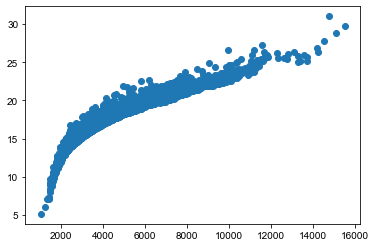

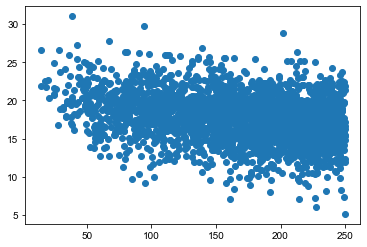

-- seeding chr:1 with 77 regions with 61 spot_groups
- diff in iter-0: 0.8852
- diff in iter-1: 0.0164
- diff in iter-2: 0.0328
- diff in iter-3: 0.0000
-- seeding chr:10 with 51 regions with 29 spot_groups
- diff in iter-0: 0.8966
- diff in iter-1: 0.0000
-- seeding chr:11 with 48 regions with 40 spot_groups
- diff in iter-0: 0.8750
- diff in iter-1: 0.0000
-- seeding chr:12 with 43 regions with 36 spot_groups
- diff in iter-0: 0.8611
- diff in iter-1: 0.0556
- diff in iter-2: 0.0000
-- seeding chr:13 with 45 regions with 38 spot_groups
- diff in iter-0: 0.8421
- diff in iter-1: 0.0526
- diff in iter-2: 0.0263
- diff in iter-3: 0.0000
-- seeding chr:14 with 42 regions with 29 spot_groups
- diff in iter-0: 0.8966
- diff in iter-1: 0.0000
-- seeding chr:15 with 40 regions with 33 spot_groups
- diff in iter-0: 0.8788
- diff in iter-1: 0.1212
- diff in iter-2: 0.0000
-- seeding chr:16 with 38 regions with 25 spot_groups
- diff in iter-0: 0.9600
- diff in iter-1: 0.0000
-- seeding chr:17 w

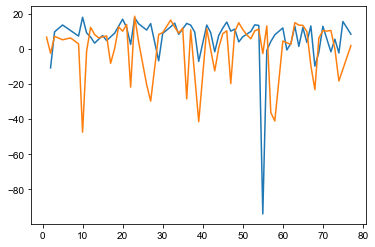

- diff in iter-1: 0.0796


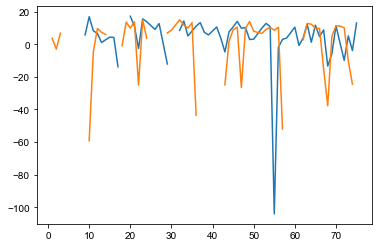

- diff in iter-2: 0.0310


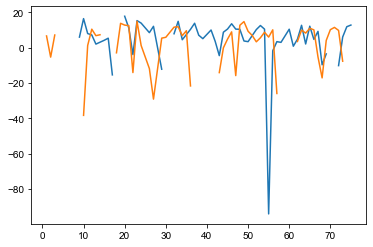

- diff in iter-3: 0.0221


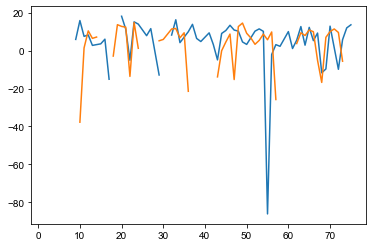

- diff in iter-4: 0.0265


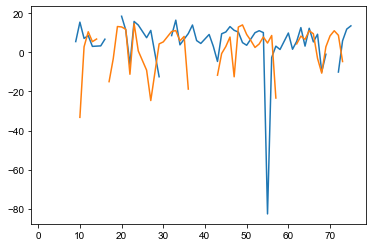

- diff in iter-5: 0.0310


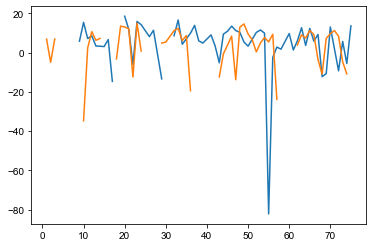

- diff in iter-6: 0.0265


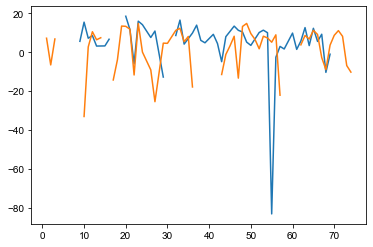

- diff in iter-7: 0.0310


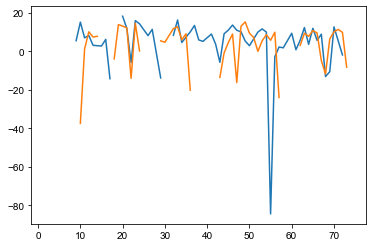

- diff in iter-8: 0.0310


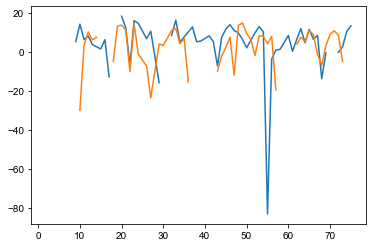

- diff in iter-9: 0.0221


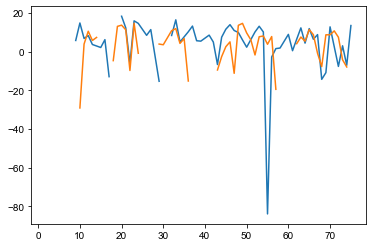

- diff in iter-10: 0.0221


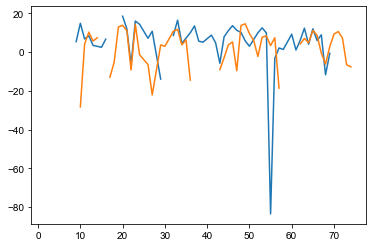

- diff in iter-11: 0.0177


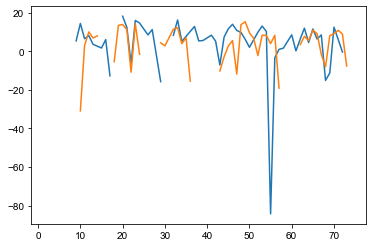

- diff in iter-12: 0.0177


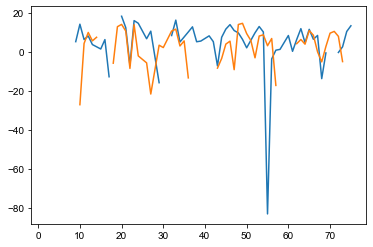

- diff in iter-13: 0.0177


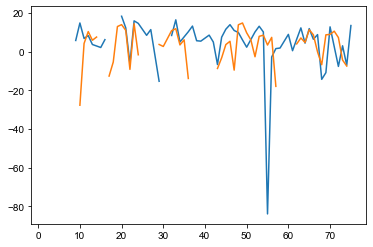

- diff in iter-14: 0.0177


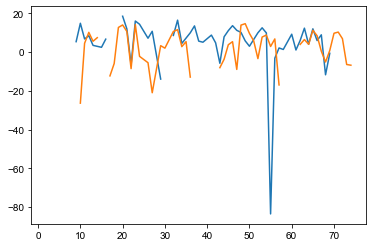

- diff in iter-15: 0.0177


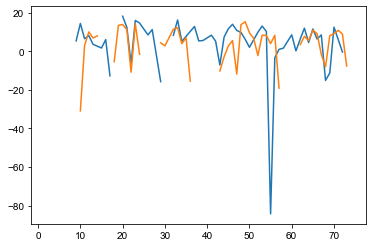

- diff in iter-16: 0.0177


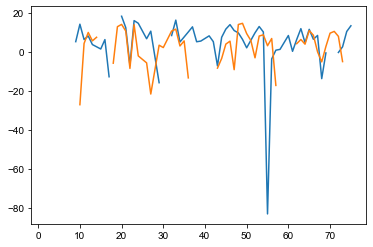

- diff in iter-17: 0.0177


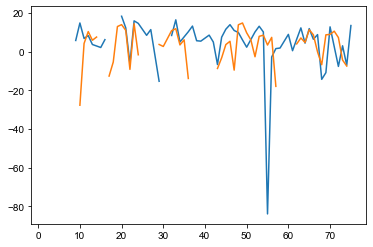

- diff in iter-18: 0.0177


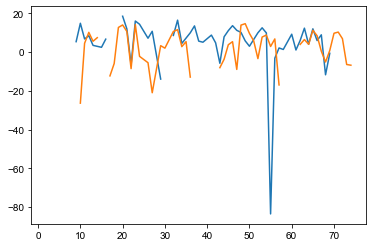

- diff in iter-19: 0.0177


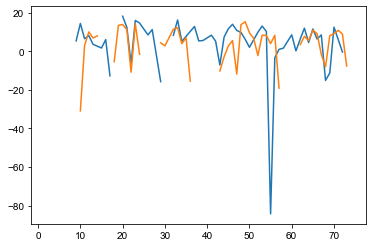

- diff in iter-20: 0.0177


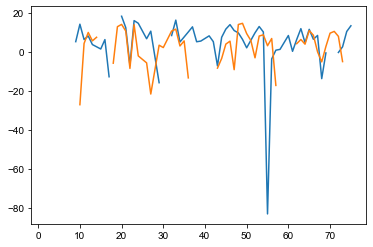

- processing chr:10
- diff in iter-0: 0.4882


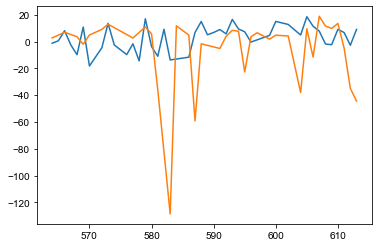

- diff in iter-1: 0.1575


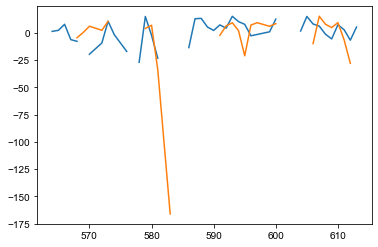

- diff in iter-2: 0.0630


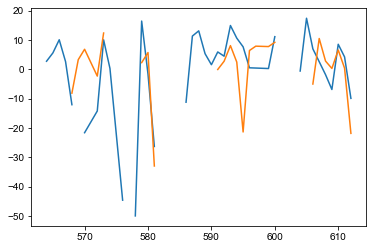

- diff in iter-3: 0.0315


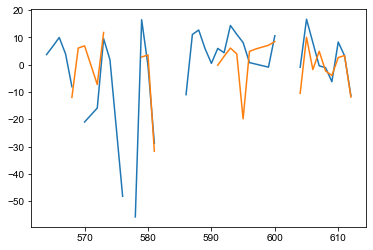

- diff in iter-4: 0.0394


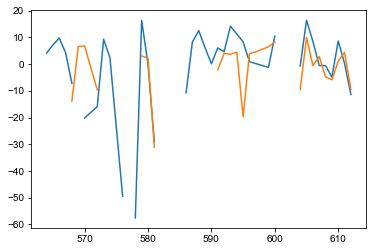

- diff in iter-5: 0.0157


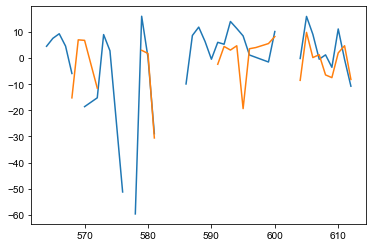

- diff in iter-6: 0.0551


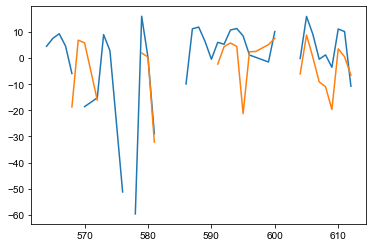

- diff in iter-7: 0.0394


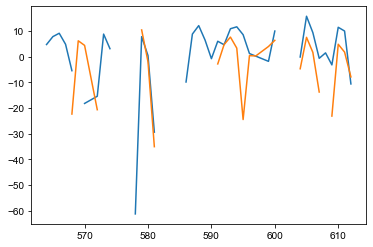

- diff in iter-8: 0.0236


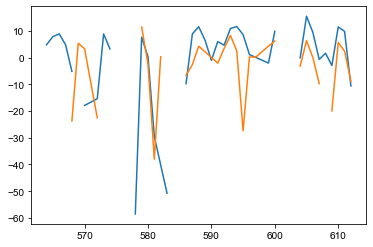

- diff in iter-9: 0.0472


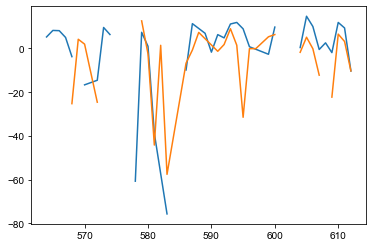

- diff in iter-10: 0.0472


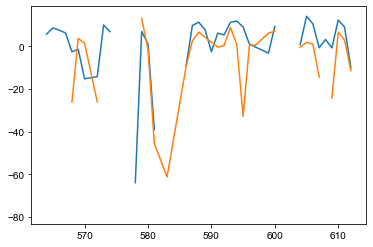

- diff in iter-11: 0.0157


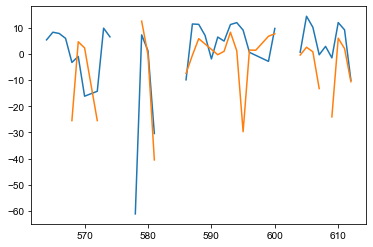

- diff in iter-12: 0.0079


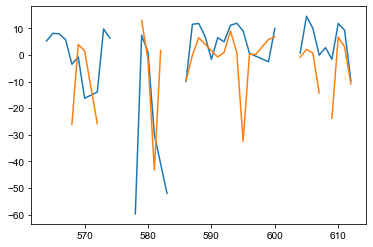

- diff in iter-13: 0.0000


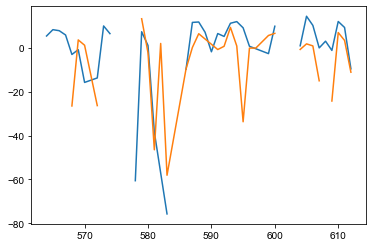

- processing chr:11
- diff in iter-0: 0.4654


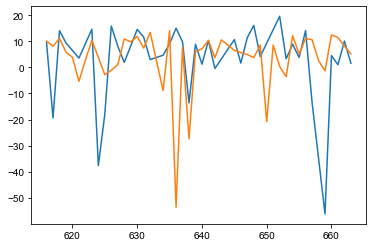

- diff in iter-1: 0.0566


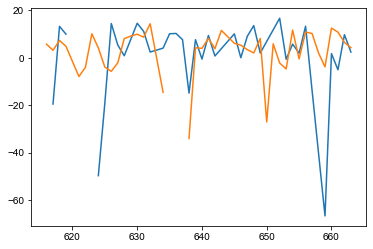

- diff in iter-2: 0.0314


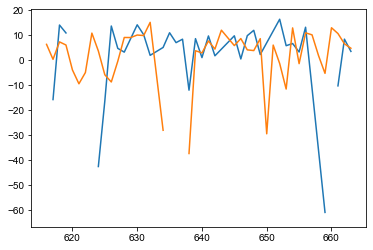

- diff in iter-3: 0.0063


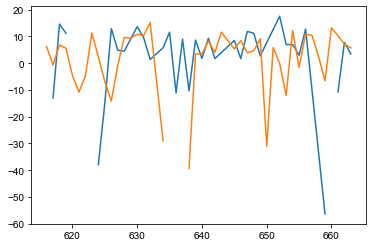

- diff in iter-4: 0.0063


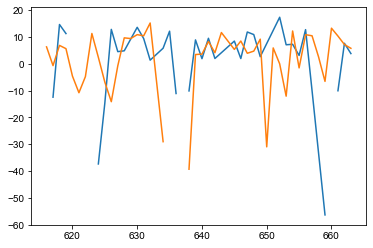

- diff in iter-5: 0.0063


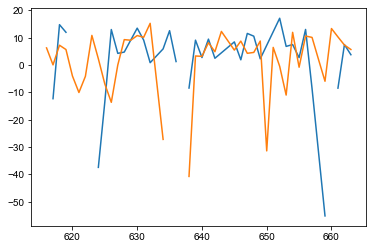

- diff in iter-6: 0.0000


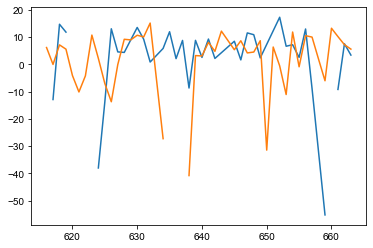

- processing chr:12
- diff in iter-0: 0.4887


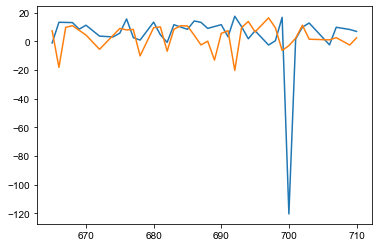

- diff in iter-1: 0.0677


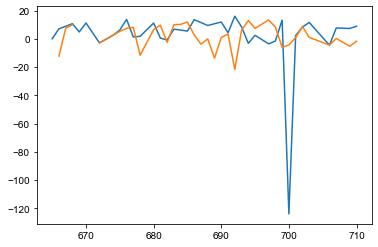

- diff in iter-2: 0.0376


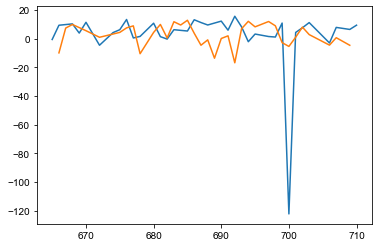

- diff in iter-3: 0.0301


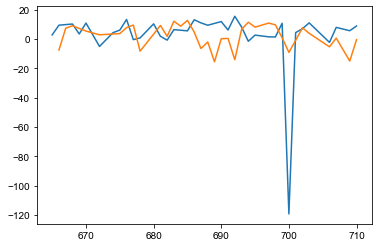

- diff in iter-4: 0.0150


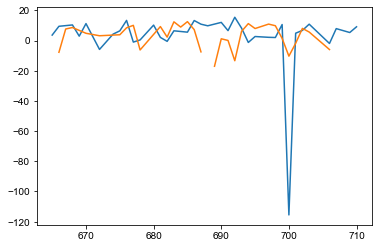

- diff in iter-5: 0.0226


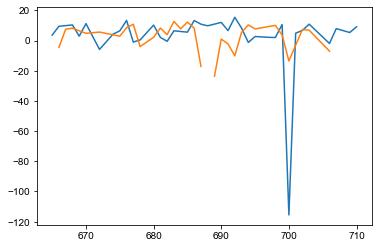

- diff in iter-6: 0.0150


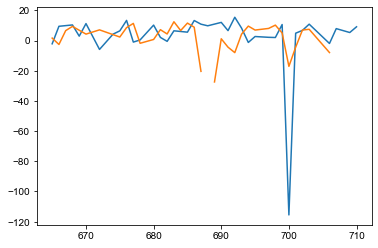

- diff in iter-7: 0.0150


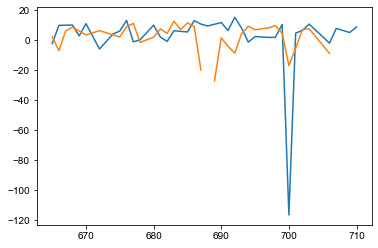

- diff in iter-8: 0.0075


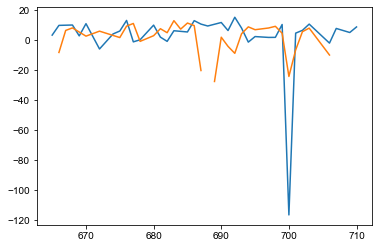

- diff in iter-9: 0.0075


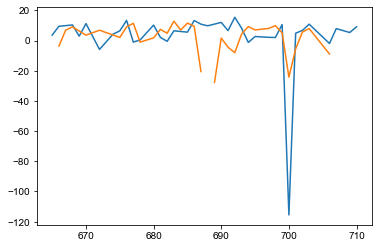

- diff in iter-10: 0.0150


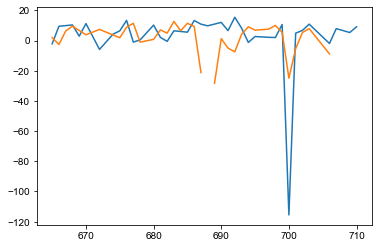

- diff in iter-11: 0.0075


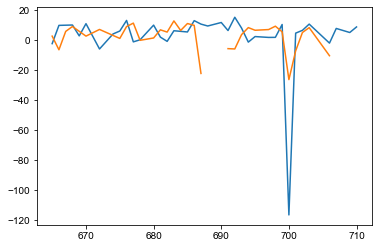

- diff in iter-12: 0.0226


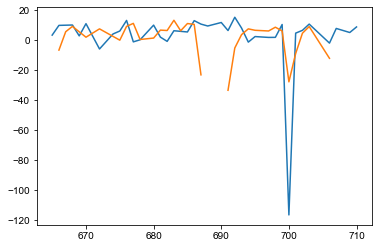

- diff in iter-13: 0.0226


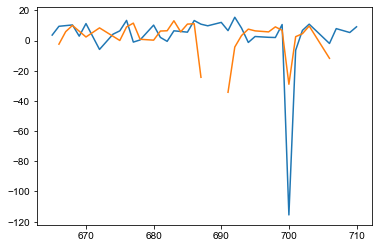

- diff in iter-14: 0.0150


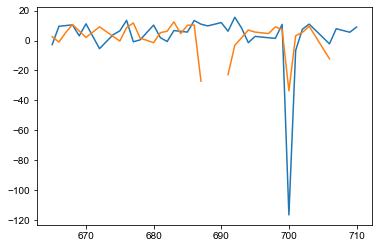

- diff in iter-15: 0.0150


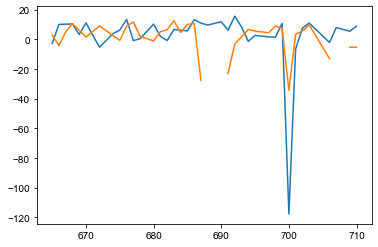

- diff in iter-16: 0.0075


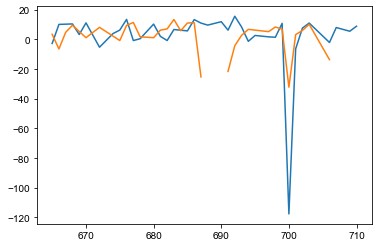

- diff in iter-17: 0.0075


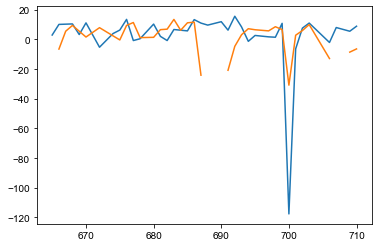

- diff in iter-18: 0.0075


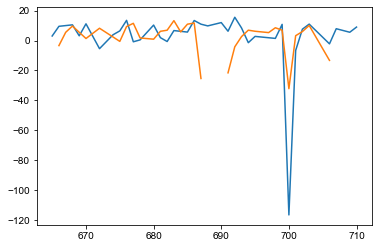

- diff in iter-19: 0.0150


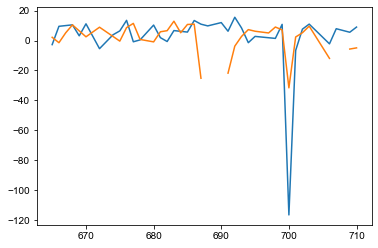

- diff in iter-20: 0.0075


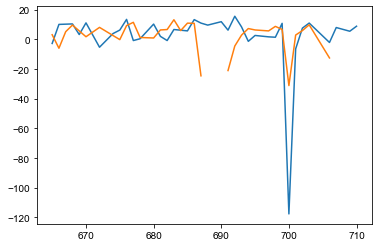

- processing chr:13
- diff in iter-0: 0.5203


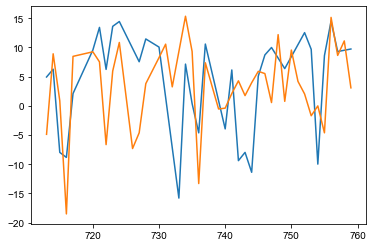

- diff in iter-1: 0.0732


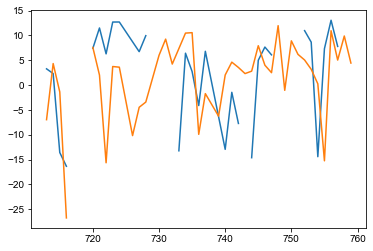

- diff in iter-2: 0.0244


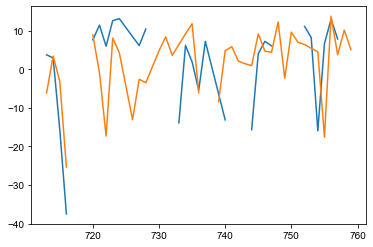

- diff in iter-3: 0.0081


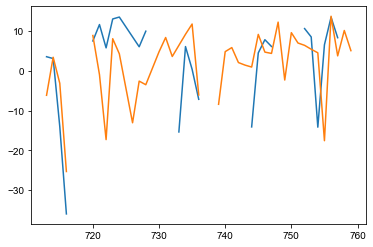

- diff in iter-4: 0.0000


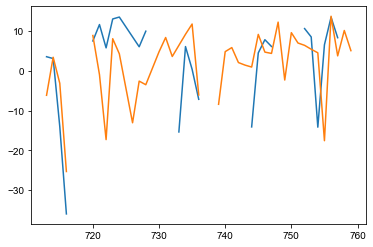

- processing chr:14
- diff in iter-0: 0.4904


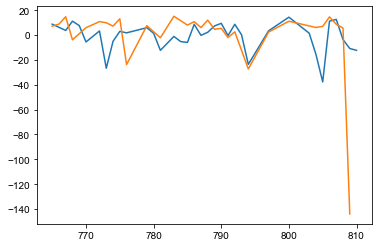

- diff in iter-1: 0.1058


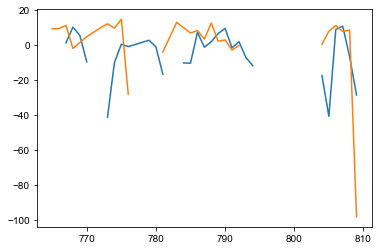

- diff in iter-2: 0.0288


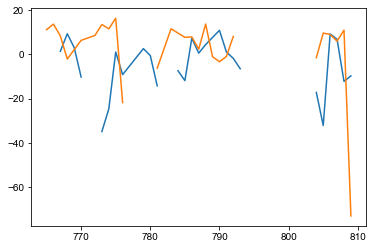

- diff in iter-3: 0.0673


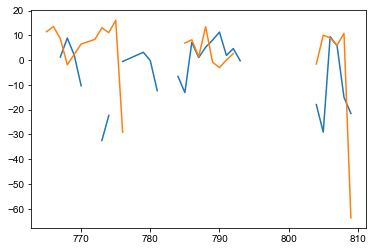

- diff in iter-4: 0.0385


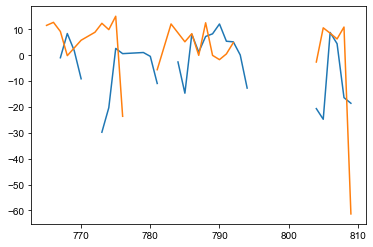

- diff in iter-5: 0.0288


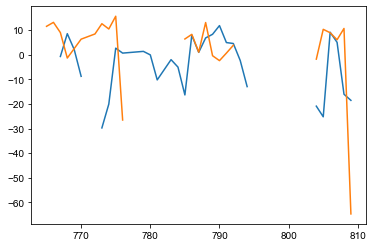

- diff in iter-6: 0.0288


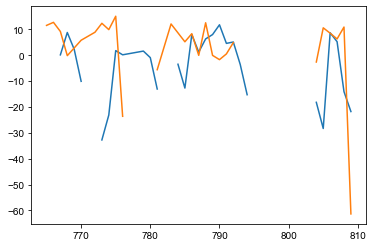

- diff in iter-7: 0.0288


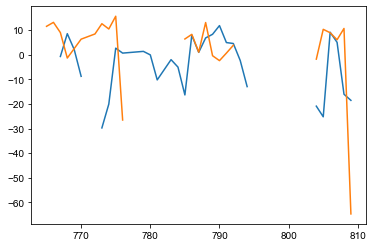

- diff in iter-8: 0.0288


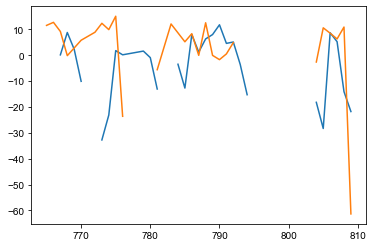

- diff in iter-9: 0.0288


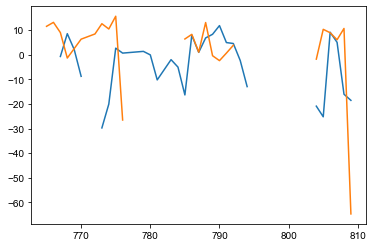

- diff in iter-10: 0.0288


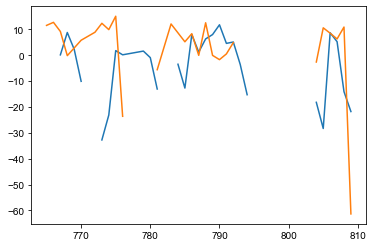

- diff in iter-11: 0.0288


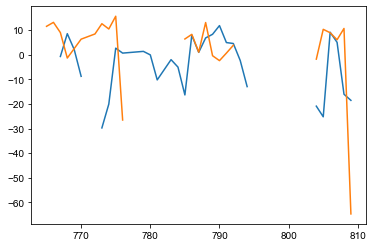

- diff in iter-12: 0.0288


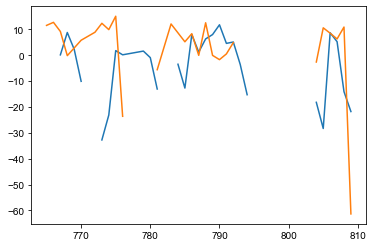

- diff in iter-13: 0.0288


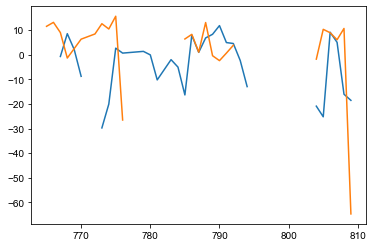

- diff in iter-14: 0.0288


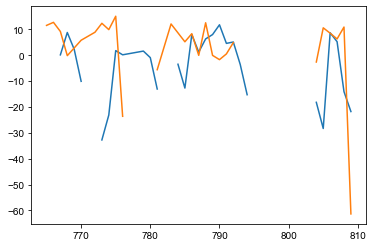

- diff in iter-15: 0.0288


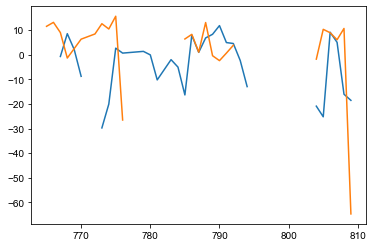

- diff in iter-16: 0.0288


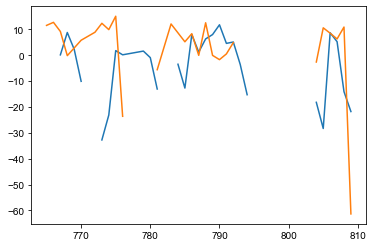

- diff in iter-17: 0.0288


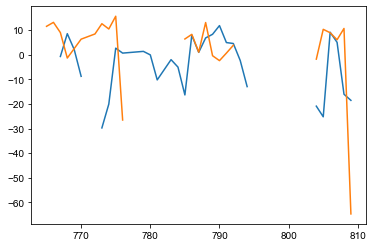

- diff in iter-18: 0.0288


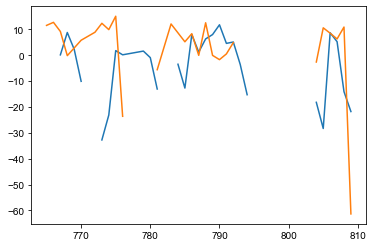

- diff in iter-19: 0.0288


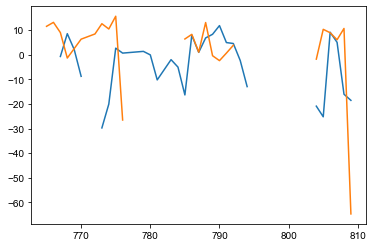

- diff in iter-20: 0.0288


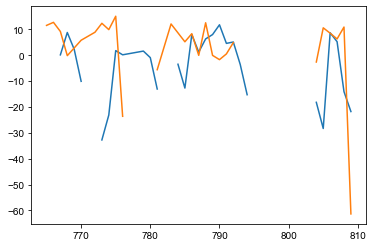

- processing chr:15
- diff in iter-0: 0.5421


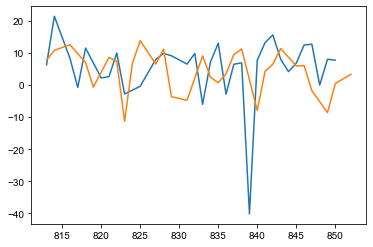

- diff in iter-1: 0.0748


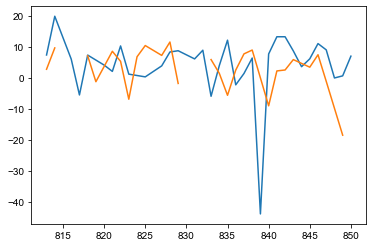

- diff in iter-2: 0.0093


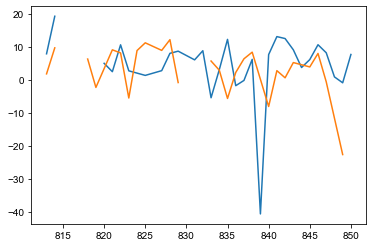

- diff in iter-3: 0.0000


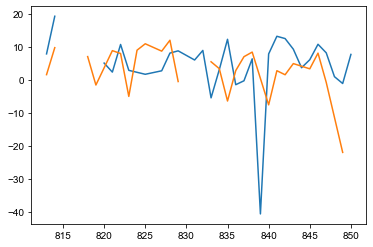

- processing chr:16
- diff in iter-0: 0.4792


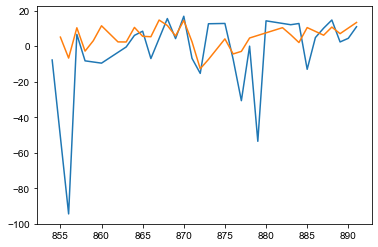

- diff in iter-1: 0.0729


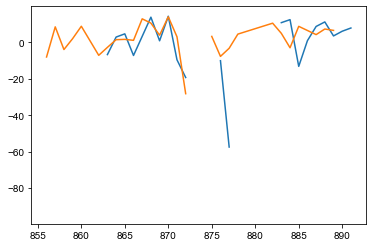

- diff in iter-2: 0.0729


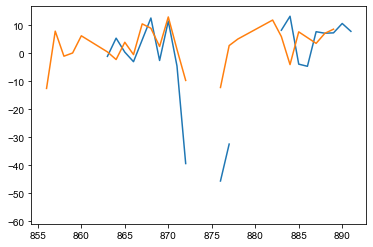

- diff in iter-3: 0.0417


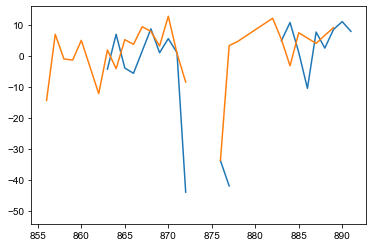

- diff in iter-4: 0.0208


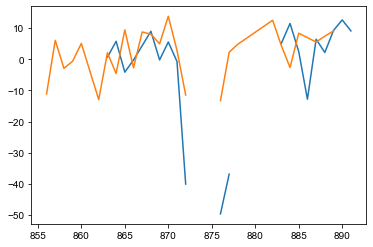

- diff in iter-5: 0.0104


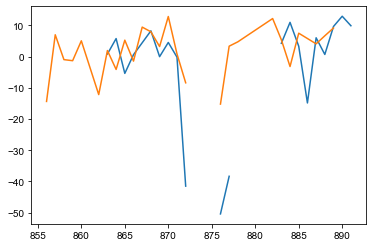

- diff in iter-6: 0.0208


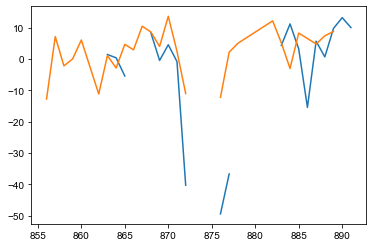

- diff in iter-7: 0.0625


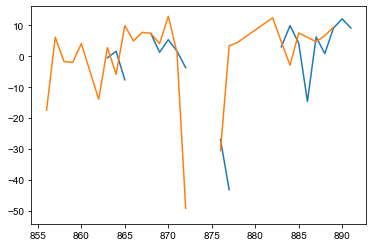

- diff in iter-8: 0.0729


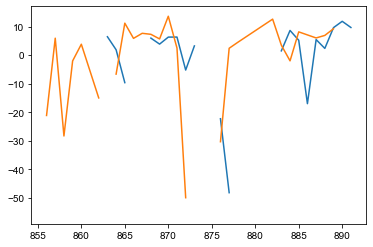

- diff in iter-9: 0.0521


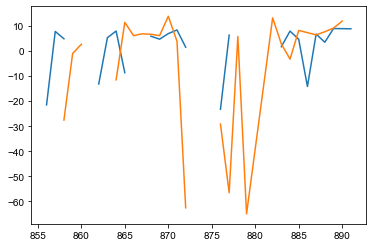

- diff in iter-10: 0.0521


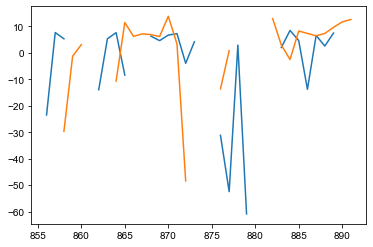

- diff in iter-11: 0.0417


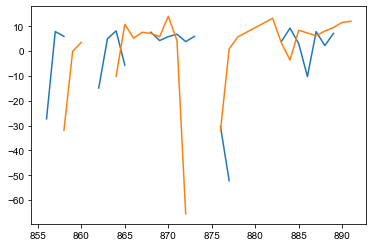

- diff in iter-12: 0.0417


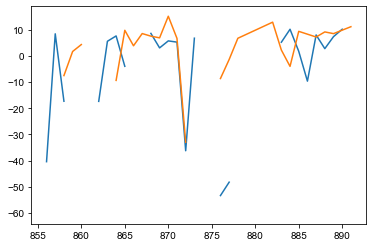

- diff in iter-13: 0.0312


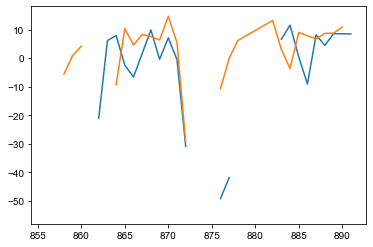

- diff in iter-14: 0.0312


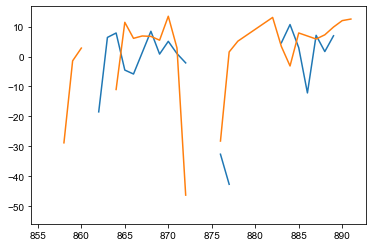

- diff in iter-15: 0.0208


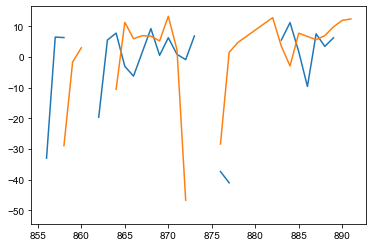

- diff in iter-16: 0.0208


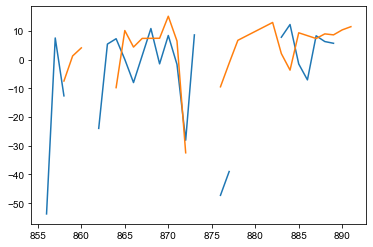

- diff in iter-17: 0.0104


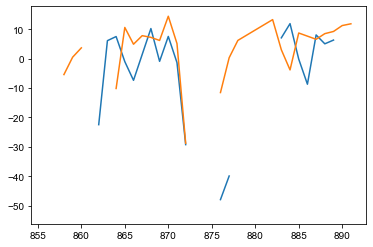

- diff in iter-18: 0.0312


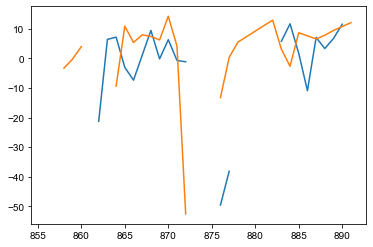

- diff in iter-19: 0.0625


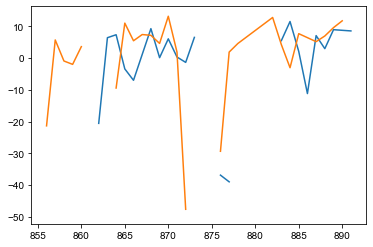

- diff in iter-20: 0.0625


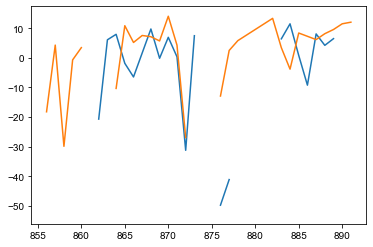

- processing chr:17
- diff in iter-0: 0.4043


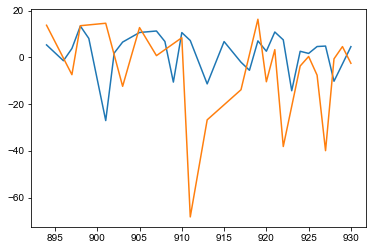

- diff in iter-1: 0.1915


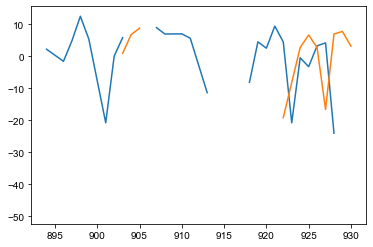

- diff in iter-2: 0.0851


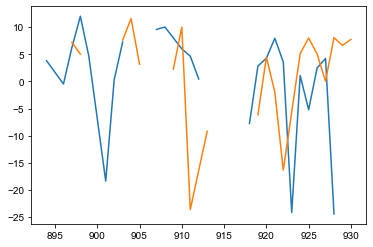

- diff in iter-3: 0.0426


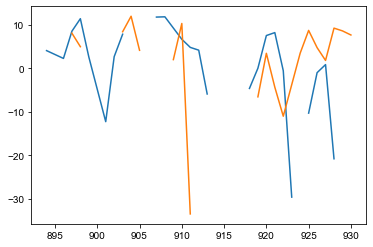

- diff in iter-4: 0.0213


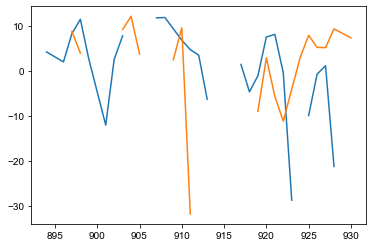

- diff in iter-5: 0.0106


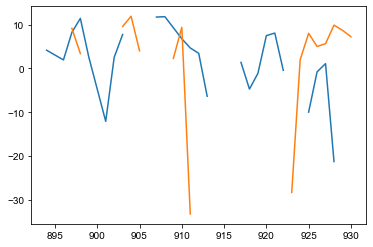

- diff in iter-6: 0.0213


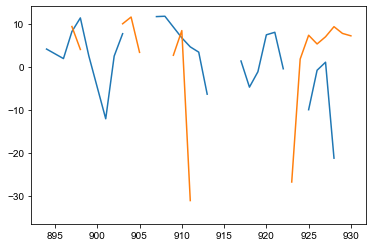

- diff in iter-7: 0.0106


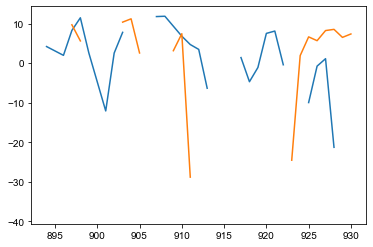

- diff in iter-8: 0.0106


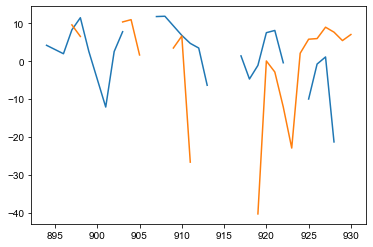

- diff in iter-9: 0.0000


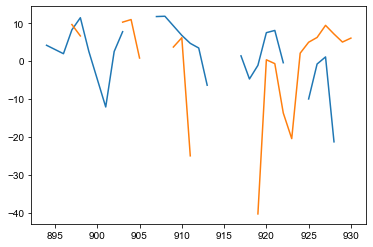

- processing chr:18
- diff in iter-0: 0.4773


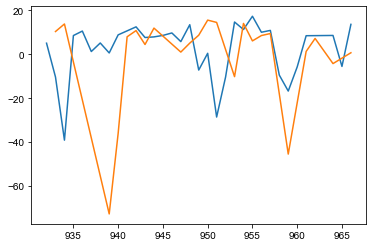

- diff in iter-1: 0.1023


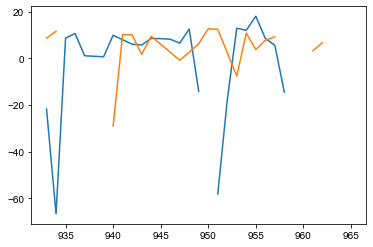

- diff in iter-2: 0.0682


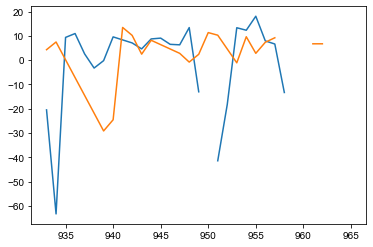

- diff in iter-3: 0.0455


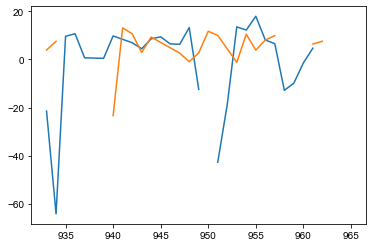

- diff in iter-4: 0.0341


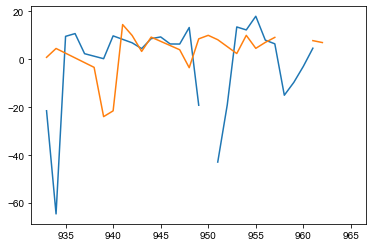

- diff in iter-5: 0.0227


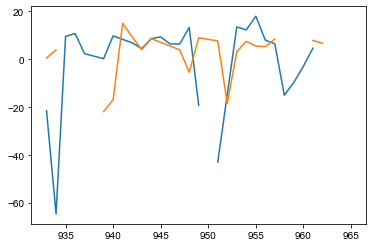

- diff in iter-6: 0.0114


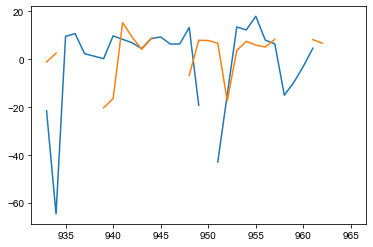

- diff in iter-7: 0.0000


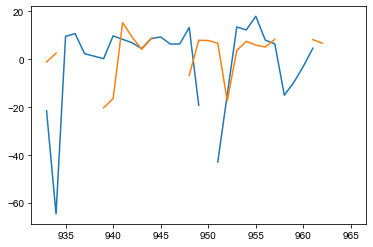

- processing chr:19
- diff in iter-0: 0.4675


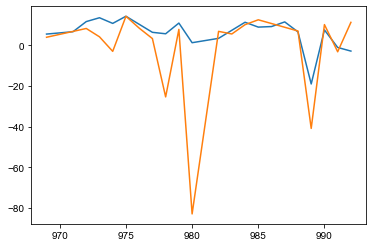

- diff in iter-1: 0.0519


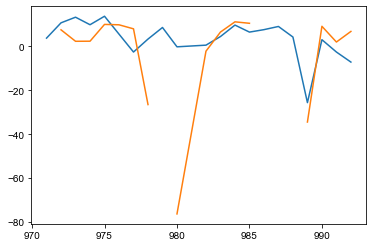

- diff in iter-2: 0.0779


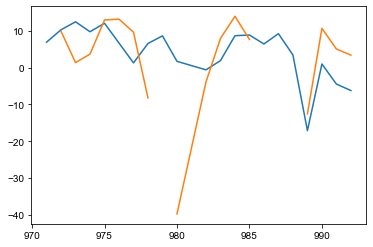

- diff in iter-3: 0.0260


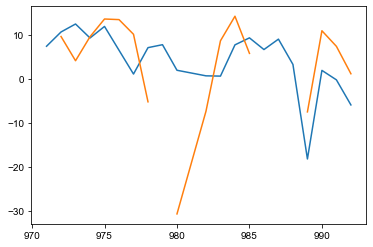

- diff in iter-4: 0.0390


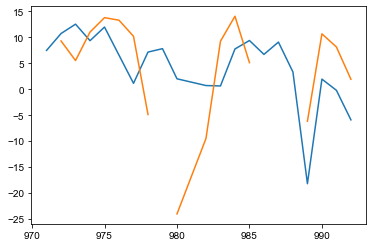

- diff in iter-5: 0.0260


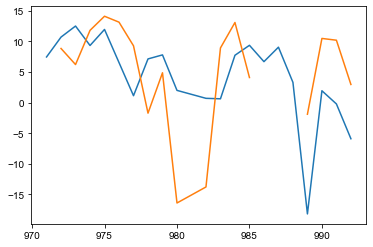

- diff in iter-6: 0.0260


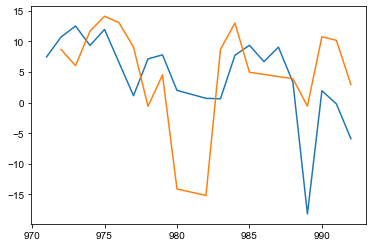

- diff in iter-7: 0.0260


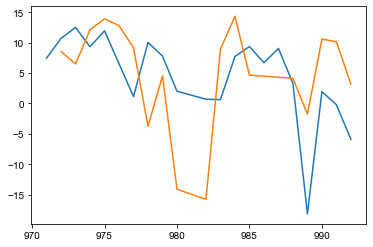

- diff in iter-8: 0.0000


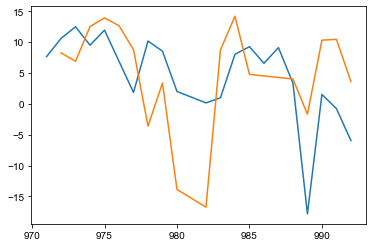

- processing chr:2
- diff in iter-0: 0.4742


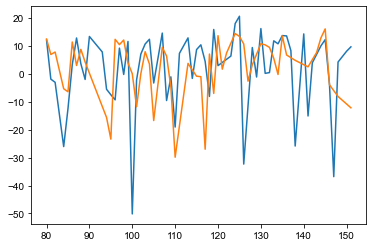

- diff in iter-1: 0.1031


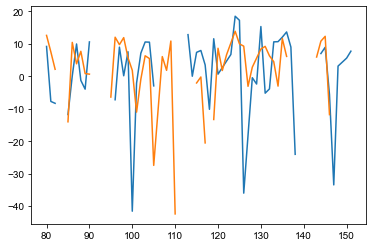

- diff in iter-2: 0.0258


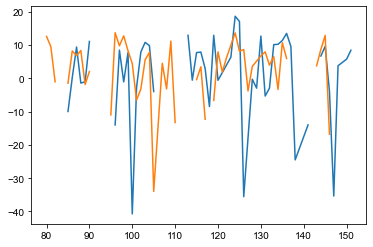

- diff in iter-3: 0.0361


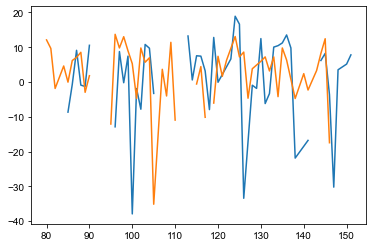

- diff in iter-4: 0.0103


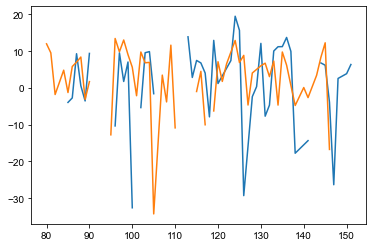

- diff in iter-5: 0.0103


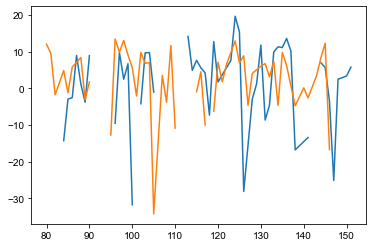

- diff in iter-6: 0.0052


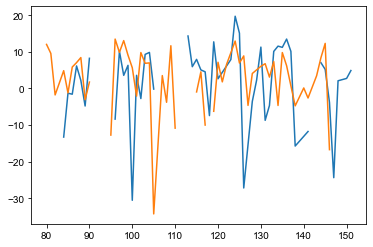

- diff in iter-7: 0.0000


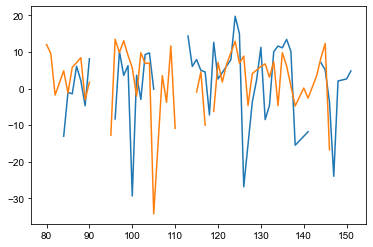

- processing chr:3
- diff in iter-0: 0.5030


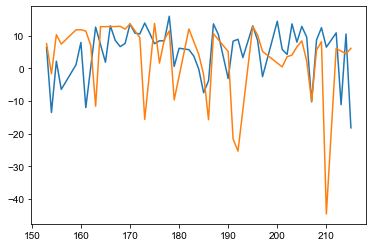

- diff in iter-1: 0.1091


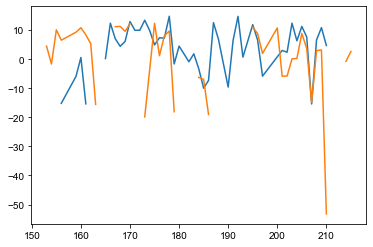

- diff in iter-2: 0.0424


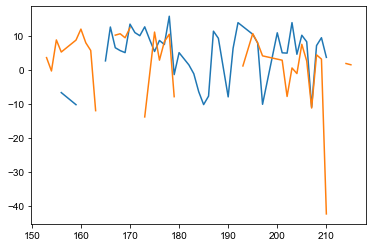

- diff in iter-3: 0.0364


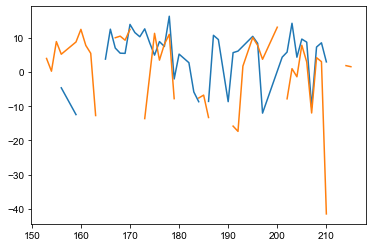

- diff in iter-4: 0.0242


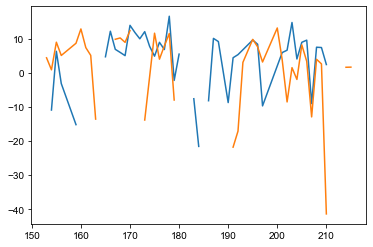

- diff in iter-5: 0.0000


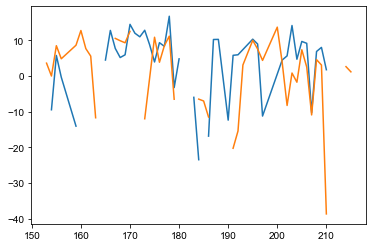

- processing chr:4
- diff in iter-0: 0.4947


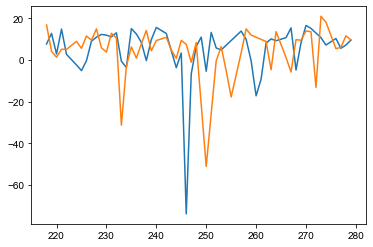

- diff in iter-1: 0.0632


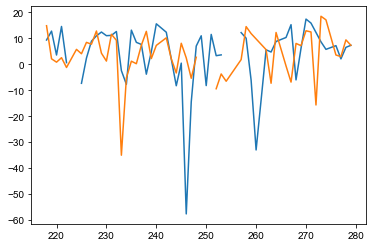

- diff in iter-2: 0.0105


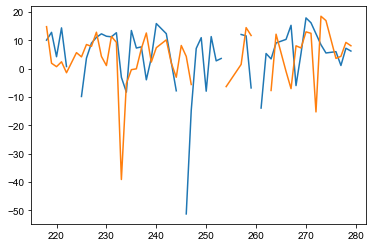

- diff in iter-3: 0.0158


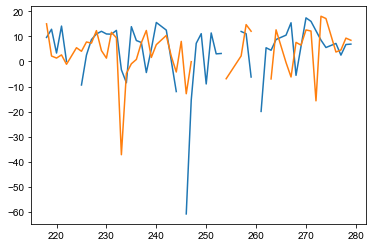

- diff in iter-4: 0.0158


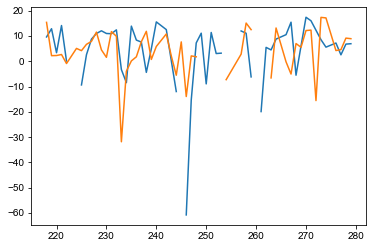

- diff in iter-5: 0.0105


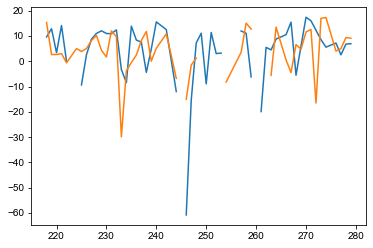

- diff in iter-6: 0.0053


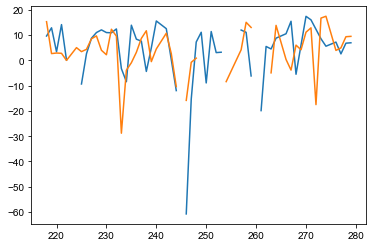

- diff in iter-7: 0.0158


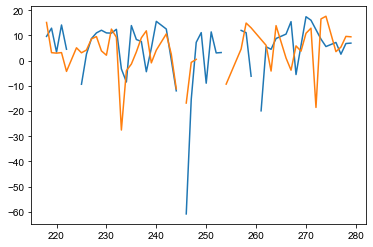

- diff in iter-8: 0.0158


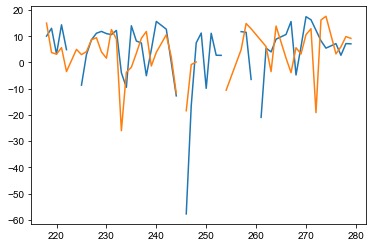

- diff in iter-9: 0.0053


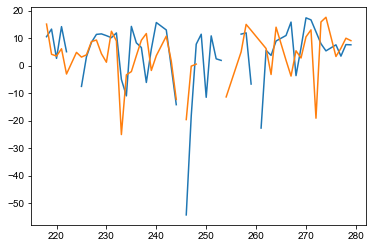

- diff in iter-10: 0.0000


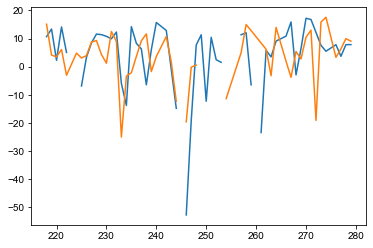

- processing chr:5
- diff in iter-0: 0.5031


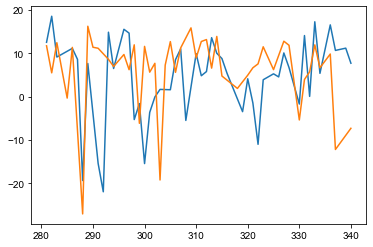

- diff in iter-1: 0.0994


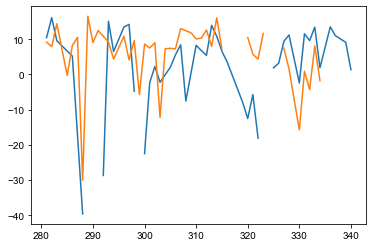

- diff in iter-2: 0.0559


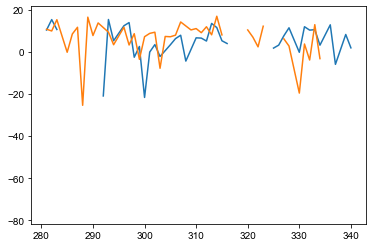

- diff in iter-3: 0.0311


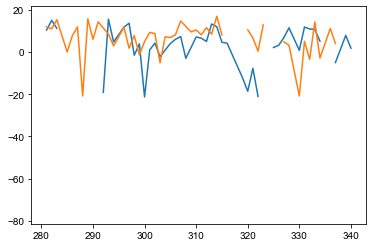

- diff in iter-4: 0.0062


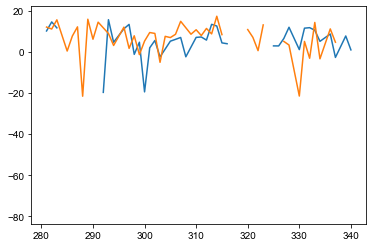

- diff in iter-5: 0.0000


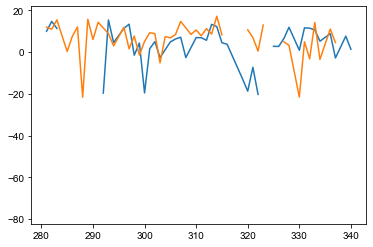

- processing chr:6
- diff in iter-0: 0.5118


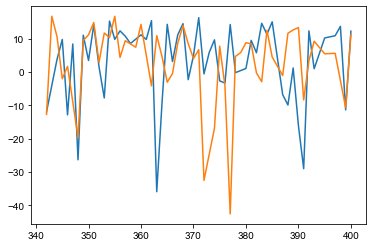

- diff in iter-1: 0.0882


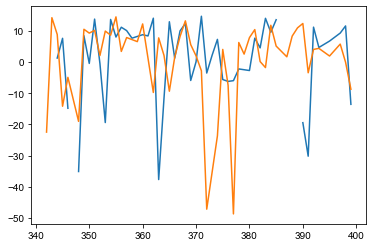

- diff in iter-2: 0.0588


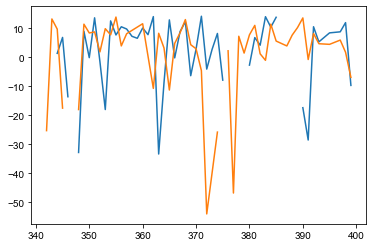

- diff in iter-3: 0.0412


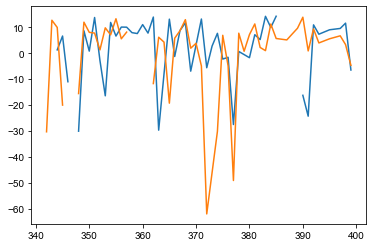

- diff in iter-4: 0.0294


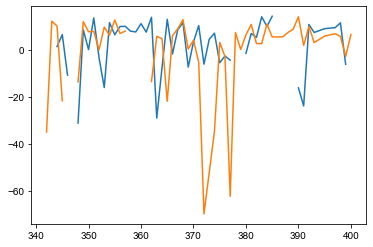

- diff in iter-5: 0.0118


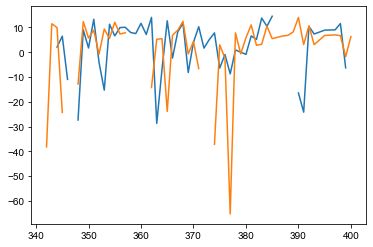

- diff in iter-6: 0.0294


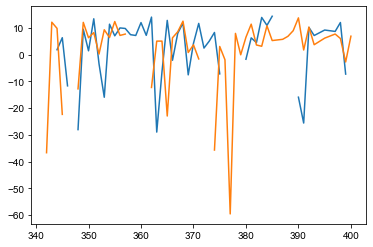

- diff in iter-7: 0.0353


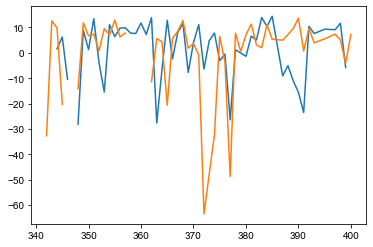

- diff in iter-8: 0.0176


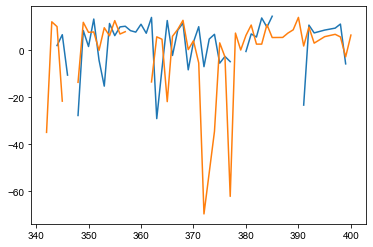

- diff in iter-9: 0.0176


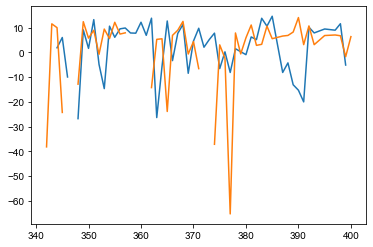

- diff in iter-10: 0.0294


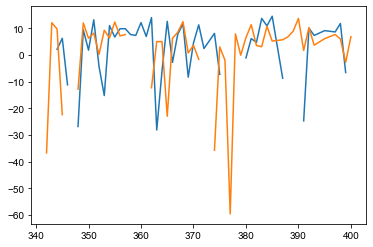

- diff in iter-11: 0.0412


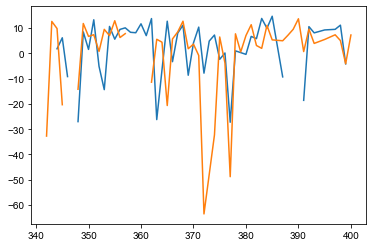

- diff in iter-12: 0.0176


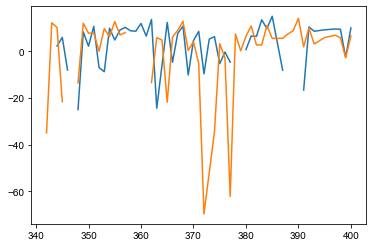

- diff in iter-13: 0.0176


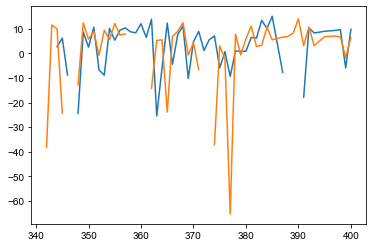

- diff in iter-14: 0.0235


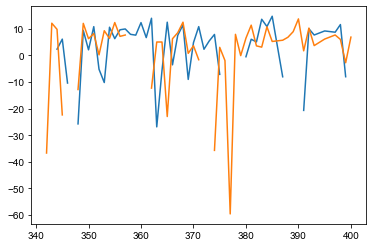

- diff in iter-15: 0.0353


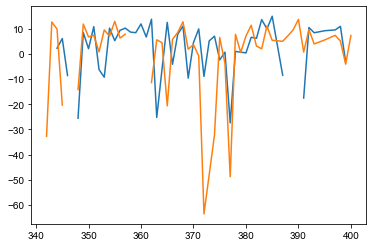

- diff in iter-16: 0.0176


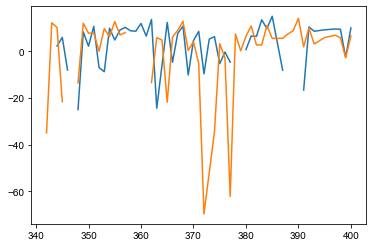

- diff in iter-17: 0.0176


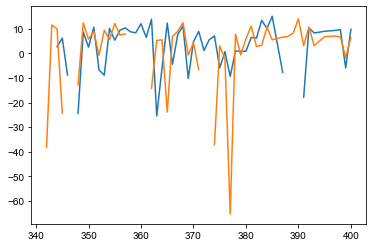

- diff in iter-18: 0.0235


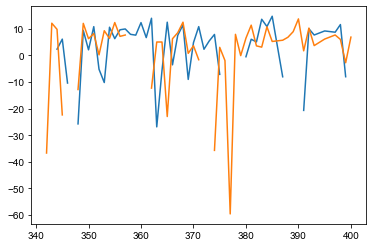

- diff in iter-19: 0.0353


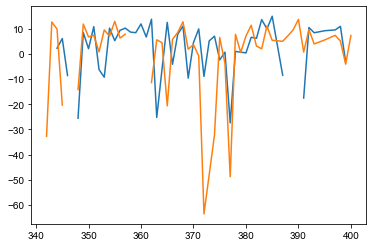

- diff in iter-20: 0.0176


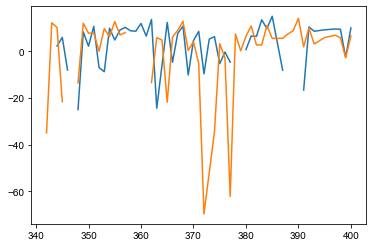

- processing chr:7
- diff in iter-0: 0.4765


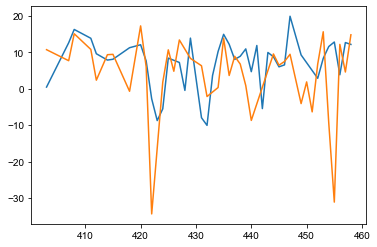

- diff in iter-1: 0.0805


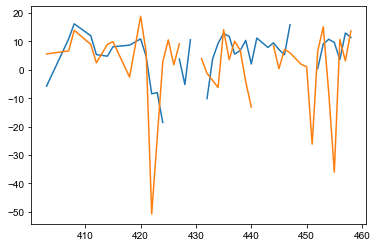

- diff in iter-2: 0.0134


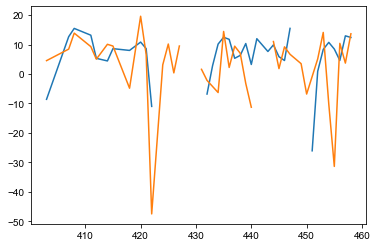

- diff in iter-3: 0.0134


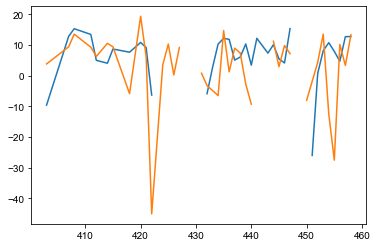

- diff in iter-4: 0.0067


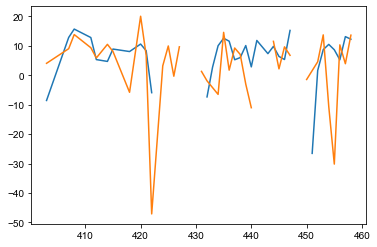

- diff in iter-5: 0.0134


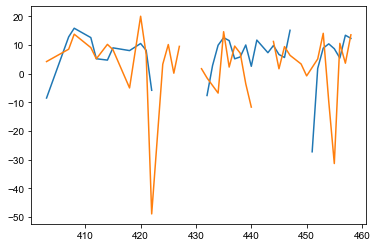

- diff in iter-6: 0.0134


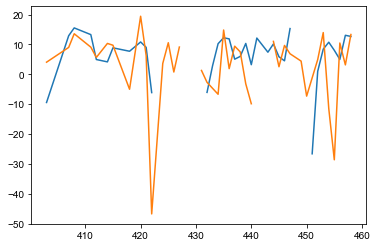

- diff in iter-7: 0.0067


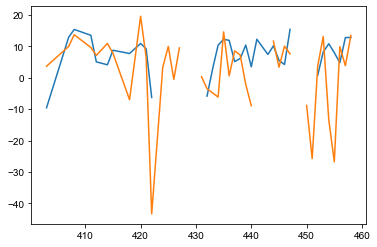

- diff in iter-8: 0.0067


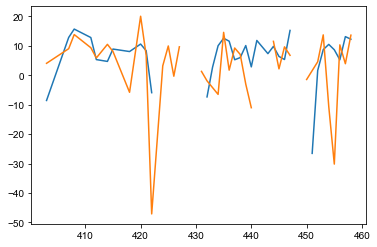

- diff in iter-9: 0.0134


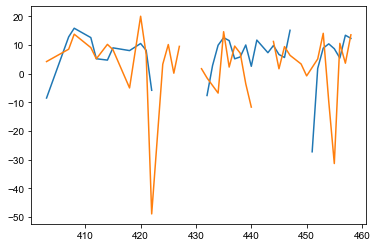

- diff in iter-10: 0.0134


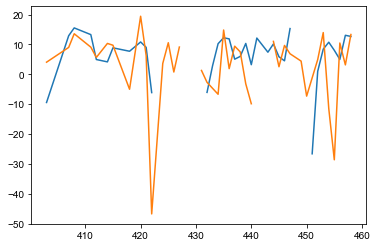

- diff in iter-11: 0.0067


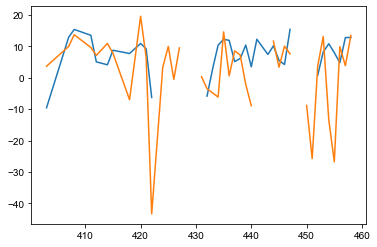

- diff in iter-12: 0.0067


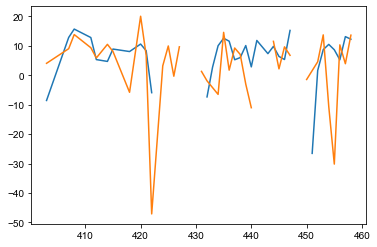

- diff in iter-13: 0.0134


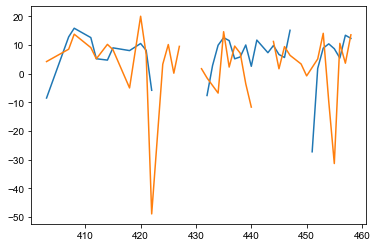

- diff in iter-14: 0.0134


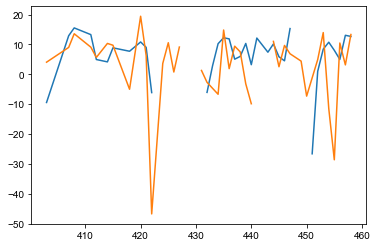

- diff in iter-15: 0.0067


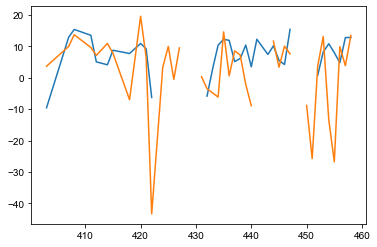

- diff in iter-16: 0.0067


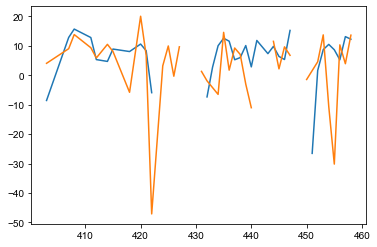

- diff in iter-17: 0.0134


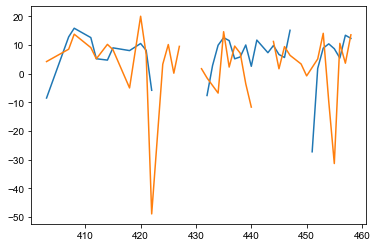

- diff in iter-18: 0.0134


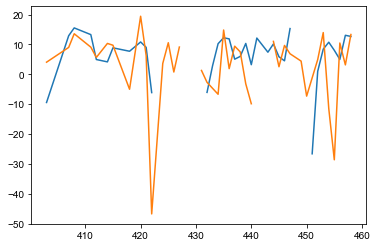

- diff in iter-19: 0.0067


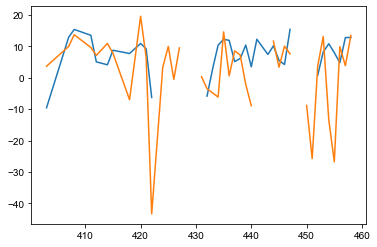

- diff in iter-20: 0.0067


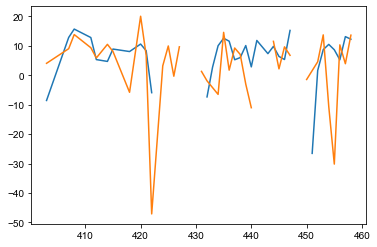

- processing chr:8
- diff in iter-0: 0.5035


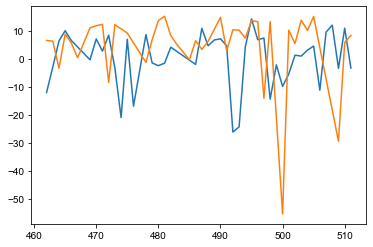

- diff in iter-1: 0.1135


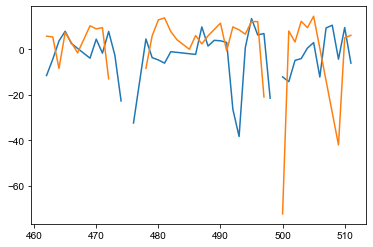

- diff in iter-2: 0.0213


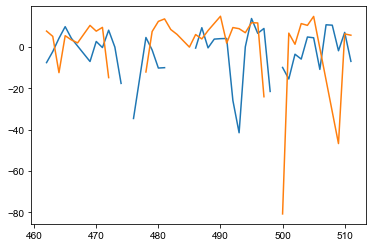

- diff in iter-3: 0.0213


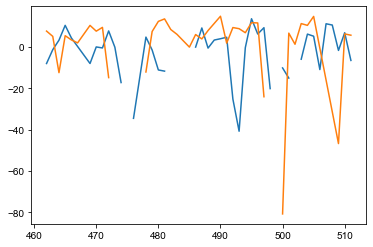

- diff in iter-4: 0.0000


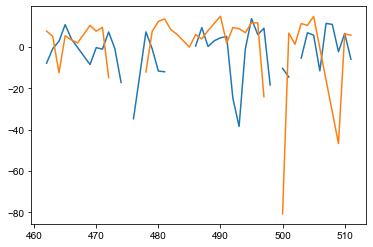

- processing chr:9
- diff in iter-0: 0.5323


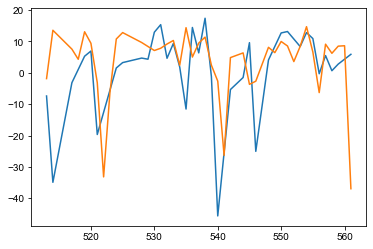

- diff in iter-1: 0.1129


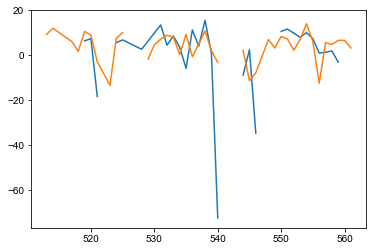

- diff in iter-2: 0.0645


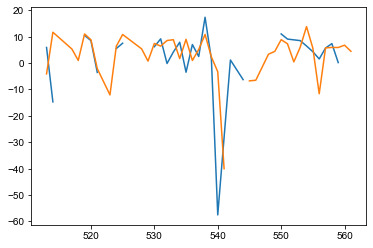

- diff in iter-3: 0.0323


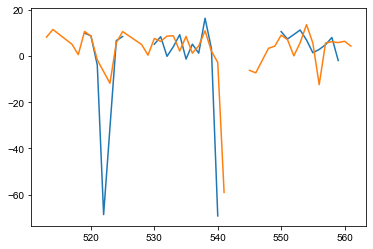

- diff in iter-4: 0.0242


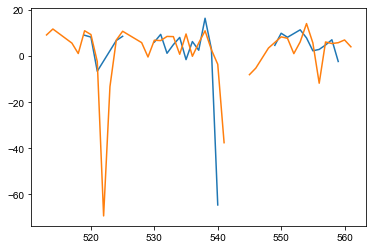

- diff in iter-5: 0.0323


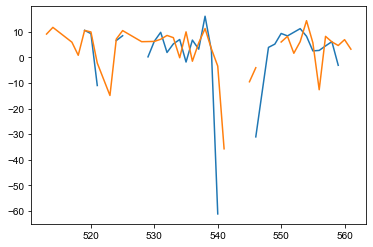

- diff in iter-6: 0.0161


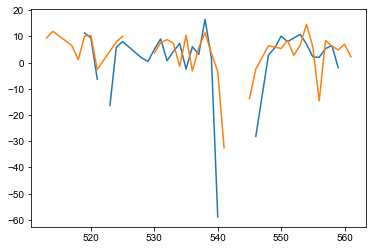

- diff in iter-7: 0.0081


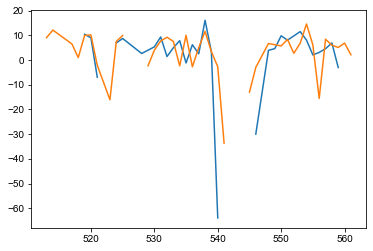

- diff in iter-8: 0.0000


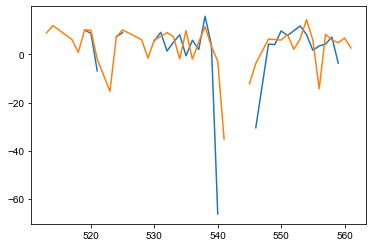

- processing chr:X
- diff in iter-0: 0.5500


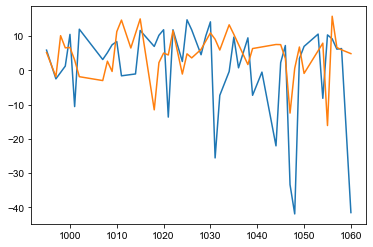

- diff in iter-1: 0.1143


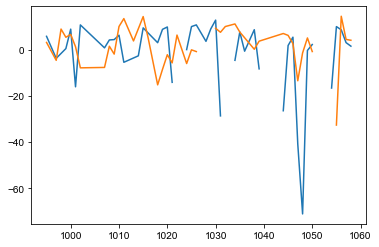

- diff in iter-2: 0.0286


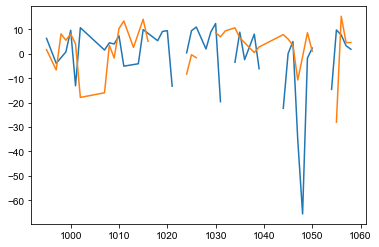

- diff in iter-3: 0.0214


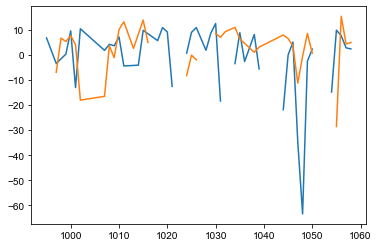

- diff in iter-4: 0.0286


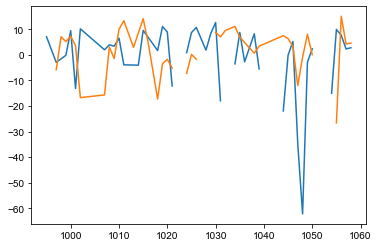

- diff in iter-5: 0.0071


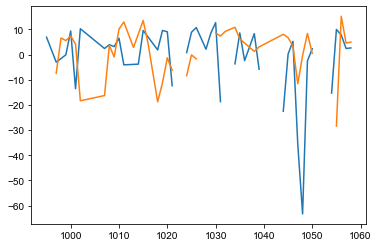

- diff in iter-6: 0.0214


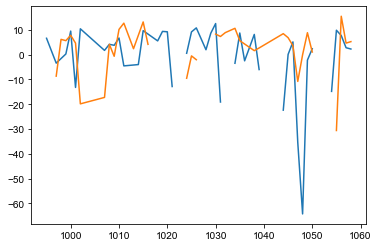

- diff in iter-7: 0.0071


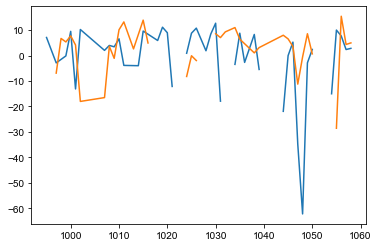

- diff in iter-8: 0.0214


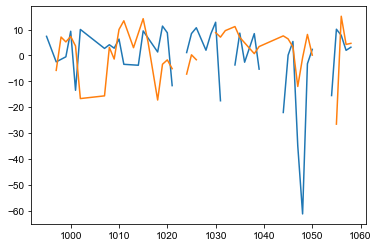

- diff in iter-9: 0.0071


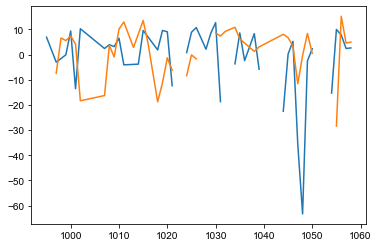

- diff in iter-10: 0.0214


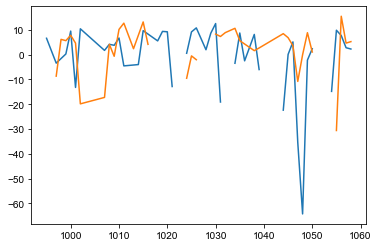

- diff in iter-11: 0.0071


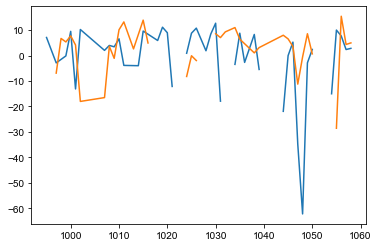

- diff in iter-12: 0.0214


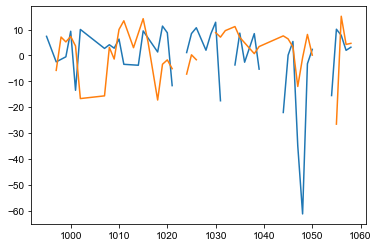

- diff in iter-13: 0.0071


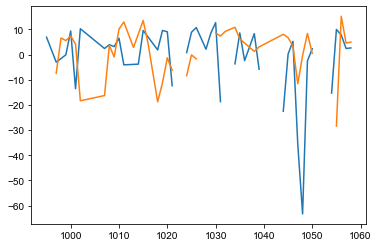

- diff in iter-14: 0.0214


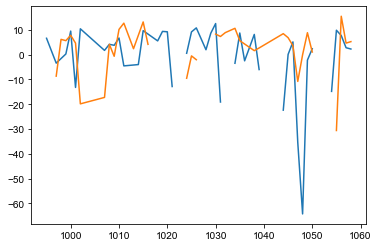

- diff in iter-15: 0.0071


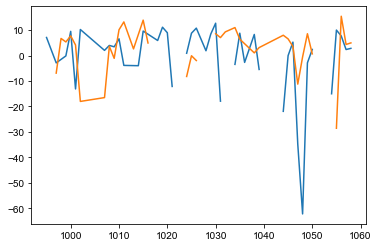

- diff in iter-16: 0.0214


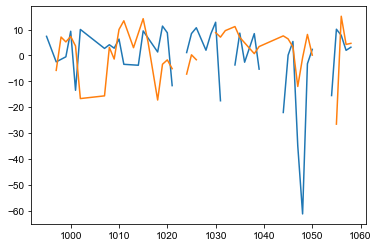

- diff in iter-17: 0.0071


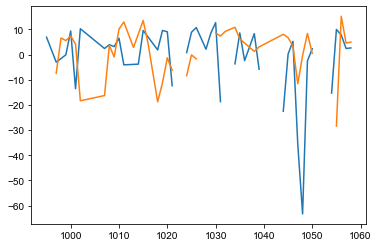

- diff in iter-18: 0.0214


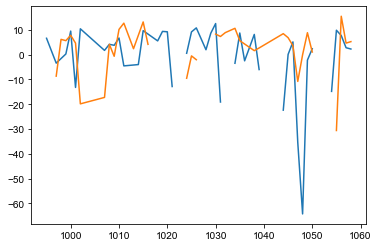

- diff in iter-19: 0.0071


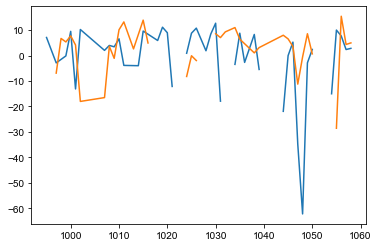

- diff in iter-20: 0.0214


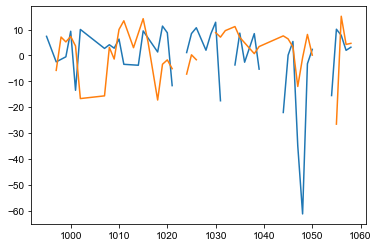

..\..\..\..\Documents\ImageAnalysis3\classes\decode.py:510: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  cmap.set_bad([0.5,0.5,0.5])


- Saving decoder into file: M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\Decoder\Conv_zscan_000_Cell-1_Decoder.pkl
Wall time: 1min 9s


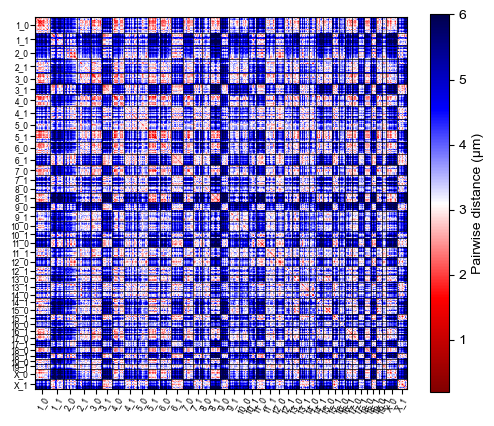

In [1180]:
%%time

# load spot_file
#spot_filename = r'M:\Pu_Temp\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\CandSpots\Conv_zscan_000_Cell-1_CandSpots.pkl'
cand_spots_dict = pickle.load(open(spot_filename, 'rb'))
cand_spots_list = []
for _i in np.arange(1, codebook.shape[1]+1):
    if _i in cand_spots_dict:
        cand_spots_list.append(Spots3D(cand_spots_dict[_i], bits=_i))
    else:
        cand_spots_list.append([])
        
# create decoder folder
decoder_filename = spot_filename.replace('CandSpots', 'Decoder')
if not os.path.exists(os.path.dirname(decoder_filename)):
    print(os.path.dirname(decoder_filename))
    os.makedirs(os.path.dirname(decoder_filename))

# create decoder class
decoder = DNA_Merfish_Decoder(cand_spots_list, codebook_filename, 
                              pixel_sizes=pixel_sizes, valid_score_th=-10,
                              savefile=decoder_filename,
                              )

decoder.prepare_spot_tuples(pair_search_radius=250)

self_scores = decoder.calculate_self_scores(make_plots=True)

chrs_2_init_centers = decoder.init_homolog_assignment()

chr_2_assigned_tuple_list, chr_2_zxys_list, chr_2_chr_centers= \
    decoder.finish_homolog_assignment(plot_stats=True, verbose=True)

figure_zxys_list, figure_labels, figure_label_ids = decoder.summarize_zxys_all_chromosomes()

# distmap
distmap_filename = decoder_filename.replace('Decoder.pkl', 'AllDistmap.png')
_ax = decoder.summarize_to_distmap(decoder, save_filename=distmap_filename) 

decoder.save(overwrite=True)

<IPython.core.display.Javascript object>


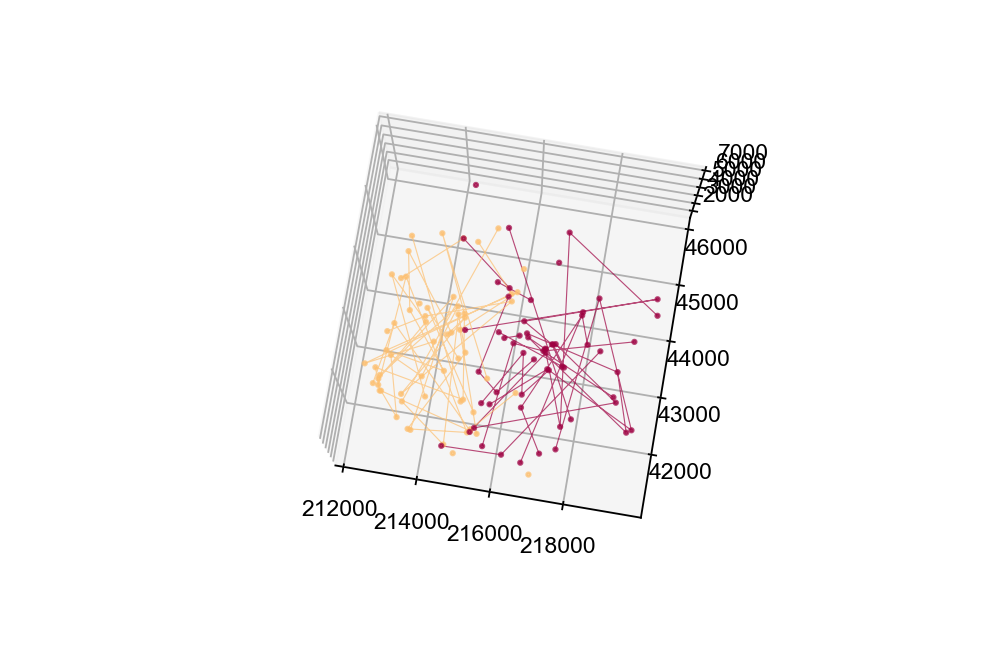

2022-01-13 16:08:49,978 [WARNING] *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
2022-01-13 16:08:49,983 [WARNING] *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


In [1140]:
%matplotlib notebook
def rotate(angle):
     ax.view_init(azim=angle)
        
from matplotlib import animation

from matplotlib.cm import Reds, Blues, Spectral
fig = plt.figure(dpi=150)
ax = fig.add_subplot(projection='3d')

homolog_zxys = decoder.chr_2_zxys_list['1']

for _ichr, _zxys in enumerate(homolog_zxys):
    
    ax.scatter(_zxys[:,1], _zxys[:,2], _zxys[:,0],
               cmap=Spectral, 
               c=Spectral(_ichr/(len(homolog_zxys)+1)),
               #c=homolog_labels,
               alpha=0.7,
               s=3)

    ax.plot(_zxys[:,1], _zxys[:,2], _zxys[:,0], linewidth=0.5,
            alpha=0.7,
            color = Spectral( _ichr/(len(homolog_zxys)+1) ) )
    
plt.show()

<AxesSubplot:>

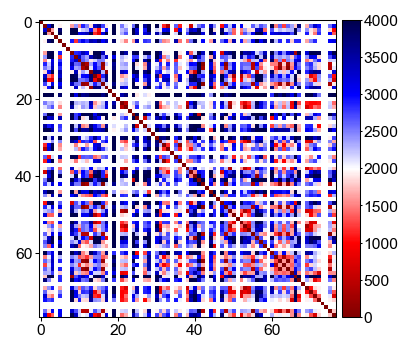

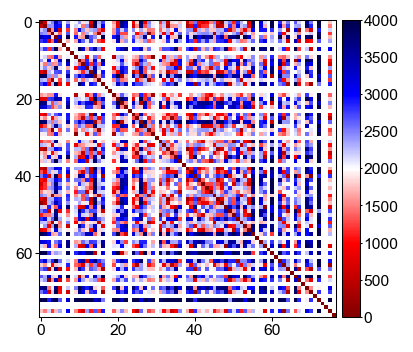

In [1040]:
%matplotlib inline
from scipy.spatial.distance import pdist, squareform

_homolog_distmap = squareform(pdist(homolog_zxys[0]))
ia.figure_tools.distmap.plot_distance_map(_homolog_distmap, color_limits=[0,4000], figure_dpi=150)
_homolog_distmap = squareform(pdist(homolog_zxys[1]))
ia.figure_tools.distmap.plot_distance_map(_homolog_distmap, color_limits=[0,4000], figure_dpi=150)

In [1041]:
homolog_2_zxys_list = classes.decode.DNA_Merfish_Decoder.convert_chr_dict_to_homolog_dict(decoder.chr_2_zxys_list)

'M:\\Pu_Temp\\20211220-P_brain_CTP11-1000_CTP12-DNA_from_1216\\CandSpots\\Conv_zscan_000_Cell-3_CandSpots.pkl'

In [ ]:
test_save_file = 

C:\Users\puzheng\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  """


<AxesSubplot:>

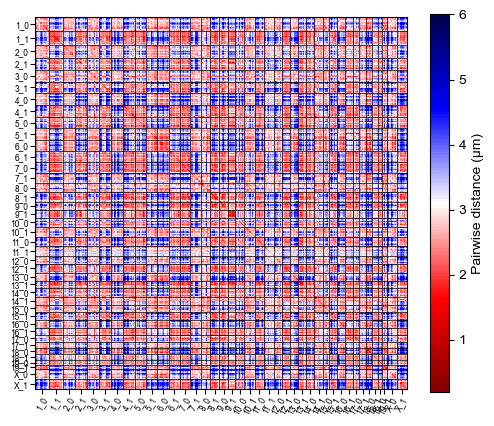

C:\Users\puzheng\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic_r"))
  after removing the cwd from sys.path.


<IPython.core.display.Javascript object>


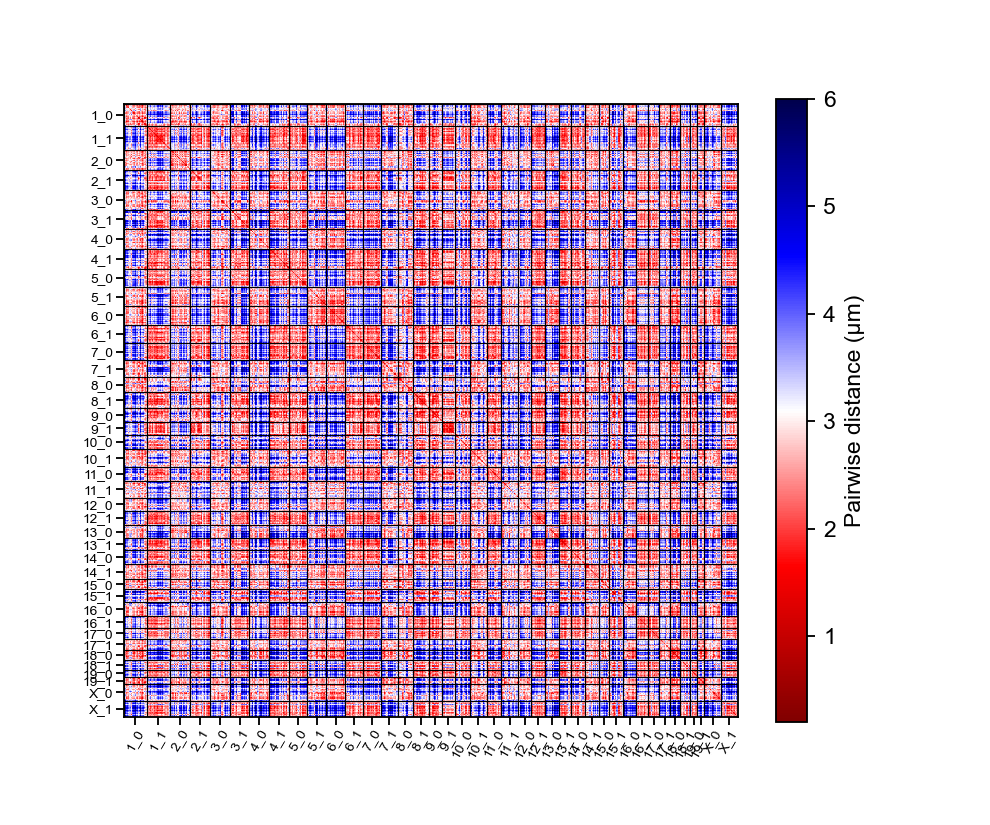

(1585.0, 0.0)

In [1146]:
%matplotlib notebook
